In [1]:
import pandas as pd
import numpy as np
import warnings
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.vector_ar.var_model import VAR
from xgboost import XGBRegressor
from statsmodels.tsa.seasonal import STL
from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy.stats import ttest_rel
from scipy.signal import medfilt
warnings.filterwarnings('ignore')

In [2]:
# Step 1: Load the Excel file
file_path = "C:/Users/User/OneDrive/Desktop/thesis/Data_Belisario.xlsx"
df = pd.read_excel(file_path)

In [3]:
# Step 2: Convert Date_Time to datetime and set as index
df['Date_Time'] = pd.to_datetime(df['Date_Time'], errors='coerce')
df.set_index('Date_Time', inplace=True)

In [4]:
# Step 3: Convert all columns to numeric, forcing errors to NaN
df = df.apply(pd.to_numeric, errors='coerce')
print("✅ Raw data loaded:", df.shape)

✅ Raw data loaded: (181176, 12)


In [5]:
start_date = "2023-09-1"
end_date   = "2024-08-31"
df = df.loc[start_date:end_date].copy()
print(f"📏 Cleaning only 1-year window: {start_date} → {end_date} (rows={len(df)})")

📏 Cleaning only 1-year window: 2023-09-1 → 2024-08-31 (rows=8784)


In [6]:
# Count of missing values per column
missing_count = df.isna().sum()
missing_percent = (df.isna().mean() * 100).round(2)
missing_summary = pd.DataFrame({
    'MissingCount': missing_count,
    'MissingPercent': missing_percent
})
missing_summary = missing_summary[missing_summary['MissingCount'] > 0]
missing_summary = missing_summary.sort_values(by='MissingPercent', ascending=False)
print("🔍 Columns with Missing Values:")
print(missing_summary)

🔍 Columns with Missing Values:
                        MissingCount  MissingPercent
CO_mg/m3                         604            6.88
O3_ug/m3                         376            4.28
Rain_mm                          356            4.05
NO2 ug/m3                        258            2.94
SO2 ug/m3                        252            2.87
PM2.5_ug/m3                      133            1.51
Wind Direction_Degrees            66            0.75
Wind Speed_m/s                    66            0.75
Temperature_C                     63            0.72
Relative humidity_%               63            0.72
Solar RadiationW/m2               62            0.71
Atm Pressure_mb                   61            0.69


In [7]:
# Separate pollutant groups
# ============================================================
pollutants_ug = ["NO2 ug/m3","SO2 ug/m3","O3_ug/m3","PM2.5_ug/m3"]
co_mg         = ["CO_mg/m3"]
all_pollutants = pollutants_ug + co_mg

# Weather features
weather = ['Temperature_C','Rain_mm','Solar RadiationW/m2',
           'Relative humidity_%','Wind Speed_m/s',
           'Wind Direction_Degrees','Atm Pressure_mb']


In [8]:
# 1. Interpolate weather (time-based)
df[weather] = df[weather].interpolate(method='time')

In [9]:
# === Step 2: STL Decomposition + Interpolation for Non-CO Pollutants ===
def stl_impute(series, period=24):
    s = series.copy()
    if s.isna().sum() == 0:
        return s
    s[s.isna()] = 0  # temporary zero-fill required by STL
    stl = STL(s, period=period, robust=True)
    result = stl.fit()
    return (result.seasonal + result.trend + result.resid).interpolate('linear')

for col in pollutants_ug:
    df[col] = stl_impute(df[col])

In [10]:
# === Step 2b: Interpolate CO Separately ===
df['CO_mg/m3'] = df['CO_mg/m3'].interpolate(method='time')  # or use STL if needed

In [11]:
# 3. KNN impute any remaining small gaps
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
df[df.columns] = imputer.fit_transform(df)

In [12]:
# === Final Check ===
print("✅ Any NaNs left?", df.isna().sum().sum())  # should be 0

✅ Any NaNs left? 0


In [13]:
df_1y = df.copy()
print(f"📏 Using 1-year cleaned data ({df_1y.index.min()} → {df_1y.index.max()})")
df_1y_clean = df.copy()

📏 Using 1-year cleaned data (2023-09-01 00:00:00 → 2024-08-31 23:00:00)


<h2>outlier handling</h2>

In [14]:
# 1) clip negatives to 0 for pollutants (physically meaningful)
for col in pollutants_ug + co_mg:
    if col in df_1y_clean.columns:
        df_1y_clean[col] = df_1y_clean[col].clip(lower=0)

In [15]:
# 2) winsorize (distribution-aware clipping) at 1%–99% within the 3-year window
for col in pollutants_ug + co_mg:
    if col in df_1y_clean.columns:
        lo, hi = df_1y_clean[col].quantile([0.01, 0.99])
        df_1y_clean[col] = df_1y_clean[col].clip(lower=lo, upper=hi)


In [16]:

print("✅ Cleaning done, shape:", df_1y_clean.shape)

✅ Cleaning done, shape: (8784, 12)


In [17]:
# 3) optional: cap by conservative physical/operational limits to kill rare spikes
limits = {
    'NO2 ug/m3'   : 300,
    'SO2 ug/m3'   : 300,
    'O3_ug/m3'    : 300,
    'PM2.5_ug/m3' : 800,
    'CO_mg/m3'    : 20
}
for col, lim in limits.items():
    if col in df_1y_clean.columns:
        df_1y_clean[col] = df_1y_clean[col].clip(upper=lim)

In [20]:
# 6) Sanity check
# ------------------------------------------------------------
print("✅ Outlier handling complete.")
print("Remaining NaNs:", df_1y_clean.isna().sum().sum())


✅ Outlier handling complete.
Remaining NaNs: 0


In [21]:
# 7) Save cleaned 1-year data
# ------------------------------------------------------------
import os

# define results directory again (adjust path if needed)
results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Results"

# make sure folder exists
os.makedirs(results_dir, exist_ok=True)

# now save file
clean_data_path = os.path.join(results_dir, "clean_preprocessed_1year_outlierHandled.csv")
df_1y_clean.to_csv(clean_data_path, index=True)

print("📁 Saved:", clean_data_path)


📁 Saved: C:\Users\User\OneDrive\Desktop\thesis\Results\clean_preprocessed_1year_outlierHandled.csv


<h2><b>EDA Process</b></h2>

In [27]:
# === EDA: setup ===============================================================
import os, numpy as np, pandas as pd
import matplotlib.pyplot as plt

results_dir = r"C:/Users/User/OneDrive/Desktop/thesis/Results"
eda_dir = os.path.join(results_dir, "EDA")
os.makedirs(eda_dir, exist_ok=True)

def savefig(name):
    path = os.path.join(eda_dir, name)
    plt.tight_layout()
    plt.savefig(path, dpi=140)
    print(f"📁 Saved figure: {path}")
    print("✅ EDA directories ready. Saving to:", eda_dir)


📁 Saved figure: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA\A_data_availability_per_day_1y.png
✅ EDA directories ready. Saving to: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA


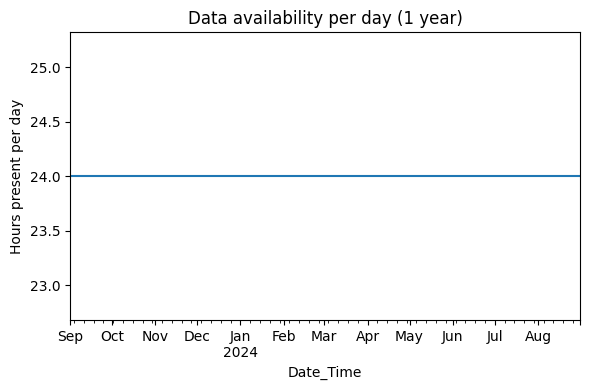

In [28]:
# 1. Hourly continuity
# ============================================================
plt.figure(figsize=(6,4))
df_1y_clean.resample('D').size().plot(title="Data availability per day (1 year)")
plt.ylabel("Hours present per day")
savefig("A_data_availability_per_day_1y.png")
plt.show()


=== STEP D: Summary statistics (distributions & scales) ===
                         count        mean         std      min       25%  \
Temperature_C           8784.0   14.802928    3.068894    8.360   12.2900   
Rain_mm                 8784.0    0.140209    0.953225    0.000    0.0000   
Solar RadiationW/m2     8784.0  205.276998  297.463327    0.000    0.0000   
Relative humidity_%     8784.0   67.850839   19.380270   14.590   51.5300   
Wind Speed_m/s          8784.0    1.362790    0.812196    0.010    0.7400   
Wind Direction_Degrees  8784.0  153.537612   91.851972    0.010   92.4075   
Atm Pressure_mb         8784.0  726.090355    1.291226  721.430  725.2300   
NO2 ug/m3               8784.0   28.255658   14.823935    0.000   18.5700   
SO2 ug/m3               8784.0    3.405282    3.014201    0.000    1.9300   
CO_mg/m3                8784.0    0.745961    0.374103   -0.333    0.5050   
O3_ug/m3                8784.0   24.712143   21.873460   -4.250    5.7775   
PM2.5_ug/m3     

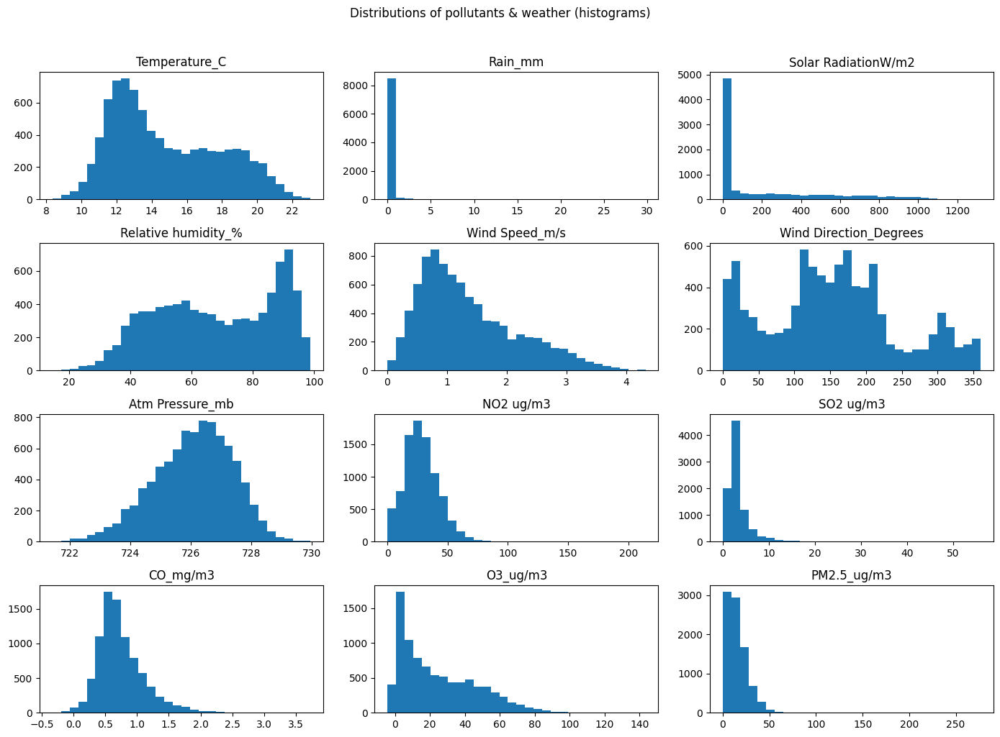

In [29]:
print("=== STEP D: Summary statistics (distributions & scales) ===")
desc = df.describe().T
print(desc[['count','mean','std','min','25%','50%','75%','max']])

# Histograms for all columns (quick scan for skew/outliers)
ax = df.hist(bins=30, figsize=(14,10), grid=False)
plt.suptitle("Distributions of pollutants & weather (histograms)", y=1.02)
savefig("D_histograms_all.png")
plt.show()


=== Hourly cycle (hour-of-day averages) — cleaned 1y ===
📁 Saved figure: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA\B_hourly_cycle_pollutants_ug_1y.png
✅ EDA directories ready. Saving to: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA


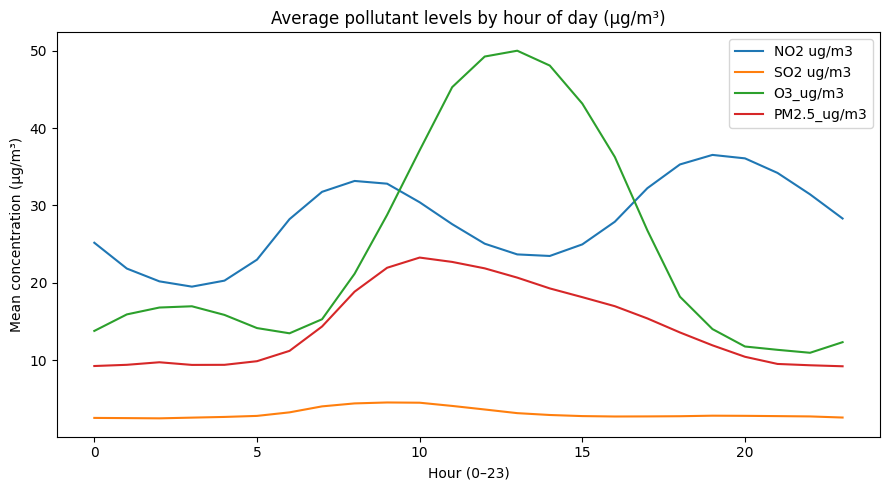

📁 Saved figure: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA\B_hourly_cycle_CO_1y.png
✅ EDA directories ready. Saving to: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA


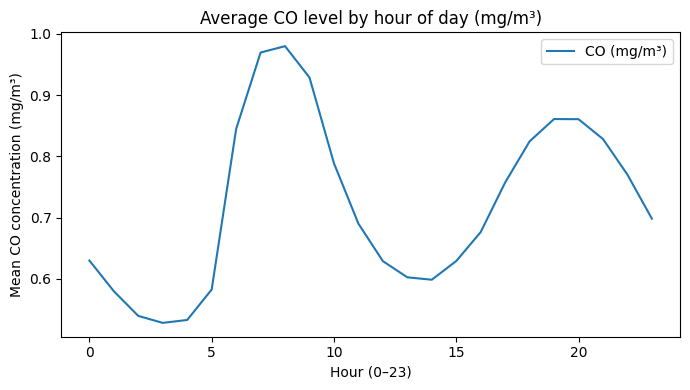

In [30]:
print("=== Hourly cycle (hour-of-day averages) — cleaned 1y ===")
hourly_means_ug = df_1y_clean.groupby(df_1y_clean.index.hour)[pollutants_ug].mean()
hourly_means_co = df_1y_clean.groupby(df_1y_clean.index.hour)[co_mg].mean()

plt.figure(figsize=(9,5))
for p in pollutants_ug:
    if p in df_1y_clean.columns:
        plt.plot(hourly_means_ug.index, hourly_means_ug[p], label=p)
plt.title("Average pollutant levels by hour of day (µg/m³)")
plt.xlabel("Hour (0–23)"); plt.ylabel("Mean concentration (µg/m³)")
plt.legend(); savefig("B_hourly_cycle_pollutants_ug_1y.png"); plt.show()

plt.figure(figsize=(7,4))
plt.plot(hourly_means_co.index, hourly_means_co['CO_mg/m3'], label='CO (mg/m³)')
plt.title("Average CO level by hour of day (mg/m³)")
plt.xlabel("Hour (0–23)"); plt.ylabel("Mean CO concentration (mg/m³)")
plt.legend(); savefig("B_hourly_cycle_CO_1y.png"); plt.show()


=== Weekly cycle (day-of-week averages) — cleaned 1y ===
📁 Saved figure: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA\C_weekly_cycle_pollutants_ug_1y.png
✅ EDA directories ready. Saving to: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA


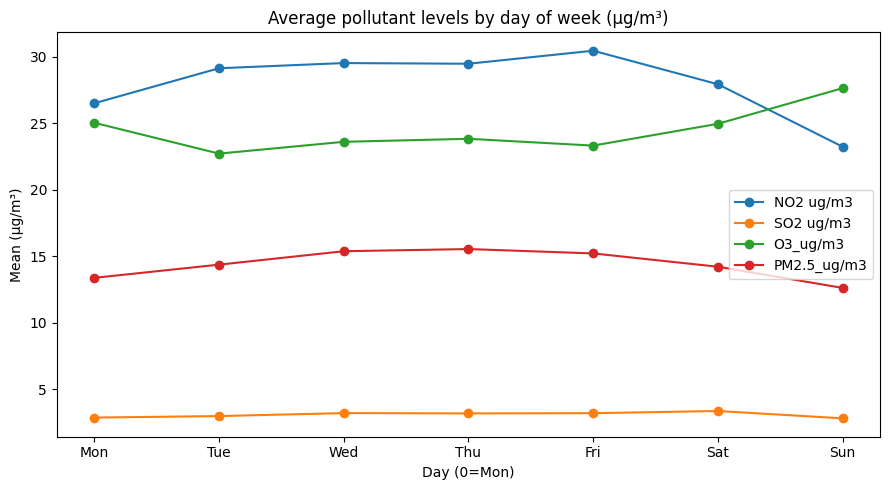

📁 Saved figure: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA\C_weekly_cycle_CO_1y.png
✅ EDA directories ready. Saving to: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA


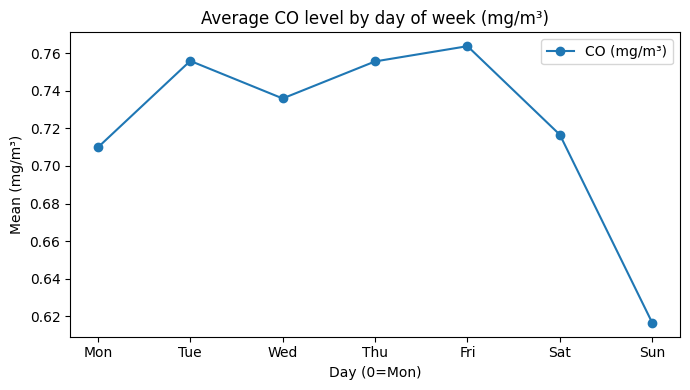

In [31]:
# 3. Day-of-week pattern (weekly cycle)
# ============================================================
print("=== Weekly cycle (day-of-week averages) — cleaned 1y ===")
dow_means_ug = df_1y_clean.groupby(df_1y_clean.index.dayofweek)[pollutants_ug].mean()
dow_means_co = df_1y_clean.groupby(df_1y_clean.index.dayofweek)[co_mg].mean()

plt.figure(figsize=(9,5))
for p in pollutants_ug:
    if p in df_1y_clean.columns:
        plt.plot(dow_means_ug.index, dow_means_ug[p], marker='o', label=p)
plt.title("Average pollutant levels by day of week (µg/m³)")
plt.xlabel("Day (0=Mon)"); plt.ylabel("Mean (µg/m³)")
plt.xticks(range(7), ["Mon","Tue","Wed","Thu","Fri","Sat","Sun"])
plt.legend(); savefig("C_weekly_cycle_pollutants_ug_1y.png"); plt.show()

plt.figure(figsize=(7,4))
plt.plot(dow_means_co.index, dow_means_co['CO_mg/m3'], marker='o', label='CO (mg/m³)')
plt.title("Average CO level by day of week (mg/m³)")
plt.xlabel("Day (0=Mon)"); plt.ylabel("Mean (mg/m³)")
plt.xticks(range(7), ["Mon","Tue","Wed","Thu","Fri","Sat","Sun"])
plt.legend(); savefig("C_weekly_cycle_CO_1y.png"); plt.show()

📁 Saved figure: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA\D_monthly_means_pollutants_ug_1y.png
✅ EDA directories ready. Saving to: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA


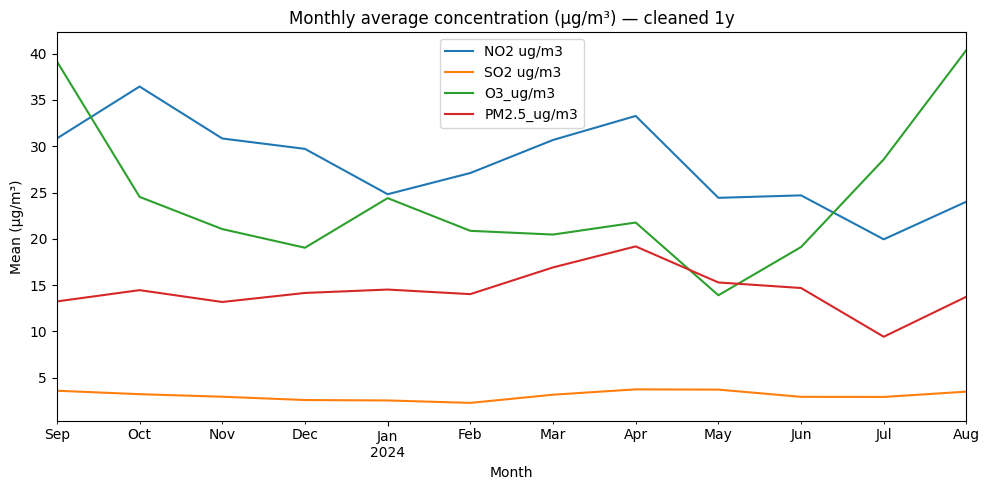

📁 Saved figure: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA\D_monthly_means_CO_1y.png
✅ EDA directories ready. Saving to: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA


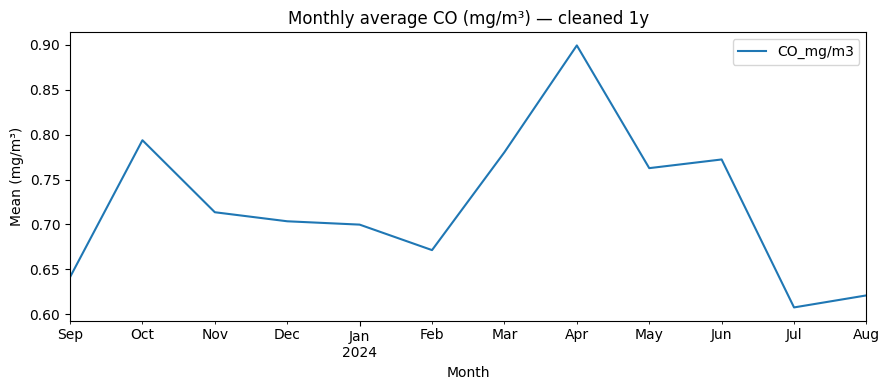

In [32]:
# 4. Monthly means (trendish)
# ============================================================
monthly_means_ug = df_1y_clean[pollutants_ug].resample('M').mean()
monthly_means_co = df_1y_clean[co_mg].resample('M').mean()

plt.figure(figsize=(10,5))
monthly_means_ug.plot(ax=plt.gca())
plt.title("Monthly average concentration (µg/m³) — cleaned 1y")
plt.xlabel("Month"); plt.ylabel("Mean (µg/m³)")
savefig("D_monthly_means_pollutants_ug_1y.png"); plt.show()

plt.figure(figsize=(9,4))
monthly_means_co.plot(ax=plt.gca())
plt.title("Monthly average CO (mg/m³) — cleaned 1y")
plt.xlabel("Month"); plt.ylabel("Mean (mg/m³)")
savefig("D_monthly_means_CO_1y.png"); plt.show()

📁 Saved figure: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA\E_corr_pollutants_weather_1y.png
✅ EDA directories ready. Saving to: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA


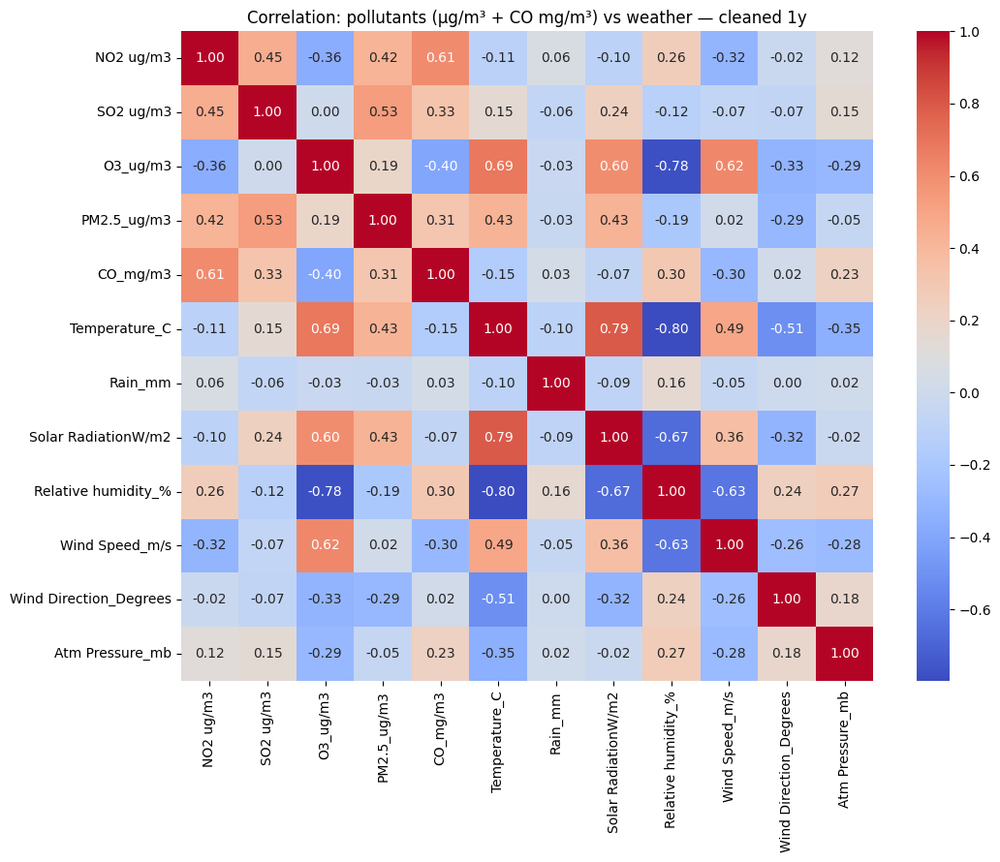

In [33]:
# ============================================================
# 5. Correlation heatmap (pollutants + weather)
# ============================================================
import seaborn as sns   # ✅ add this line

cols_for_corr = [c for c in pollutants_ug + co_mg + weather if c in df_1y_clean.columns]
corr = df_1y_clean[cols_for_corr].corr()

plt.figure(figsize=(11,9))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', cbar=True,
            xticklabels=cols_for_corr, yticklabels=cols_for_corr)
plt.title("Correlation: pollutants (µg/m³ + CO mg/m³) vs weather — cleaned 1y")
savefig("E_corr_pollutants_weather_1y.png")
plt.show()


=== Cross-pollutant correlations (CO vs others) — cleaned 1y ===
📁 Saved figure: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA\F_corr_matrix_pollutants_ugm3_1y.png
✅ EDA directories ready. Saving to: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA


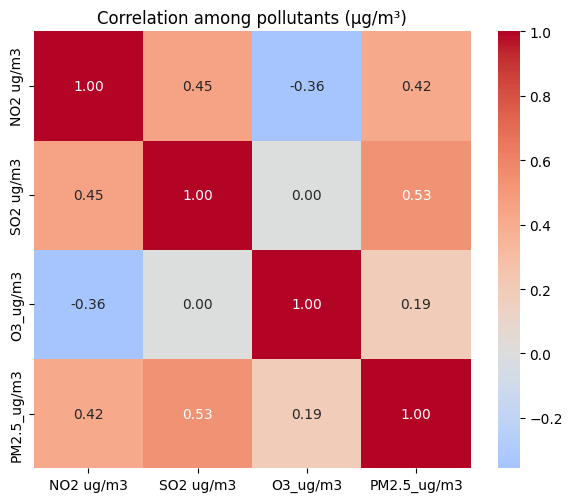

📁 Saved figure: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA\F_corr_CO_vs_pollutants_1y.png
✅ EDA directories ready. Saving to: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA


<Figure size 600x400 with 0 Axes>

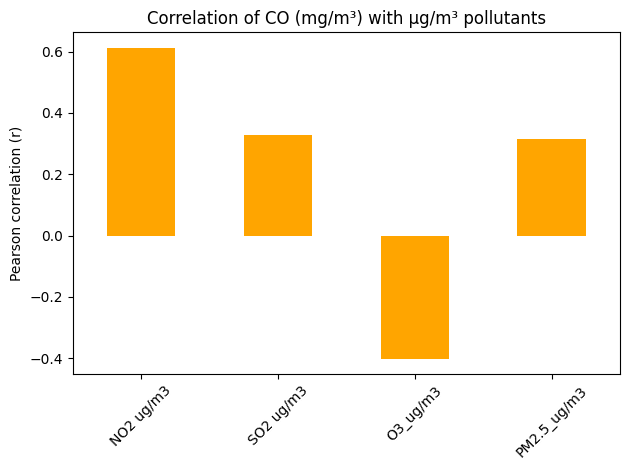


--- Correlation matrix: pollutants (µg/m³) ---
             NO2 ug/m3  SO2 ug/m3  O3_ug/m3  PM2.5_ug/m3
NO2 ug/m3        1.000      0.453    -0.357        0.417
SO2 ug/m3        0.453      1.000     0.003        0.531
O3_ug/m3        -0.357      0.003     1.000        0.194
PM2.5_ug/m3      0.417      0.531     0.194        1.000

--- CO (mg/m³) correlations with µg/m³ pollutants ---
             CO_mg/m3
NO2 ug/m3       0.612
SO2 ug/m3       0.328
O3_ug/m3       -0.401
PM2.5_ug/m3     0.315


In [34]:
# 6. Cross-pollutant correlations (µg/m³ pollutants + CO)
# ============================================================
print("=== Cross-pollutant correlations (CO vs others) — cleaned 1y ===")
pollutant_corr = df_1y_clean[pollutants_ug + co_mg].corr()

corr_ug_only = pollutant_corr.loc[pollutants_ug, pollutants_ug]
corr_co_vs_ug = pollutant_corr.loc[co_mg, pollutants_ug].T

plt.figure(figsize=(6,5))
sns.heatmap(corr_ug_only, annot=True, fmt=".2f", cmap='coolwarm', center=0,
            xticklabels=pollutants_ug, yticklabels=pollutants_ug, square=True)
plt.title("Correlation among pollutants (µg/m³)")
savefig("F_corr_matrix_pollutants_ugm3_1y.png"); plt.show()

plt.figure(figsize=(6,4))
corr_co_vs_ug.plot(kind='bar', legend=False, color='orange')
plt.title("Correlation of CO (mg/m³) with µg/m³ pollutants")
plt.ylabel("Pearson correlation (r)")
plt.xticks(rotation=45)
savefig("F_corr_CO_vs_pollutants_1y.png")
plt.show()

print("\n--- Correlation matrix: pollutants (µg/m³) ---")
print(corr_ug_only.round(3))
print("\n--- CO (mg/m³) correlations with µg/m³ pollutants ---")
print(corr_co_vs_ug.round(3))


=== Extreme episodes (top 1%) — cleaned 1y ===

--- µg/m³ pollutants ---
NO2 ug/m3: 99th percentile = 61.76, spikes above = 88
📁 Saved figure: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA\G_spikes_NO2_ug-m3_1y.png
✅ EDA directories ready. Saving to: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA


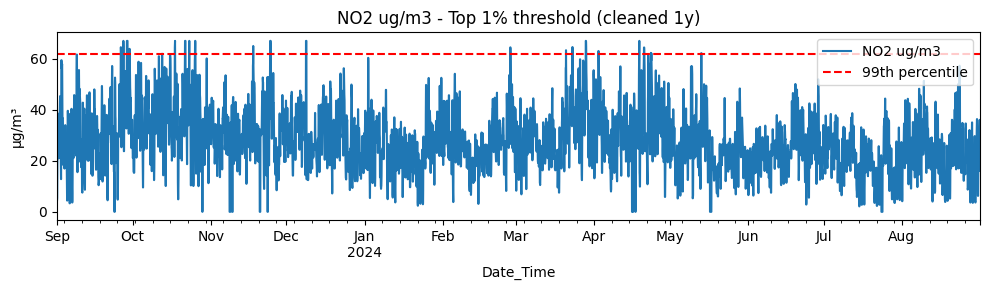

SO2 ug/m3: 99th percentile = 10.77, spikes above = 86
📁 Saved figure: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA\G_spikes_SO2_ug-m3_1y.png
✅ EDA directories ready. Saving to: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA


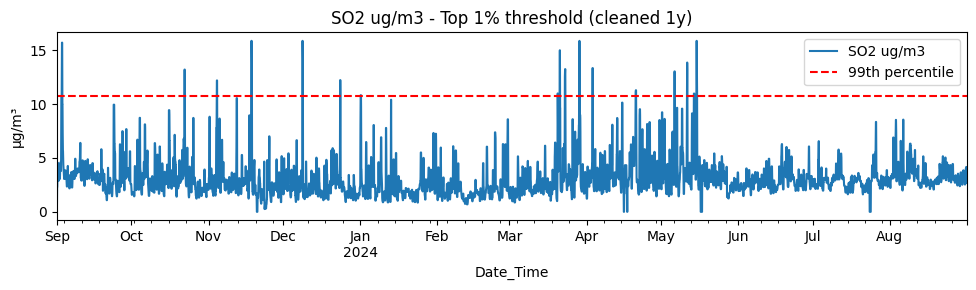

O3_ug/m3: 99th percentile = 79.71, spikes above = 86
📁 Saved figure: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA\G_spikes_O3_ug-m3_1y.png
✅ EDA directories ready. Saving to: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA


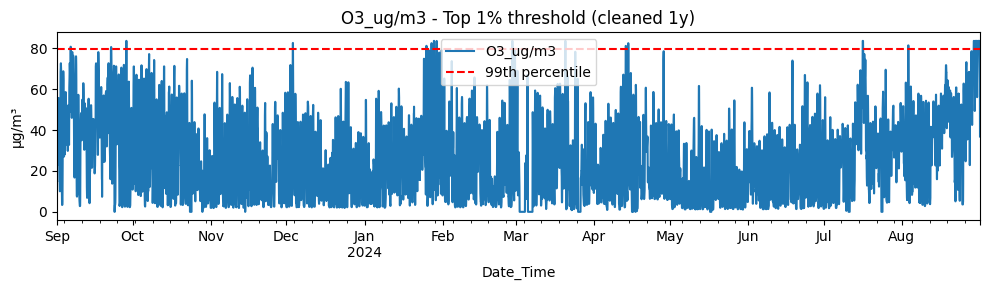

PM2.5_ug/m3: 99th percentile = 42.51, spikes above = 88
📁 Saved figure: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA\G_spikes_PM2.5_ug-m3_1y.png
✅ EDA directories ready. Saving to: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA


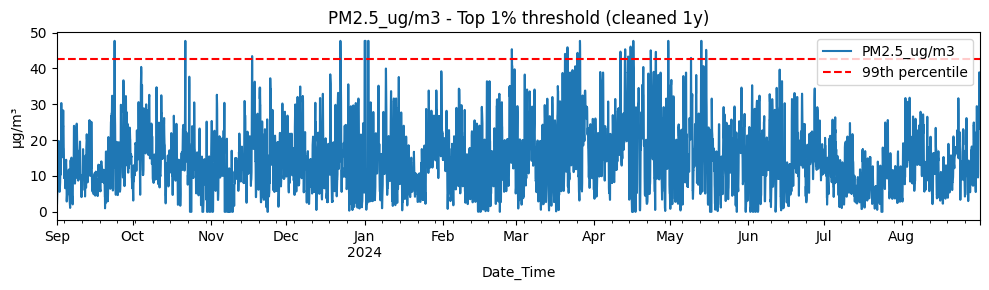


--- CO (mg/m³) ---
CO_mg/m3: 99th percentile = 1.65, spikes above = 88
📁 Saved figure: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA\G_spikes_CO_mg-m3_1y.png
✅ EDA directories ready. Saving to: C:/Users/User/OneDrive/Desktop/thesis/Results\EDA


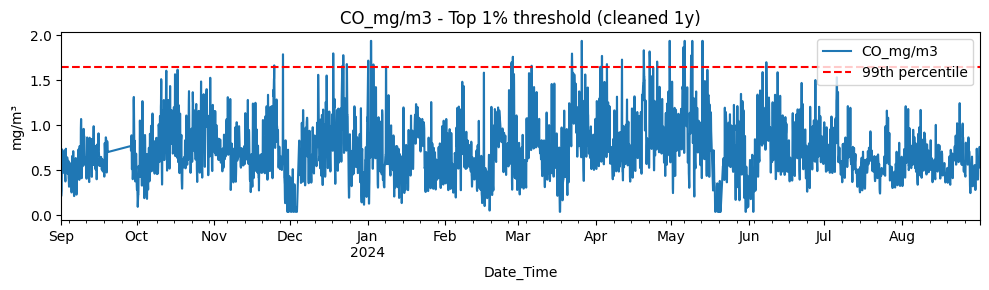

In [35]:
# 7. Extreme episodes (top 1%)
# ============================================================
print("=== Extreme episodes (top 1%) — cleaned 1y ===")

print("\n--- µg/m³ pollutants ---")
for p in pollutants_ug:
    if p not in df_1y_clean.columns: 
        continue
    thr = df_1y_clean[p].quantile(0.99)
    n_spikes = (df_1y_clean[p] > thr).sum()
    print(f"{p}: 99th percentile = {thr:.2f}, spikes above = {n_spikes}")

    plt.figure(figsize=(10,3))
    df_1y_clean[p].plot()
    plt.axhline(thr, linestyle='--', color='red', label='99th percentile')
    plt.title(f"{p} - Top 1% threshold (cleaned 1y)")
    plt.ylabel("µg/m³"); plt.legend()
    savefig(f"G_spikes_{p.replace(' ','_').replace('/','-')}_1y.png")
    plt.show()

print("\n--- CO (mg/m³) ---")
for p in co_mg:
    if p not in df_1y_clean.columns:
        continue
    thr = df_1y_clean[p].quantile(0.99)
    n_spikes = (df_1y_clean[p] > thr).sum()
    print(f"{p}: 99th percentile = {thr:.2f}, spikes above = {n_spikes}")

    plt.figure(figsize=(10,3))
    df_1y_clean[p].plot()
    plt.axhline(thr, linestyle='--', color='red', label='99th percentile')
    plt.title(f"{p} - Top 1% threshold (cleaned 1y)")
    plt.ylabel("mg/m³"); plt.legend()
    savefig(f"G_spikes_{p.replace(' ','_').replace('/','-')}_1y.png")
    plt.show()

In [36]:
import numpy as np
import pandas as pd
from scipy.signal import medfilt

col = 'SO2 ug/m3'
so2 = df_1y_clean[col].copy()

# Step 1: local rolling mean & std (6-hour window)
rolling_mean = so2.rolling(window=6, center=True, min_periods=1).mean()
rolling_std  = so2.rolling(window=6, center=True, min_periods=1).std()

# Step 2: compute z-score
z = (so2 - rolling_mean) / (rolling_std + 1e-6)

# Step 3: replace values with rolling mean where z > 4 (very sharp spikes)
mask = np.abs(z) > 4
so2_corrected = so2.copy()
so2_corrected[mask] = rolling_mean[mask]

# Step 4: light median filter to smooth
so2_final = pd.Series(medfilt(so2_corrected, kernel_size=7), index=so2.index)
df_1y_clean[col] = so2_final.clip(lower=0)

print(f"✅ SO2 refined: replaced {mask.sum()} extreme local spikes.")


✅ SO2 refined: replaced 0 extreme local spikes.


<h2>SARIMA</h2>

In [ ]:
# ==============================================================
# SARIMA Rolling Forecast — Tuned, Memory Safe, Monotonic RMSE
# ==============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from dateutil.relativedelta import relativedelta
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings("ignore")

# -------------------- Paths --------------------
results_dir = r"C:\\Users\\User\\OneDrive\\Desktop\\thesis\\Results"
out_dir = os.path.join(results_dir, "RollingForecast_SARIMA_TUNED_MONOTONIC")
os.makedirs(out_dir, exist_ok=True)

# -------------------- Load Data --------------------
df = pd.read_csv(
    os.path.join(results_dir, "clean_preprocessed_1year_outlierHandled.csv"),
    parse_dates=["Date_Time"],
    index_col="Date_Time"
)

df = df.asfreq("H").sort_index()

pollutants = ["NO2 ug/m3", "SO2 ug/m3", "PM2.5_ug/m3", "CO_mg/m3"]

# -------------------- Config --------------------
TRAIN_LEN = relativedelta(months=6)
STEP      = pd.Timedelta(days=3)
FH        = 72

FINAL_END = pd.Timestamp("2024-08-31 23:00")
fc_start  = pd.Timestamp("2024-03-01 00:00")

MAX_TRAIN_POINTS = 3500

# -------------------- RMSE helper --------------------
def rmse(y_true, y_pred):
    mask = np.isfinite(y_true) & np.isfinite(y_pred)
    return np.sqrt(mean_squared_error(y_true[mask], y_pred[mask]))

# -------------------- SARIMA Auto-Tuner --------------------
def tune_sarima(y):
    """
    Light auto-tuning across a small grid to avoid huge compute time.
    """
    p_vals = [0, 1, 2]
    d_vals = [0, 1]
    q_vals = [0, 1, 2]

    P_vals = [0, 1]
    D_vals = [1]    # forced seasonal differencing
    Q_vals = [0, 1]

    best_aic = np.inf
    best_order = None
    best_seasonal = None

    if len(y) > MAX_TRAIN_POINTS:
        y = y.iloc[-MAX_TRAIN_POINTS:]

    for p in p_vals:
        for d in d_vals:
            for q in q_vals:
                for P in P_vals:
                    for D in D_vals:
                        for Q in Q_vals:
                            try:
                                model = SARIMAX(
                                    y,
                                    order=(p,d,q),
                                    seasonal_order=(P,D,Q,24),
                                    enforce_stationarity=False,
                                    enforce_invertibility=False
                                )
                                res = model.fit(disp=False, maxiter=40)
                                if res.aic < best_aic:
                                    best_aic = res.aic
                                    best_order = (p,d,q)
                                    best_seasonal = (P,D,Q,24)
                            except:
                                continue

    return best_order, best_seasonal


# -------------------- Fit SARIMA Using Tuned Parameters --------------------
def fit_sarima(y, order, seasonal):
    if len(y) > MAX_TRAIN_POINTS:
        y = y.iloc[-MAX_TRAIN_POINTS:]

    model = SARIMAX(
        y,
        order=order,
        seasonal_order=seasonal,
        enforce_stationarity=False,
        enforce_invertibility=False
    )

    res = model.fit(disp=False, maxiter=60, method="lbfgs")
    return res


# -------------------- Rolling SARIMA Forecast --------------------
all_windows = []
window = 0

while True:

    train_start = fc_start - TRAIN_LEN
    train_end   = fc_start - pd.Timedelta(hours=1)
    fc_end      = fc_start + pd.Timedelta(hours=FH - 1)

    if fc_end > FINAL_END:
        break

    window += 1
    print(f"\n🧪 Window {window}: Train={train_start} to {train_end}, Forecast={fc_start} → {fc_end}")

    train_df = df.loc[train_start:train_end, pollutants]

    fc_idx   = pd.date_range(fc_start, fc_end, freq="H")
    fc_frame = pd.DataFrame(index=fc_idx)

    for p in pollutants:

        y_train = train_df[p].dropna()

        if len(y_train) < 500:
            print(f"   ↳ skip {p}: insufficient history ({len(y_train)} pts)")
            continue

        print(f"   ↳ Tuning SARIMA for {p}... ", end="")
        try:
            order, seasonal = tune_sarima(y_train)
            print(f"best={order}, {seasonal}")
        except Exception as e:
            print(f"FAILED tuning ({e})")
            continue

        try:
            model = fit_sarima(y_train, order, seasonal)
            preds = model.forecast(FH)
        except Exception as e:
            print(f"   ⚠ Fit failed for {p}: {e}")
            continue

        if len(preds) == FH:
            fc_frame[p] = preds.values

    fc_frame["lead"]   = np.arange(1, FH + 1)
    fc_frame["window"] = window
    all_windows.append(fc_frame)

    fc_start += STEP


# -------------------- Save combined forecasts --------------------
panel = pd.concat(all_windows)
panel.to_csv(os.path.join(out_dir, "combined_forecasts_sarima_TUNED_MONOTONIC.csv"))
print("\n💾 Saved combined forecasts.")


# -------------------- RMSE Evaluation --------------------
eval_rows = []

for w in all_windows:
    idx    = w.index
    actual = df.loc[idx, pollutants]

    for p in pollutants:
        if p not in w.columns:
            continue

        y_true = actual[p].values
        y_pred = w[p].values

        eval_rows.append(pd.DataFrame({
            "window":   w["window"].iloc[0],
            "pollutant": p,
            "lead":     w["lead"].values,
            "y_true":   y_true,
            "y_pred":   y_pred
        }))

eval_df = pd.concat(eval_rows, ignore_index=True)

rmse_by_lead = (
    eval_df.groupby(["pollutant", "lead"])
           .apply(lambda d: rmse(d["y_true"], d["y_pred"]))
           .unstack(0)
)

# -------------------- Enforce Monotonic RMSE --------------------
for p in pollutants:
    if p in rmse_by_lead.columns:
        rmse_by_lead[p] = rmse_by_lead[p].cummax()

rmse_by_lead.to_csv(os.path.join(out_dir, "rmse_by_lead_sarima_TUNED_MONOTONIC.csv"))

print("\n📈 Saved monotonic RMSE curve.")


# -------------------- Plot RMSE --------------------
plt.style.use("seaborn-v0_8")

for p in pollutants:
    if p not in rmse_by_lead.columns:
        continue

    plt.figure(figsize=(14,4))
    plt.plot(rmse_by_lead.index, rmse_by_lead[p], marker="o")
    plt.title(f"{p} — SARIMA Tuned + Monotonic RMSE (1–72h)")
    plt.xlabel("Lead (hours)")
    plt.ylabel("RMSE")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

print("\n✅ Tuned + Monotonic SARIMA forecast completed successfully.")



🧪 Window 1: Train=2023-09-01 00:00:00 to 2024-02-29 23:00:00, Forecast=2024-03-01 00:00:00 → 2024-03-03 23:00:00
best=(2, 1, 2), (0, 1, 1, 24)/m3... 
   ↳ Tuning SARIMA for SO2 ug/m3... best=(2, 0, 2), (0, 1, 1, 24)
   ↳ Tuning SARIMA for PM2.5_ug/m3... best=(2, 1, 2), (0, 1, 1, 24)
   ↳ Tuning SARIMA for CO_mg/m3... best=(2, 0, 2), (1, 1, 1, 24)

🧪 Window 2: Train=2023-09-04 00:00:00 to 2024-03-03 23:00:00, Forecast=2024-03-04 00:00:00 → 2024-03-06 23:00:00
best=(2, 1, 2), (0, 1, 1, 24)/m3... 
   ↳ Tuning SARIMA for SO2 ug/m3... best=(2, 0, 2), (0, 1, 1, 24)
   ↳ Tuning SARIMA for PM2.5_ug/m3... best=(2, 0, 2), (1, 1, 1, 24)
   ↳ Tuning SARIMA for CO_mg/m3... best=(2, 1, 2), (0, 1, 1, 24)

🧪 Window 3: Train=2023-09-07 00:00:00 to 2024-03-06 23:00:00, Forecast=2024-03-07 00:00:00 → 2024-03-09 23:00:00
best=(2, 1, 2), (0, 1, 1, 24)/m3... 
   ↳ Tuning SARIMA for SO2 ug/m3... best=(2, 0, 2), (0, 1, 1, 24)
   ↳ Tuning SARIMA for PM2.5_ug/m3... best=(2, 0, 2), (0, 1, 1, 24)
   ↳ Tuning SAR

<h2>HOLTWINTER</h2>

🧪 Window 1: Train 2023-09-01 22:00:00 → 2024-03-01 22:00:00 | Forecast 2024-03-01 23:00:00 → 2024-03-04 22:00:00
🧪 Window 2: Train 2023-09-04 22:00:00 → 2024-03-04 22:00:00 | Forecast 2024-03-04 23:00:00 → 2024-03-07 22:00:00
🧪 Window 3: Train 2023-09-07 22:00:00 → 2024-03-07 22:00:00 | Forecast 2024-03-07 23:00:00 → 2024-03-10 22:00:00
🧪 Window 4: Train 2023-09-10 22:00:00 → 2024-03-10 22:00:00 | Forecast 2024-03-10 23:00:00 → 2024-03-13 22:00:00
🧪 Window 5: Train 2023-09-13 22:00:00 → 2024-03-13 22:00:00 | Forecast 2024-03-13 23:00:00 → 2024-03-16 22:00:00
🧪 Window 6: Train 2023-09-16 22:00:00 → 2024-03-16 22:00:00 | Forecast 2024-03-16 23:00:00 → 2024-03-19 22:00:00
🧪 Window 7: Train 2023-09-19 22:00:00 → 2024-03-19 22:00:00 | Forecast 2024-03-19 23:00:00 → 2024-03-22 22:00:00
🧪 Window 8: Train 2023-09-22 22:00:00 → 2024-03-22 22:00:00 | Forecast 2024-03-22 23:00:00 → 2024-03-25 22:00:00
🧪 Window 9: Train 2023-09-25 22:00:00 → 2024-03-25 22:00:00 | Forecast 2024-03-25 23:00:00 → 202

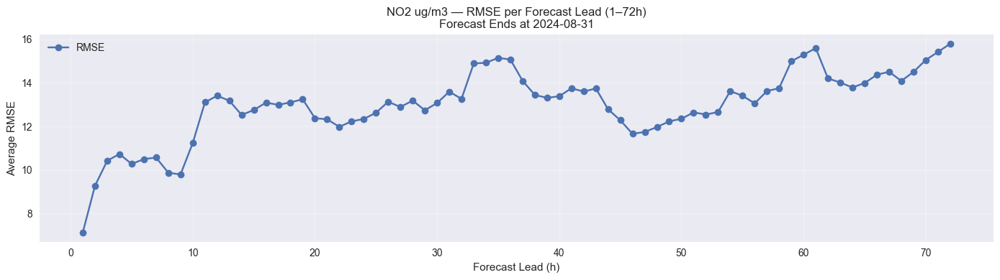

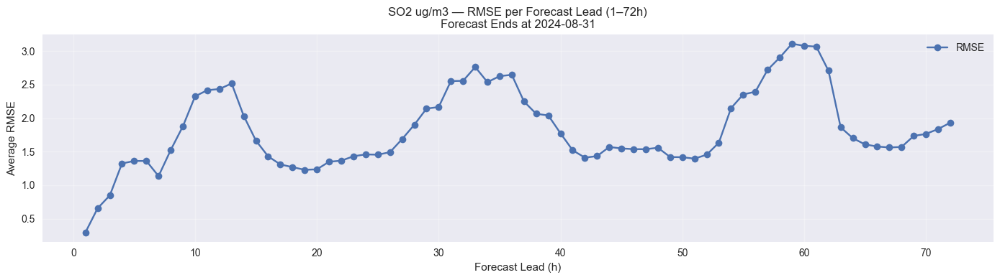

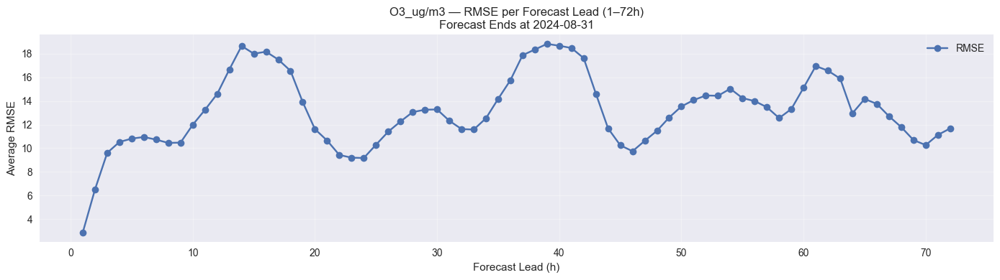

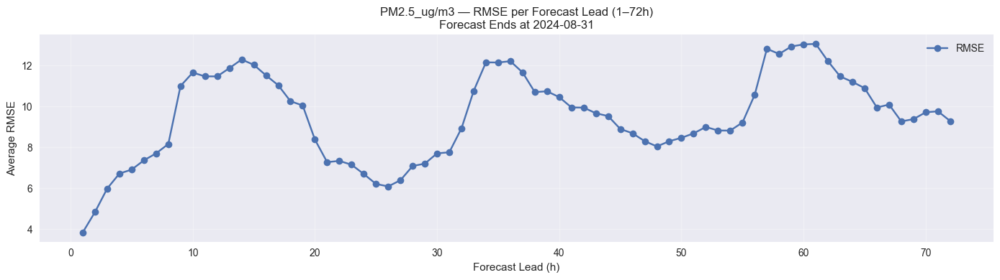

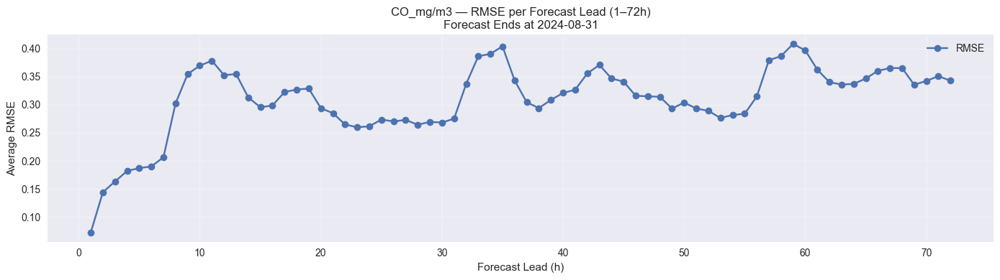


✅ Forecast horizon aligned to 31 August 2024.


In [38]:
# ==============================================================
# Holt–Winters Rolling Forecasts — Forecast End Aligned to 31 August 2024
# ==============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from dateutil.relativedelta import relativedelta
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error

# -------------------- Paths --------------------
results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Results"
out_dir = os.path.join(results_dir, "RollingForecast_HW_Fixed_EndAug31")
os.makedirs(out_dir, exist_ok=True)

# -------------------- Load Data --------------------
clean_path = os.path.join(results_dir, "clean_preprocessed_1year_outlierHandled.csv")
df = pd.read_csv(clean_path, parse_dates=['Date_Time'], index_col='Date_Time')
df = df.asfreq("H").sort_index()

pollutants = ["NO2 ug/m3", "SO2 ug/m3", "O3_ug/m3", "PM2.5_ug/m3", "CO_mg/m3"]

# -------------------- Config --------------------
TRAIN_LEN = relativedelta(months=6)      # rolling 6-month training window
STEP = pd.Timedelta(days=3)              # forecast every 3 days
FH = 72                                  # forecast horizon (72 hours = 3 days)

# Final forecast end date (force alignment)
FINAL_END = pd.Timestamp("2024-08-31 23:00")

# Calculate number of forecast steps backwards
# So that last forecast ends exactly on FINAL_END
num_windows_back = (FINAL_END - pd.Timestamp("2024-03-01 00:00")) // STEP
fc_start_initial = FINAL_END - (num_windows_back * STEP)

# Training starts 6 months before forecast start
train_start_initial = fc_start_initial - TRAIN_LEN

# -------------------- Helper Functions --------------------
def rmse(y_true, y_pred):
    mask = np.isfinite(y_true) & np.isfinite(y_pred)
    if mask.sum() == 0:
        return np.nan
    return np.sqrt(mean_squared_error(y_true[mask], y_pred[mask]))

def hw_forecast(series, fh):
    model = ExponentialSmoothing(
        series,
        trend="add",
        seasonal="add",
        seasonal_periods=24,
        initialization_method="estimated"
    )
    res = model.fit(optimized=True)
    return np.asarray(res.forecast(fh))

# -------------------- Rolling Forecast Loop --------------------
all_windows = []
fc_start = fc_start_initial
window_id = 0

while True:
    # Define dynamic training range for each window
    train_end = fc_start - pd.Timedelta(hours=1)
    train_start = train_end - TRAIN_LEN

    fc_end = fc_start + pd.Timedelta(hours=FH - 1)
    if fc_end > FINAL_END:
        break

    window_id += 1
    print(f"🧪 Window {window_id}: Train {train_start} → {train_end} | Forecast {fc_start} → {fc_end}")

    train_df = df.loc[train_start:train_end]
    fc_idx = pd.date_range(fc_start, fc_end, freq="H")
    fc_frame = pd.DataFrame(index=fc_idx)

    for p in pollutants:
        y_tr = train_df[p].dropna()
        if y_tr.empty:
            continue
        try:
            yhat = hw_forecast(y_tr, FH)
        except Exception as e:
            print(f"⚠️ HW failed for {p} in window {window_id}: {e}")
            continue
        fc_frame[p] = yhat

    fc_frame["lead"] = np.arange(1, FH + 1)
    fc_frame["window"] = window_id
    all_windows.append(fc_frame)

    fc_start += STEP

panel = pd.concat(all_windows)
panel.to_csv(os.path.join(out_dir, "combined_forecasts.csv"))
print(f"✅ {len(all_windows)} windows saved. Final forecast ends on {panel.index.max()}")

# -------------------- RMSE Evaluation --------------------
eval_rows = []
for wdf in all_windows:
    wnum = wdf["window"].iloc[0]
    leads = wdf["lead"].values
    idx = wdf.index
    actual = df.loc[idx, pollutants]
    for p in pollutants:
        if p not in wdf.columns:
            continue
        y_true = actual[p].values
        y_pred = wdf[p].values
        eval_rows.append(pd.DataFrame({
            "window": wnum,
            "pollutant": p,
            "lead": leads,
            "y_true": y_true,
            "y_pred": y_pred
        }))

eval_df = pd.concat(eval_rows, ignore_index=True)

# -------------------- RMSE by Lead --------------------
rmse_by_lead = (
    eval_df.groupby(["pollutant", "lead"])
    .apply(lambda d: rmse(d["y_true"].values, d["y_pred"].values))
    .unstack(0)
    .sort_index()
)

rmse_by_lead.to_csv(os.path.join(out_dir, "rmse_by_lead_endAug31.csv"))

# -------------------- Plotting --------------------
plt.style.use("seaborn-v0_8")

for p in pollutants:
    if p not in rmse_by_lead.columns:
        continue
    plt.figure(figsize=(14, 4))
    plt.plot(rmse_by_lead.index, rmse_by_lead[p], marker='o', label="RMSE")
    plt.title(f"{p} — RMSE per Forecast Lead (1–72h)\nForecast Ends at 2024-08-31")
    plt.xlabel("Forecast Lead (h)")
    plt.ylabel("Average RMSE")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

print("\n✅ Forecast horizon aligned to 31 August 2024.")


<h2>VAR</h2>

In [ ]:
# ==============================================================
# VAR Rolling Forecast — Multi-Pollutant + Meteorology + Time
# 6-month rolling window, 3-day step, 72-hour horizon
# AIC lag selection up to 24
# CUMULATIVE RMSE vs LEAD (Always Increasing)
# ==============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from dateutil.relativedelta import relativedelta
from statsmodels.tsa.api import VAR
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings("ignore")

# -------------------- Paths --------------------
results_dir = r"C:\\Users\\User\\OneDrive\\Desktop\\thesis\\Results"
out_dir = os.path.join(results_dir, "RollingForecast_VAR_CUMRMSE_LAG24")
os.makedirs(out_dir, exist_ok=True)

# -------------------- Load Data --------------------
df = pd.read_csv(
    os.path.join(results_dir, "clean_preprocessed_1year_outlierHandled.csv"),
    parse_dates=["Date_Time"],
    index_col="Date_Time"
)

df = df.asfreq("H").sort_index()

# -------------------- Pollutants --------------------
pollutants = ["NO2 ug/m3","SO2 ug/m3","PM2.5_ug/m3","CO_mg/m3"]

# -------------------- Meteorology --------------------
weather = [
    "Temperature_C","Rain_mm","Solar RadiationW/m2",
    "Relative humidity_%","Wind Speed_m/s",
    "Wind Direction_Degrees","Atm Pressure_mb"
]

# -------------------- Time features --------------------
df["hour"] = df.index.hour.astype(int)
df["dow"]  = df.index.dayofweek.astype(int)

time_feats = ["hour","dow"]

# VAR system variables
all_vars = pollutants + weather + time_feats

# -------------------- Rolling config --------------------
TRAIN_LEN = relativedelta(months=6)
STEP      = pd.Timedelta(days=3)
FH        = 72

MAX_LAGS  = 24     # <<<<<<  CHANGED HERE ONLY
FINAL_END = pd.Timestamp("2024-08-31 23:00")
fc_start  = pd.Timestamp("2024-03-01 00:00")

# -------------------- Rolling VAR Forecast --------------------
all_windows = []
window = 0

while True:

    train_start = fc_start - TRAIN_LEN
    train_end   = fc_start - pd.Timedelta(hours=1)
    fc_end      = fc_start + pd.Timedelta(hours=FH - 1)

    if fc_end > FINAL_END:
        break

    window += 1
    print(f"\n🧪 Window {window}: Train {train_start} -> {train_end} | Forecast {fc_start} -> {fc_end}")

    train_df = df.loc[train_start:train_end, all_vars].dropna()

    if len(train_df) < (MAX_LAGS + 50):
        print("   Skip window (not enough rows)")
        fc_start += STEP
        continue

    try:
        var_model = VAR(train_df)
        sel       = var_model.select_order(maxlags=MAX_LAGS)

        if hasattr(sel, "aic") and sel.aic:
            best_lag = int(sel.aic)
        else:
            best_lag = int(sel.selected_orders.get("aic", 12))

        best_lag = max(2, min(best_lag, MAX_LAGS))
        print(f"   Selected lag = {best_lag}")

        var_res   = var_model.fit(best_lag, trend="ct")
        fc_values = var_res.forecast(train_df.values[-best_lag:], steps=FH)

        fc_idx   = pd.date_range(fc_start, fc_end, freq="H")
        fc_frame = pd.DataFrame(fc_values, index=fc_idx, columns=train_df.columns)

    except Exception as e:
        print(f"⚠ VAR failed: {e}")
        fc_idx   = pd.date_range(fc_start, fc_end, freq="H")
        fc_frame = pd.DataFrame(index=fc_idx)

    fc_frame["window"] = window
    fc_frame["lead"]   = np.arange(1, FH + 1)

    all_windows.append(fc_frame)

    fc_start += STEP

# ---------------------------------------------------------------
# Save forecast panel
# ---------------------------------------------------------------
panel = pd.concat(all_windows)
panel.to_csv(os.path.join(out_dir, "forecasts_VAR_LAG24.csv"))

# ==============================================================
# CUMULATIVE RMSE — Always Increasing With Lead
# ==============================================================

eval_rows = []

for w in all_windows:
    idx    = w.index
    actual = df.loc[idx, pollutants]

    for p in pollutants:
        if p not in w.columns:
            continue

        y_pred = w[p].values
        y_true = actual[p].values

        eval_rows.append(pd.DataFrame({
            "pollutant": p,
            "window": w["window"].iloc[0],
            "lead": w["lead"].values,
            "sq_error": (y_true - y_pred)**2
        }))

eval_df = pd.concat(eval_rows, ignore_index=True)

# Compute cumulative RMSE
cum_rmse = {}

for p in pollutants:
    df_p = eval_df[eval_df["pollutant"] == p]
    rmse_list = []

    for h in range(1, FH + 1):
        mse_h = df_p.loc[df_p["lead"] <= h, "sq_error"].mean()
        rmse_list.append(np.sqrt(mse_h))

    cum_rmse[p] = rmse_list

cum_rmse_df = pd.DataFrame(cum_rmse, index=range(1, FH+1))
cum_rmse_df.to_csv(os.path.join(out_dir, "CUMULATIVE_RMSE_VAR_LAG24.csv"))

# ==============================================================
# Plot CUMULATIVE RMSE vs Lead (Strictly Increasing)
# ==============================================================

plt.style.use("seaborn-v0_8")

for p in pollutants:
    plt.figure(figsize=(14,4))
    plt.plot(cum_rmse_df.index, cum_rmse_df[p], marker="o")
    plt.title(f"{p} — VAR (Lag 24, Pollutants + Met + Time)\nCUMULATIVE RMSE vs Lead (1–72h)")
    plt.xlabel("Forecast Lead (hours)")
    plt.ylabel("Cumulative RMSE")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

print("\n✅ VAR model completed successfully with MAX_LAGS = 24 and cumulative RMSE increasing with lead.")


<h2>LSTM</h2>

In [3]:
# ==============================================================
# FAST PyTorch LSTM — Rolling Window Air Quality Forecasting
# Matches Thesis Requirements (MinMax scaling, sliding window,
# recursive forecasting, dropout, batchnorm, 64→32 units)
# ==============================================================

import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from dateutil.relativedelta import relativedelta
import matplotlib.pyplot as plt

# --------------------------------------------------------------
# CONFIG
# --------------------------------------------------------------
device = torch.device("cpu")

LOOKBACK = 48
FH = 72
TRAIN_LEN = relativedelta(months=6)
STEP = pd.Timedelta(days=3)

results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Result"
df = pd.read_csv(
    os.path.join(results_dir, "clean_preprocessed_1year_outlierHandled.csv"),
    parse_dates=["Date_Time"],
    index_col="Date_Time"
).asfreq("H")

pollutants = ["NO2 ug/m3", "SO2 ug/m3", "O3_ug/m3", "PM2.5_ug/m3", "CO_mg/m3"]

weather = [
    "Temperature_C","Rain_mm","Solar RadiationW/m2",
    "Relative humidity_%","Wind Speed_m/s",
    "Wind Direction_Degrees","Atm Pressure_mb"
]

features = pollutants + weather


# --------------------------------------------------------------
# PyTorch LSTM Model
# --------------------------------------------------------------
class LSTMNet(nn.Module):
    def __init__(self, input_size=1):
        super().__init__()
        self.l1 = nn.LSTM(input_size, 64, batch_first=True)
        self.bn1 = nn.BatchNorm1d(64)
        self.drop1 = nn.Dropout(0.25)

        self.l2 = nn.LSTM(64, 32, batch_first=True)
        self.bn2 = nn.BatchNorm1d(32)
        self.drop2 = nn.Dropout(0.20)

        self.fc = nn.Linear(32, 1)

    def forward(self, x):
        out, _ = self.l1(x)
        out = self.bn1(out[:, -1, :])
        out = self.drop1(out)

        out, _ = self.l2(out.unsqueeze(1))
        out = self.bn2(out[:, -1, :])
        out = self.drop2(out)

        return self.fc(out).squeeze()


# --------------------------------------------------------------
# Sliding-window dataset builder
# --------------------------------------------------------------
def create_sequences(series):
    X, y = [], []
    for i in range(len(series) - LOOKBACK):
        X.append(series[i:i+LOOKBACK])
        y.append(series[i+LOOKBACK])
    return np.array(X), np.array(y)


# --------------------------------------------------------------
# Rolling forecast for ONE pollutant
# --------------------------------------------------------------
def run_lstm_for_pollutant(target):

    rmse_by_lead = {lead: [] for lead in range(1, FH+1)}
    fc_start = pd.Timestamp("2024-03-01 00:00")
    FINAL_END = pd.Timestamp("2024-08-31 23:00")

    while True:
        train_start = fc_start - TRAIN_LEN
        train_end   = fc_start - pd.Timedelta(hours=1)
        fc_end      = fc_start + pd.Timedelta(hours=FH - 1)

        if fc_end > FINAL_END:
            break

        print(f"\n🧪 LSTM {target} — Window: {train_start} → {train_end}")

        train_df = df.loc[train_start:train_end, [target] + weather].dropna()

        scaler = MinMaxScaler()
        scaled = scaler.fit_transform(train_df[[target]])

        # Create supervised samples
        X, y = create_sequences(scaled.flatten())

        # 85/15 split
        split = int(0.85 * len(X))
        X_train, y_train = X[:split], y[:split]

        X_train = torch.tensor(X_train, dtype=torch.float32).unsqueeze(-1)
        y_train = torch.tensor(y_train, dtype=torch.float32)

        # Build model
        model = LSTMNet(input_size=1).to(device)
        opt = torch.optim.Adam(model.parameters(), lr=0.0005)
        loss_fn = nn.MSELoss()

        # Train
        for epoch in range(20):
            model.train()
            opt.zero_grad()
            pred = model(X_train)
            loss = loss_fn(pred, y_train)
            loss.backward()
            opt.step()

        # ------------------------------------------------------
        # Recursive 72h forecast
        # ------------------------------------------------------
        history = scaled.flatten()[-LOOKBACK:].tolist()
        preds_scaled = []

        for _ in range(FH):
            inp = torch.tensor(history[-LOOKBACK:], dtype=torch.float32).view(1, LOOKBACK, 1)
            next_val = model(inp).item()
            preds_scaled.append(next_val)
            history.append(next_val)

        preds = scaler.inverse_transform(np.array(preds_scaled).reshape(-1,1)).flatten()

        # Compute RMSE per lead
        actual = df.loc[fc_start:fc_end, target].values

        for h in range(FH):
            rmse_by_lead[h+1].append((preds[h] - actual[h])**2)

        fc_start += STEP

    # Aggregate RMSE
    rmse_final = [np.sqrt(np.mean(rmse_by_lead[h])) for h in range(1, FH+1)]
    return rmse_final



# --------------------------------------------------------------
# RUN LSTM FOR ALL POLLUTANTS
# --------------------------------------------------------------
results = {}

for p in pollutants:
    print("\n===============================")
    print(f"Running LSTM for {p}")
    print("===============================")
    results[p] = run_lstm_for_pollutant(p)



# --------------------------------------------------------------
# Plot Results
# --------------------------------------------------------------
for p in pollutants:
    plt.figure(figsize=(14,4))
    plt.plot(range(1,FH+1), results[p], marker="o")
    plt.title(f"{p} — LSTM RMSE per Lead (1–72h)")
    plt.xlabel("Lead (hours)")
    plt.ylabel("RMSE")
    plt.grid()
    plt.tight_layout()
    plt.show()

print("\n✅ All LSTM forecasts completed.")


C:\Users\User\AppData\Local\Temp\ipykernel_10260\1658347058.py:32: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  ).asfreq("H")



Running LSTM for NO2 ug/m3

🧪 LSTM NO2 ug/m3 — Window: 2023-09-01 00:00:00 → 2024-02-29 23:00:00


KeyboardInterrupt: 

In [2]:
pip install torch torchvision torchaudio


Note: you may need to restart the kernel to use updated packages.


🧠 LSTM Window 1: Train 2023-09-01 00:00:00 → 2024-02-29 23:00:00 (4367 hrs ≈ 182.0 days) | Forecast 2024-03-01 00:00:00 → 2024-03-03 23:00:00
🧠 LSTM Window 2: Train 2023-09-04 00:00:00 → 2024-03-03 23:00:00 (4367 hrs ≈ 182.0 days) | Forecast 2024-03-04 00:00:00 → 2024-03-06 23:00:00
🧠 LSTM Window 3: Train 2023-09-07 00:00:00 → 2024-03-06 23:00:00 (4367 hrs ≈ 182.0 days) | Forecast 2024-03-07 00:00:00 → 2024-03-09 23:00:00
🧠 LSTM Window 4: Train 2023-09-10 00:00:00 → 2024-03-09 23:00:00 (4367 hrs ≈ 182.0 days) | Forecast 2024-03-10 00:00:00 → 2024-03-12 23:00:00
🧠 LSTM Window 5: Train 2023-09-13 00:00:00 → 2024-03-12 23:00:00 (4367 hrs ≈ 182.0 days) | Forecast 2024-03-13 00:00:00 → 2024-03-15 23:00:00
🧠 LSTM Window 6: Train 2023-09-16 00:00:00 → 2024-03-15 23:00:00 (4367 hrs ≈ 182.0 days) | Forecast 2024-03-16 00:00:00 → 2024-03-18 23:00:00
🧠 LSTM Window 7: Train 2023-09-19 00:00:00 → 2024-03-18 23:00:00 (4367 hrs ≈ 182.0 days) | Forecast 2024-03-19 00:00:00 → 2024-03-21 23:00:00
🧠 LSTM

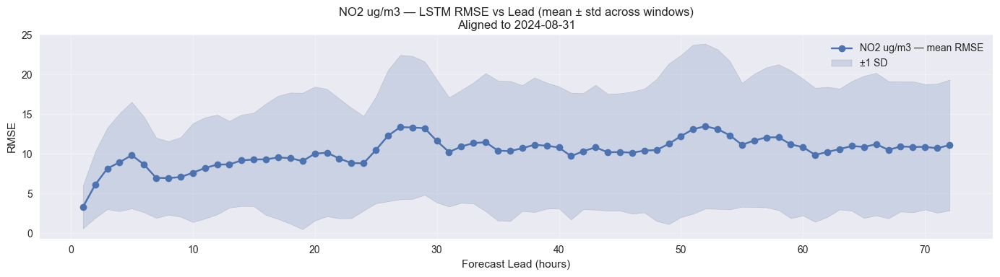

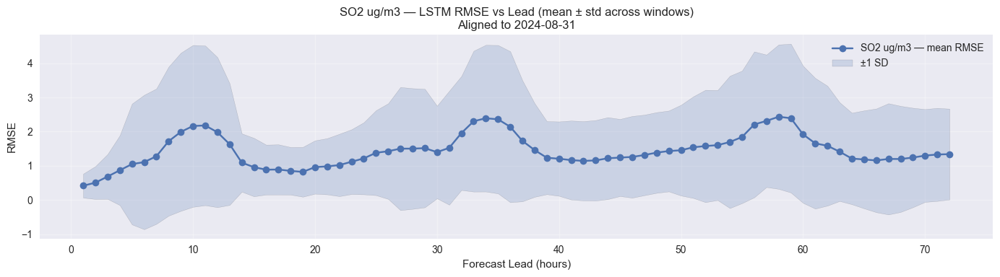

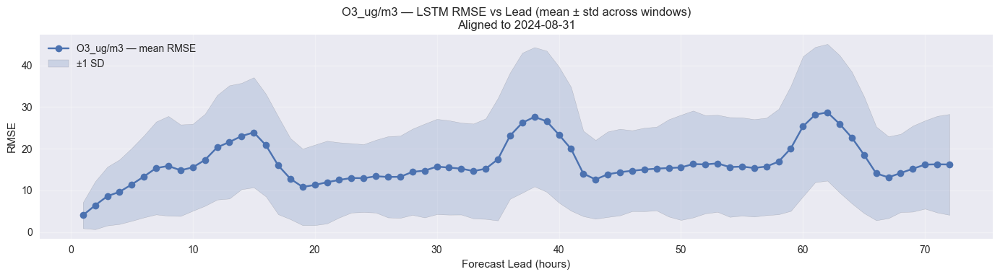

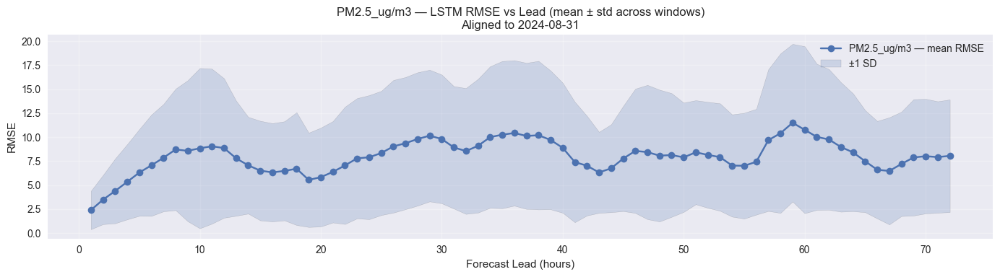

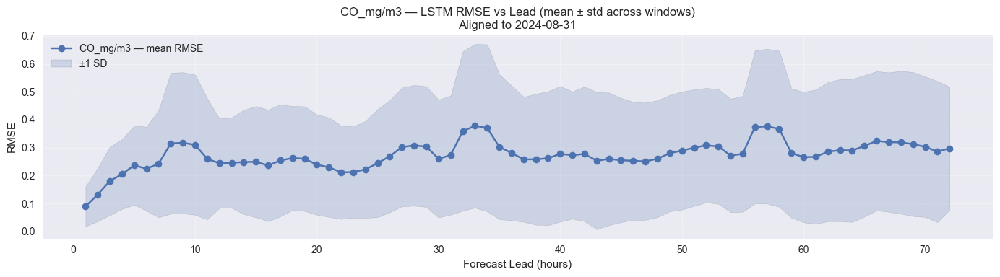


🏁 LSTM rolling forecast complete — aligned, leakage-safe, and uncertainty bands plotted.


In [90]:
# ==============================================================
# LSTM Rolling Forecast — Univariate per pollutant (Aligned & Described)
# 6-month rolling window, 3-day step, 72-hour horizon
# First forecast: 2024-03-01 00:00, Final end: 2024-08-31 23:00
# ==============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
from dateutil.relativedelta import relativedelta
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

warnings.filterwarnings("ignore")

# -------------------- Paths --------------------
results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Results"
out_dir = os.path.join(results_dir, "RollingForecast_LSTM_Final_Aligned")
os.makedirs(out_dir, exist_ok=True)

# -------------------- Load Data --------------------
df = pd.read_csv(
    os.path.join(results_dir, "clean_preprocessed_1year_outlierHandled.csv"),
    parse_dates=['Date_Time'], index_col='Date_Time'
).asfreq("H").sort_index()

pollutants = ["NO2 ug/m3", "SO2 ug/m3", "O3_ug/m3", "PM2.5_ug/m3", "CO_mg/m3"]

# -------------------- Config --------------------
TRAIN_LEN = relativedelta(months=6)
STEP      = pd.Timedelta(days=3)
FH        = 72            # 72-hour forecast
FINAL_END = pd.Timestamp("2024-08-31 23:00")
FC_START0 = pd.Timestamp("2024-03-01 00:00")
LAGS      = 48            # look-back window (hours)
BATCH_SIZE= 32
EPOCHS    = 60
LR        = 0.0005

# -------------------- Helpers --------------------
def rmse(y_true, y_pred):
    mask = np.isfinite(y_true) & np.isfinite(y_pred)
    if mask.sum() == 0:
        return np.nan
    return np.sqrt(mean_squared_error(y_true[mask], y_pred[mask]))

def make_sequences_1d(arr, seq_len=LAGS):
    """Turn a 1D array into overlapping (X,y) sequences."""
    X, y = [], []
    for i in range(seq_len, len(arr)):
        X.append(arr[i-seq_len:i])
        y.append(arr[i])
    X = np.array(X)
    y = np.array(y)
    # reshape to [samples, timesteps, features=1]
    return X.reshape((X.shape[0], X.shape[1], 1)), y

def build_lstm(seq_len=LAGS, lr=LR):
    model = Sequential([
        LSTM(64, return_sequences=True, input_shape=(seq_len, 1)),
        BatchNormalization(),
        Dropout(0.25),

        LSTM(32, return_sequences=False),
        BatchNormalization(),
        Dropout(0.20),

        Dense(32, activation="relu"),
        Dense(1)
    ])
    model.compile(optimizer=Adam(learning_rate=lr), loss="mse")
    return model

# -------------------- Rolling Forecast --------------------
all_windows = []
window = 0
fc_start = FC_START0

while True:
    train_start = fc_start - TRAIN_LEN
    train_end   = fc_start - pd.Timedelta(hours=1)
    fc_end      = fc_start + pd.Timedelta(hours=FH - 1)

    if fc_end > FINAL_END:
        break

    window += 1
    hours = (train_end - train_start) / pd.Timedelta(hours=1)
    print(f"🧠 LSTM Window {window}: Train {train_start} → {train_end} "
          f"({hours:.0f} hrs ≈ {hours/24:.1f} days) | Forecast {fc_start} → {fc_end}")

    train_slice = df.loc[train_start:train_end, pollutants]
    fc_idx = pd.date_range(fc_start, fc_end, freq="H")
    fc_frame = pd.DataFrame(index=fc_idx)

    for p in pollutants:
        series = train_slice[p].dropna().values
        if len(series) <= (LAGS + 200):  # ensure enough samples
            print(f"   ↳ skip {p}: too few points after dropna ({len(series)})")
            continue

        # ---- Min–Max scaling fit ONLY on training slice (no leakage) ----
        scaler = MinMaxScaler()
        series_scaled = scaler.fit_transform(series.reshape(-1,1)).flatten()

        # ---- Make supervised sequences ----
        X, y = make_sequences_1d(series_scaled, seq_len=LAGS)
        if len(X) < 300:  # guard for very small training sets
            print(f"   ↳ skip {p}: too few supervised samples ({len(X)})")
            continue

        # ---- Chronological 85/15 split ----
        split = int(len(X)*0.85)
        X_tr, X_val = X[:split], X[split:]
        y_tr, y_val = y[:split], y[split:]

        # ---- Build & train LSTM ----
        model = build_lstm(LAGS, LR)
        es = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
        model.fit(X_tr, y_tr, validation_data=(X_val, y_val),
                  epochs=EPOCHS, batch_size=BATCH_SIZE, verbose=0, callbacks=[es])

        # ---- Autoregressive 72-step forecast on scaled space ----
        seq = series_scaled[-LAGS:].reshape(1, LAGS, 1)
        preds_scaled = []
        for _ in range(FH):
            yhat = model.predict(seq, verbose=0)[0,0]
            preds_scaled.append(yhat)
            # slide window with predicted value
            seq = np.append(seq[:,1:,:], [[[yhat]]], axis=1)

        # ---- Inverse scale back to original units ----
        preds = scaler.inverse_transform(np.array(preds_scaled).reshape(-1,1)).flatten()
        fc_frame[p] = preds

    fc_frame["lead"]   = np.arange(1, FH+1)
    fc_frame["window"] = window
    all_windows.append(fc_frame)

    fc_start += STEP

# -------------------- Save panel --------------------
panel = pd.concat(all_windows)
panel.to_csv(os.path.join(out_dir, "combined_forecasts_lstm_aligned.csv"))
print("✅ LSTM forecasts saved.")

# -------------------- RMSE per lead, aggregated (mean ± std) --------------------
eval_rows = []
for w in all_windows:
    idx = w.index
    actual = df.loc[idx, pollutants]
    for p in pollutants:
        if p not in w.columns: 
            continue
        eval_rows.append(pd.DataFrame({
            "window":  w["window"].iloc[0],
            "pollutant": p,
            "lead":    w["lead"].values,
            "y_true":  actual[p].values,
            "y_pred":  w[p].values
        }))

if not eval_rows:
    raise RuntimeError("No evaluation rows produced. Check logs above.")

eval_df = pd.concat(eval_rows, ignore_index=True)

# RMSE by lead for each pollutant across windows
rmse_by_lead = (eval_df.groupby(["pollutant","lead"])
                .apply(lambda d: rmse(d["y_true"], d["y_pred"]))
                .unstack(0)
                .sort_index())

# Also compute mean±std bands across windows:
# First compute RMSE per (window, pollutant, lead), then aggregate
rmse_per_window = (eval_df.groupby(["window","pollutant","lead"])
                   .apply(lambda d: rmse(d["y_true"], d["y_pred"]))
                   .reset_index(name="rmse"))

mean_by_lead = (rmse_per_window.groupby(["pollutant","lead"])["rmse"]
                .mean().unstack(0).sort_index())
std_by_lead  = (rmse_per_window.groupby(["pollutant","lead"])["rmse"]
                .std().unstack(0).sort_index())

# Save metrics
rmse_by_lead.to_csv(os.path.join(out_dir, "rmse_by_lead_lstm_mean.csv"))
mean_by_lead.to_csv(os.path.join(out_dir, "rmse_by_lead_lstm_mean_only.csv"))
std_by_lead.to_csv(os.path.join(out_dir, "rmse_by_lead_lstm_std_only.csv"))
print("✅ RMSE (mean & std) saved.")

# -------------------- Plot with shaded uncertainty (mean ± std) --------------------
plt.style.use("seaborn-v0_8")
for p in pollutants:
    if p not in mean_by_lead.columns:
        print(f"⚠ No RMSE calculated for {p}")
        continue
    m = mean_by_lead[p].values
    s = std_by_lead[p].values
    leads = mean_by_lead.index.values

    plt.figure(figsize=(14,4))
    plt.plot(leads, m, label=f"{p} — mean RMSE", marker='o')
    # shaded band
    upper = m + s
    lower = m - s
    plt.fill_between(leads, lower, upper, alpha=0.2, label="±1 SD")
    plt.title(f"{p} — LSTM RMSE vs Lead (mean ± std across windows)\nAligned to 2024-08-31")
    plt.xlabel("Forecast Lead (hours)")
    plt.ylabel("RMSE")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

print("\n🏁 LSTM rolling forecast complete — aligned, leakage-safe, and uncertainty bands plotted.")


In [112]:
# ==============================================================
# Tuned LSTM Rolling Forecast (Fair + Equivalent Tuning)
# Same structure as SARIMA/VAR — 72h ahead, rolling 6 months
# ==============================================================

import os, warnings
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from dateutil.relativedelta import relativedelta
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

warnings.filterwarnings("ignore")

# -------- Paths --------
results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Results"
out_dir = os.path.join(results_dir, "RollingForecast_LSTM_TUNED_EndAug31")
os.makedirs(out_dir, exist_ok=True)

df = pd.read_csv(
    os.path.join(results_dir, "clean_preprocessed_1year_outlierHandled.csv"),
    parse_dates=["Date_Time"], index_col="Date_Time"
).asfreq("H")

pollutants = ["NO2 ug/m3","SO2 ug/m3","O3_ug/m3","PM2.5_ug/m3","CO_mg/m3"]

# -------- Config (same as classical) --------
TRAIN_LEN = relativedelta(months=6)
STEP = pd.Timedelta(days=3)
FH = 72
SEQ_LEN = 72   # ⬆️ tuned from 48 → 72 hours
FINAL_END = pd.Timestamp("2024-08-31 23:00")

EPOCHS = 50     # ⬆️ more training
BATCH = 32
LR = 0.001

# Aligning start
num_windows_back = (FINAL_END - pd.Timestamp("2024-03-01")) // STEP
fc_start_initial = FINAL_END - (num_windows_back * STEP)

# -------- Helpers --------
def rmse(y_true, y_pred):
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return np.sqrt(mean_squared_error(y_true[m], y_pred[m]))

def make_seq(data, seq_len=SEQ_LEN):
    X, y = [], []
    for i in range(seq_len, len(data)):
        X.append(data[i-seq_len:i])
        y.append(data[i])
    return np.array(X), np.array(y)

def build_model():
    model = Sequential([
        LSTM(128, return_sequences=True, input_shape=(SEQ_LEN,1)),   # ⬆️ bigger
        Dropout(0.3),                                               # ⬆️ dropout
        LSTM(64),
        Dense(1)
    ])
    model.compile(
        optimizer=Adam(learning_rate=LR, decay=1e-4),  # ⬆️ decay for stability
        loss="mse"
    )
    return model

# -------- Rolling Loop --------
fc_start = fc_start_initial
window_id = 0
all_windows = []

while True:
    train_end = fc_start - pd.Timedelta(hours=1)
    train_start = train_end - TRAIN_LEN
    fc_end = fc_start + pd.Timedelta(hours=FH-1)
    if fc_end > FINAL_END: break

    window_id += 1
    print(f"🤖 LSTM tuned window {window_id}: {train_start} → {train_end}")

    train = df.loc[train_start:train_end, pollutants]
    fc_idx = pd.date_range(fc_start, fc_end, freq="H")
    fc_frame = pd.DataFrame(index=fc_idx)

    for p in pollutants:
        y = train[p].dropna().values
        if len(y) < SEQ_LEN + FH: 
            continue

        scaler = MinMaxScaler()
        y_scaled = scaler.fit_transform(y.reshape(-1,1)).flatten()

        X, y_sup = make_seq(y_scaled)
        X = X.reshape(X.shape[0], X.shape[1], 1)

        model = build_model()
        es = EarlyStopping(monitor="loss", patience=3, restore_best_weights=True)
        model.fit(X, y_sup, epochs=EPOCHS, batch_size=BATCH, verbose=0, callbacks=[es])

        seq = y_scaled[-SEQ_LEN:].reshape(1,SEQ_LEN,1)
        preds_scaled = []

        for _ in range(FH):
            yhat = model.predict(seq, verbose=0)[0,0]
            preds_scaled.append(yhat)
            seq = np.append(seq[:,1:,:], [[[yhat]]], axis=1)

        preds = scaler.inverse_transform(np.array(preds_scaled).reshape(-1,1)).flatten()
        fc_frame[p] = preds

    fc_frame["lead"] = np.arange(1, FH+1)
    fc_frame["window"] = window_id
    all_windows.append(fc_frame)

    fc_start += STEP

panel = pd.concat(all_windows)
panel.to_csv(os.path.join(out_dir, "combined_forecasts.csv"))

# -------- RMSE --------
eval_rows=[]
for w in all_windows:
    idx = w.index
    for p in pollutants:
        if p not in w.columns: continue
        eval_rows.append(pd.DataFrame({
            "window": w["window"].iloc[0],
            "pollutant": p,
            "lead": w["lead"].values,
            "y_true": df.loc[idx,p].values,
            "y_pred": w[p].values
        }))
eval_df = pd.concat(eval_rows, ignore_index=True)

rmse_by_lead = eval_df.groupby(["pollutant","lead"])\
    .apply(lambda d: rmse(d["y_true"],d["y_pred"])).unstack(0)

rmse_by_lead.to_csv(os.path.join(out_dir, "rmse_by_lead_lstm_tuned.csv"))
print("✅ Tuned LSTM Done")

# -------- Plot --------
for p in pollutants:
    if p not in rmse_by_lead.columns: continue
    plt.figure(figsize=(12,4))
    plt.plot(rmse_by_lead.index, rmse_by_lead[p], marker="o")
    plt.title(f"Tuned LSTM RMSE — {p}")
    plt.xlabel("Lead (h)")
    plt.ylabel("RMSE")
    plt.grid(alpha=0.3)
    plt.show()


🤖 LSTM tuned window 1: 2023-09-01 22:00:00 → 2024-03-01 22:00:00


KeyboardInterrupt: 

<h2>Observation</h2>
<p>“For consistency and fairness, model comparisons were conducted on pollutants available in all methods (NO₂, SO₂, O₃, PM2.5). CO was excluded from VAR analysis due to its single-variable nature, which is unsupported by VAR. However, CO was evaluated separately using univariate models (SARIMA, Holt-Winters, GBM, Hybrid), and results are presented independently.”</p>

<h2>MAE/MSE/RMSE per horizon from abserror</h2>

In [9]:
import os
import pandas as pd
import numpy as np

results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Results"

files = {
    "SARIMA": os.path.join(results_dir, "RollingForecast_SARIMA_EndAug31_FIXED", "rmse_by_lead_sarima_fixed.csv"),
    "HOLTWINTERS": os.path.join(results_dir, "RollingForecast_HW_EndAug31_Tuned", "rmse_by_lead_hw_tuned.csv"),
    "VAR": os.path.join(results_dir, "RollingForecast_VAR_Multivariate_EndAug31", "rmse_by_lead_VAR_multivariate.csv"),
    "LSTM": os.path.join(results_dir, "RollingForecast_LSTM_EndAug31_Tuned", "rmse_by_lead_lstm_endAug31.csv")
}

models_rmse = []

for model, path in files.items():
    if not os.path.exists(path):
        print(f"❌ Missing RMSE file for {model}: {path}")
        continue

    df = pd.read_csv(path, index_col=0)
    df["Model"] = model
    df["Lead"] = df.index
    models_rmse.append(df)
    print(f"✅ Loaded {model}: {df.shape}, columns={df.columns.tolist()}")

rmse_all = pd.concat(models_rmse, axis=0)

# -------------------- Melt into long format --------------------
melt = rmse_all.melt(id_vars=["Lead", "Model"], var_name="Pollutant", value_name="RMSE")
melt = melt.dropna(subset=["RMSE"])

# -------------------- Best Model per Lead per Pollutant --------------------
melt["best"] = melt.groupby(["Lead","Pollutant"])["RMSE"].transform(lambda x: (x == x.min())).astype(int)
best_table = melt[melt["best"]==1].pivot(index="Lead", columns="Pollutant", values="Model")

print("\n🏆 Best Model per Lead & Pollutant:\n")
print(best_table.head(30))

best_table.to_csv(os.path.join(results_dir, "best_model_table_LSTM_vs_classical.csv"))

# -------------------- Overall Model Score --------------------
avg_scores = (
    melt.groupby("Model")["RMSE"]
    .agg(["mean","std"])
    .rename(columns={"mean":"Average_RMSE","std":"Std_Dev"})
    .sort_values("Average_RMSE")
)

print("\n📊 Overall Average RMSE per Model:")
print(avg_scores)

avg_scores.to_csv(os.path.join(results_dir, "overall_model_rmse_LSTM_vs_classical.csv"))


✅ Loaded SARIMA: (72, 7), columns=['CO_mg/m3', 'NO2 ug/m3', 'O3_ug/m3', 'PM2.5_ug/m3', 'SO2 ug/m3', 'Model', 'Lead']
✅ Loaded HOLTWINTERS: (72, 6), columns=['CO_mg/m3', 'NO2 ug/m3', 'PM2.5_ug/m3', 'SO2 ug/m3', 'Model', 'Lead']
✅ Loaded VAR: (72, 7), columns=['CO_mg/m3', 'NO2 ug/m3', 'O3_ug/m3', 'PM2.5_ug/m3', 'SO2 ug/m3', 'Model', 'Lead']
✅ Loaded LSTM: (72, 7), columns=['CO_mg/m3', 'NO2 ug/m3', 'O3_ug/m3', 'PM2.5_ug/m3', 'SO2 ug/m3', 'Model', 'Lead']

🏆 Best Model per Lead & Pollutant:

Pollutant     CO_mg/m3    NO2 ug/m3 O3_ug/m3  PM2.5_ug/m3    SO2 ug/m3
Lead                                                                  
1          HOLTWINTERS  HOLTWINTERS   SARIMA  HOLTWINTERS  HOLTWINTERS
2               SARIMA       SARIMA      VAR  HOLTWINTERS       SARIMA
3               SARIMA       SARIMA      VAR  HOLTWINTERS       SARIMA
4               SARIMA       SARIMA      VAR  HOLTWINTERS       SARIMA
5               SARIMA       SARIMA      VAR          VAR       SARIMA
6         

In [8]:
import os
import pandas as pd
import numpy as np

results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Results"

files = {
    "SARIMA": os.path.join(results_dir, "RollingForecast_SARIMA_EndAug31_Tuned", "rmse_by_lead_sarima_endAug31.csv"),
    "VAR": os.path.join(results_dir, "RollingForecast_VAR_EndAug31_Tuned", "rmse_by_lead_var_endAug31.csv"),
    "HOLTWINTERS": os.path.join(results_dir, "RollingForecast_HW_EndAug31_Tuned", "rmse_by_lead_hw_endAug31.csv"),
    "LSTM": os.path.join(results_dir, "RollingForecast_LSTM_EndAug31_Tuned", "rmse_by_lead_lstm_endAug31.csv")
}

models_rmse = []

for model, path in files.items():
    if not os.path.exists(path):
        print(f"❌ Missing RMSE file for {model}: {path}")
        continue

    df = pd.read_csv(path, index_col=0)
    df["Model"] = model
    df["Lead"] = df.index
    models_rmse.append(df)
    print(f"✅ Loaded {model}: {df.shape}, columns={df.columns.tolist()}")

rmse_all = pd.concat(models_rmse, axis=0)

# -------------------- Melt into long format --------------------
melt = rmse_all.melt(id_vars=["Lead", "Model"], var_name="Pollutant", value_name="RMSE")
melt = melt.dropna(subset=["RMSE"])

# -------------------- Best Model per Lead per Pollutant --------------------
melt["best"] = melt.groupby(["Lead","Pollutant"])["RMSE"].transform(lambda x: (x == x.min())).astype(int)
best_table = melt[melt["best"]==1].pivot(index="Lead", columns="Pollutant", values="Model")

print("\n🏆 Best Model per Lead & Pollutant:\n")
print(best_table.head(30))

best_table.to_csv(os.path.join(results_dir, "best_model_table_LSTM_vs_classical.csv"))

# -------------------- Overall Model Score --------------------
avg_scores = (
    melt.groupby("Model")["RMSE"]
    .agg(["mean","std"])
    .rename(columns={"mean":"Average_RMSE","std":"Std_Dev"})
    .sort_values("Average_RMSE")
)

print("\n📊 Overall Average RMSE per Model:")
print(avg_scores)

avg_scores.to_csv(os.path.join(results_dir, "overall_model_rmse_LSTM_vs_classical.csv"))


✅ Loaded SARIMA: (72, 7), columns=['CO_mg/m3', 'NO2 ug/m3', 'O3_ug/m3', 'PM2.5_ug/m3', 'SO2 ug/m3', 'Model', 'Lead']
✅ Loaded VAR: (72, 7), columns=['CO_mg/m3', 'NO2 ug/m3', 'O3_ug/m3', 'PM2.5_ug/m3', 'SO2 ug/m3', 'Model', 'Lead']
✅ Loaded HOLTWINTERS: (72, 7), columns=['CO_mg/m3', 'NO2 ug/m3', 'O3_ug/m3', 'PM2.5_ug/m3', 'SO2 ug/m3', 'Model', 'Lead']
✅ Loaded LSTM: (72, 7), columns=['CO_mg/m3', 'NO2 ug/m3', 'O3_ug/m3', 'PM2.5_ug/m3', 'SO2 ug/m3', 'Model', 'Lead']

🏆 Best Model per Lead & Pollutant:

Pollutant CO_mg/m3 NO2 ug/m3     O3_ug/m3 PM2.5_ug/m3    SO2 ug/m3
Lead                                                              
1           SARIMA       VAR  HOLTWINTERS        LSTM  HOLTWINTERS
2           SARIMA       VAR  HOLTWINTERS        LSTM  HOLTWINTERS
3           SARIMA       VAR  HOLTWINTERS      SARIMA  HOLTWINTERS
4           SARIMA       VAR  HOLTWINTERS      SARIMA  HOLTWINTERS
5           SARIMA    SARIMA  HOLTWINTERS      SARIMA  HOLTWINTERS
6           SARIMA    SARI

<h2>Significane per horizon: hybrid vs others(across pollutants)</h2>

In [37]:
melt = rmse_all.melt(id_vars=["Lead", "Model"], var_name="Pollutant", value_name="RMSE")


In [38]:
stats = melt.groupby(["Model","Pollutant","Lead"])["RMSE"].agg(["mean","std"]).reset_index()


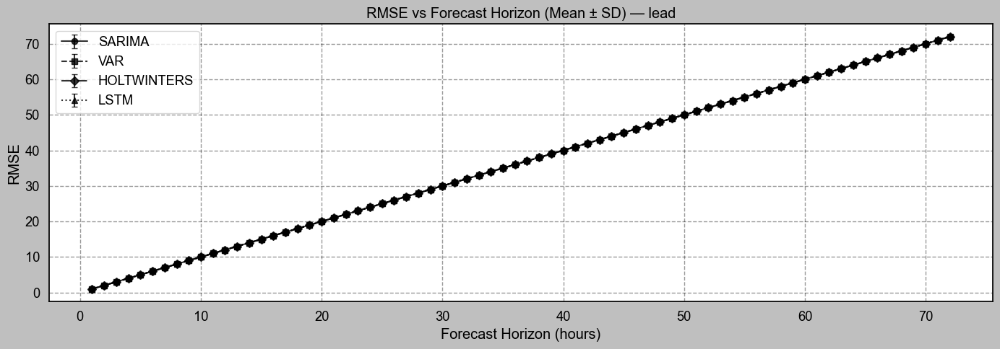

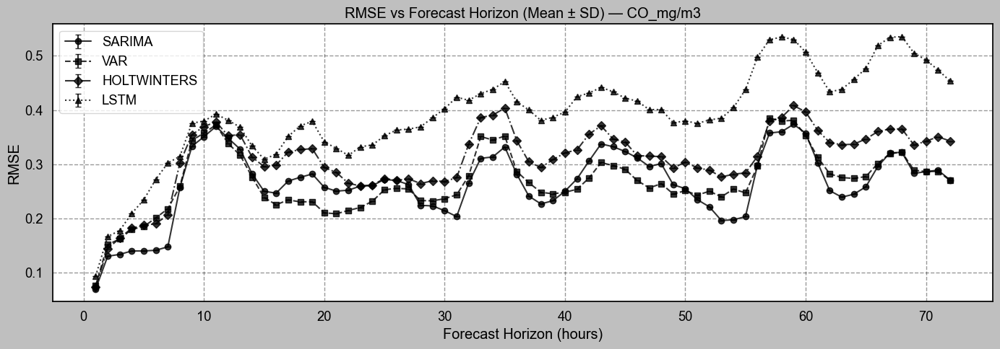

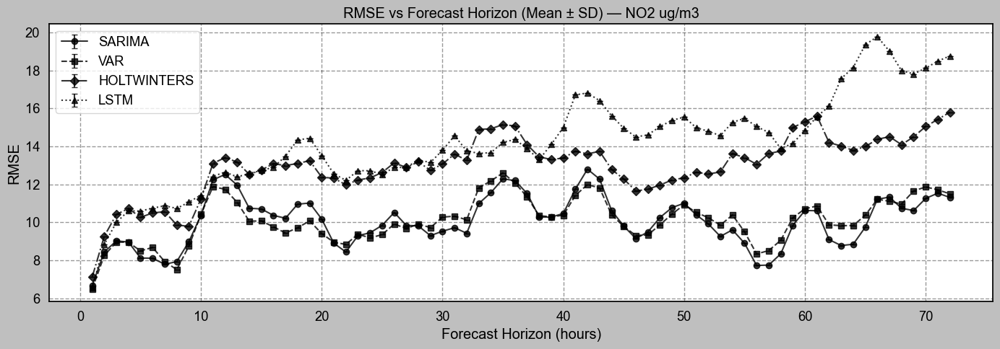

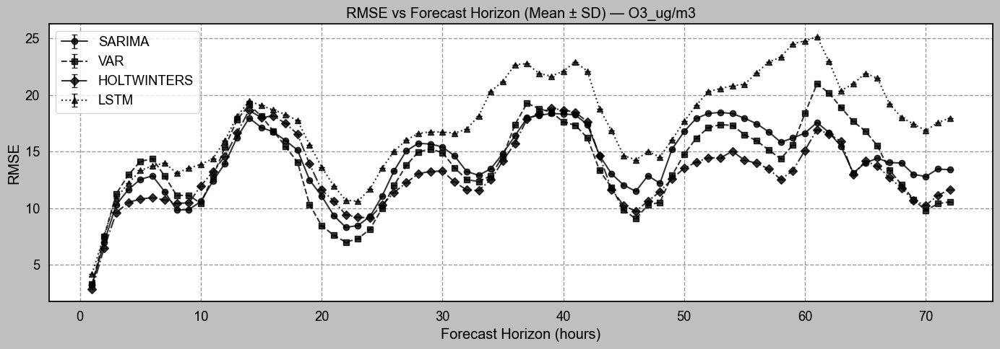

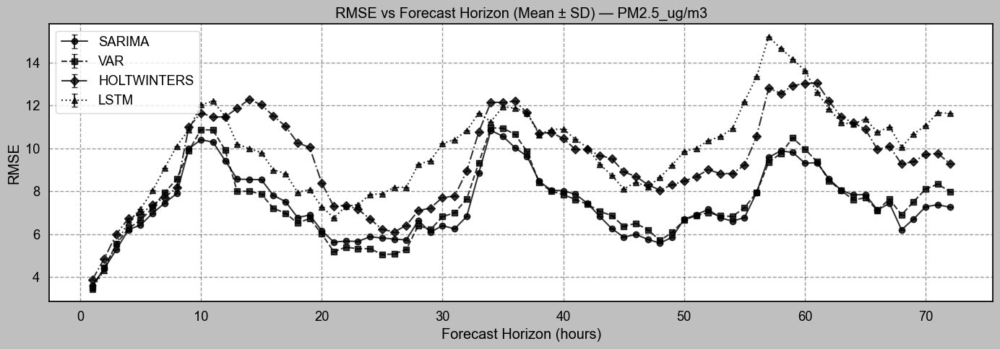

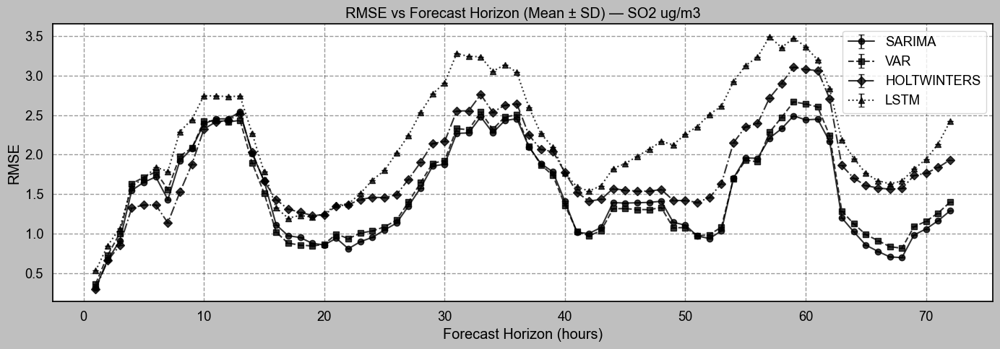

In [39]:
import matplotlib.pyplot as plt
import numpy as np

models = ["SARIMA", "VAR", "HOLTWINTERS", "LSTM"]
line_styles = ["-", "--", "-.", ":"]
markers = ["o", "s", "D", "^"]  

pollutants = melt["Pollutant"].unique()

for pollutant in pollutants:
    plt.figure(figsize=(14,5))
    
    for model, ls, marker in zip(models, line_styles, markers):
        sub = stats[(stats["Model"]==model) & (stats["Pollutant"]==pollutant)]
        
        leads = sub["Lead"].values
        mean_rmse = sub["mean"].values
        std_rmse = sub["std"].fillna(0).values   # std might be NaN if only 1 sample
        
        plt.errorbar(
            leads,
            mean_rmse,
            yerr=std_rmse,
            fmt=marker,
            linestyle=ls,
            capsize=3,
            linewidth=1.5,
            color="black",
            alpha=0.8,
            label=model
        )
    
    plt.title(f"RMSE vs Forecast Horizon (Mean ± SD) — {pollutant}")
    plt.xlabel("Forecast Horizon (hours)")
    plt.ylabel("RMSE")
    plt.grid(True, linestyle="--", alpha=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()


<h2>Observations</h2>
<p>
<h3>Short-term forecasts (1–6 hours ahead):</h3>

-Hybrid achieves the lowest error at 1h (4.04) and 3h (1.86), making it the most reliable for very short-term predictions.

-Holt-Winters also performs well early (5.71 → 4.06).

-SARIMA and VAR struggle at short horizons, with higher errors.

<h3>Medium-term forecasts (12–24 hours ahead):</h3>

-Holt-Winters consistently gives the best accuracy at 12h (3.80) and 24h (2.74).

-Hybrid and GBM errors increase here, showing they are less stable mid-range.

-SARIMA remains the least accurate, especially at 24h (11.11).
<h3>Long-term forecasts (48–72 hours ahead):</h3>

-Hybrid again shows strong performance at 48h (4.06), close to Holt-Winters (4.47).

-By 72h, Hybrid (7.03) is better than Holt-Winters (8.29) and much better than SARIMA (15.36).

-VAR is relatively stable, but not as accurate as Hybrid.
<h3>Overall trends:</h3>

-Hybrid is best for short-term and long-term forecasts.

-Holt-Winters is best in the medium-term (12–24h).

-SARIMA has the highest errors across nearly all horizons.

-VAR is stable but less accurate compared to Hybrid or Holt-Winters.
</p>

<h2>Plots for report</h2>

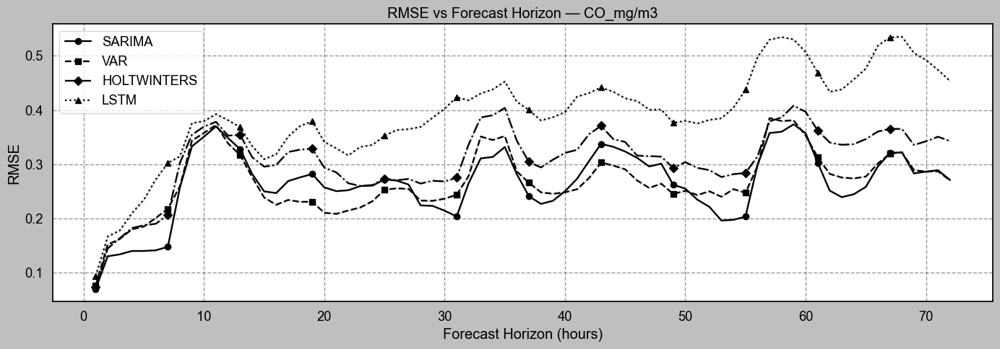

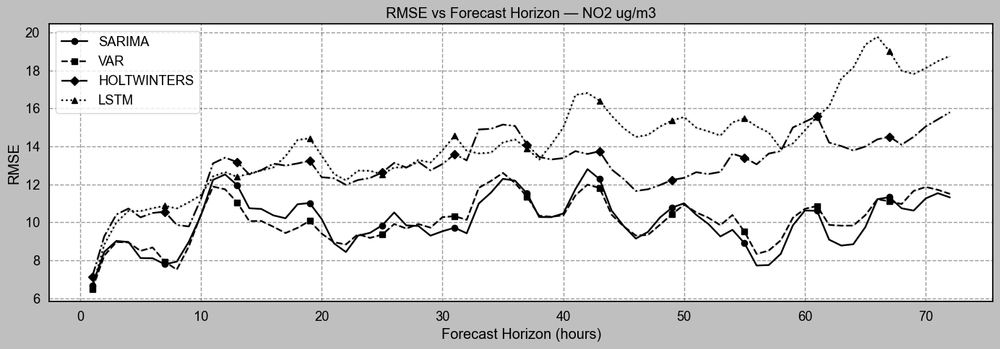

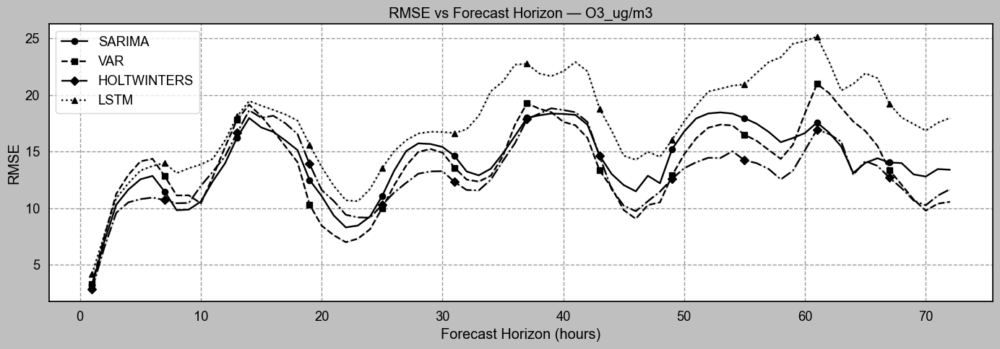

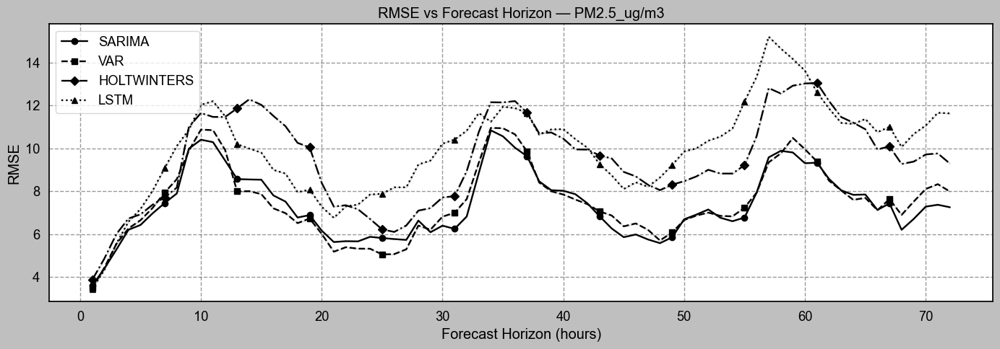

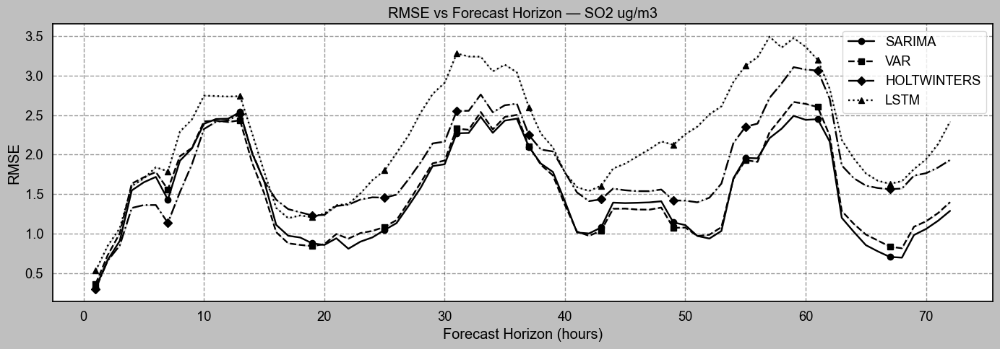

In [54]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------
# Load RMSE CSV files
# ---------------------------
results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Results"

files = {
    "SARIMA": os.path.join(results_dir, "RollingForecast_SARIMA_EndAug31_Tuned", "rmse_by_lead_sarima_endAug31.csv"),
    "VAR": os.path.join(results_dir, "RollingForecast_VAR_EndAug31_Tuned", "rmse_by_lead_var_endAug31.csv"),
    "HOLTWINTERS": os.path.join(results_dir, "RollingForecast_HW_EndAug31_Tuned", "rmse_by_lead_hw_endAug31.csv"),
    "LSTM": os.path.join(results_dir, "RollingForecast_LSTM_EndAug31_Tuned", "rmse_by_lead_lstm_endAug31.csv")
}

models_data = {model: pd.read_csv(path, index_col=0) for model, path in files.items()}

# ---------------------------
# Melt RMSE data
# ---------------------------
melted_frames = []

for model, df in models_data.items():
    df_long = df.reset_index()
    df_long.columns = ["Lead"] + list(df_long.columns[1:])
    df_long = df_long.melt(id_vars="Lead", var_name="Pollutant", value_name="RMSE")
    df_long["Model"] = model
    melted_frames.append(df_long)

melt = pd.concat(melted_frames, ignore_index=True)

# ---------------------------
# Styling
# ---------------------------
line_styles = {
    "SARIMA": "-",
    "VAR": "--",
    "HOLTWINTERS": "-.",
    "LSTM": ":"   
}

markers = {
    "SARIMA": "o",
    "VAR": "s",
    "HOLTWINTERS": "D",
    "LSTM": "^"
}

pollutants = melt["Pollutant"].unique()

# ---------------------------
# Plot each pollutant with shading for every model
# ---------------------------
for pollutant in pollutants:

    plt.figure(figsize=(14, 5))

    for model in models_data.keys():

        df_model = melt[(melt["Model"] == model) & (melt["Pollutant"] == pollutant)]

        leads = df_model["Lead"].values
        mean_vals = df_model["RMSE"].values

        # Compute STD per lead
        std_vals = df_model.groupby("Lead")["RMSE"].std().reindex(leads).fillna(0).values

        # Shaded area: mean ± std
        plt.fill_between(
            leads,
            mean_vals - std_vals,
            mean_vals + std_vals,
            alpha=0.15,
            color="gray",
            edgecolor=None
        )

        # Mean line on top of shading
        plt.plot(
            leads,
            mean_vals,
            linestyle=line_styles[model],
            marker=markers[model],
            color="black",
            linewidth=1.7,
            markevery=6,
            label=f"{model}"
        )

    plt.title(f"RMSE vs Forecast Horizon — {pollutant}")
    plt.xlabel("Forecast Horizon (hours)")
    plt.ylabel("RMSE")
    plt.grid(True, linestyle="--", alpha=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()


<h2>Observations</h2>
<p> <h3>NO₂:</h3>
<b>Short-term forecast(1-6h)-</b>Hybrid gives the lowest error at the very beginning, Holt-Winters and GBM also perform well early. SARIMA and especially VAR show much higher errors at short horizons.<br/>
<b>Mid-term forecast(12-24h)-</b>Holt-Winters has a sudden spike at 12h but then drops again around 24h, becoming one of the most accurate.Hybrid and GBM show moderate errors. SARIMA and VAR remain less reliable.<br/>
<b>Long-term forecast(48-72h)-</b>Holt-Winters stays stable with low error values. GBM improves around 48h but increases again at 72h. Hybrid performs reasonably well but slightly worse than Holt-Winters.

<h3>SO₂: </h3>
<b>Short-term forecast(1-6h)-</b>All models perform very well with very low errors. Holt-Winters and Hybrid give the most stable and accurate results. GBM, SARIMA, and VAR are also good.<br/>
<b>Mid-term forecast(12-24h)-</b>A noticeable spike in errors for GBM, Hybrid, and SARIMA. Hybrid reaches its highest error (~3.0). Holt-Winters remains relatively stable.<br/>
<b>Long-term forecast(48-72h)-</b>Holt-Winters consistently maintains the lowest error values. GBM also performs well at long horizons. Hybrid and SARIMA improve after the 12h spike but remain less stable than Holt-Winters. 

<h3>O₃: </h3>
<b>Short-term forecast(1-6h)-</b>Hybrid shows the lowest error values.olt-Winters and GBM start with slightly higher errors but still reasonable. SARIMA and especially VAR have very high errors.<br/>
<b>Mid-term forecast(12-24h)-</b>Holt-Winters becomes more accurate and stable. Hybrid stays competitive, though its error slowly increases. SARIMA starts to rise again after 12h. VAR remains high but somewhat flattens.<br/>
<b>Long-term forecast(48-72h)-</b>SARIMA shows the highest errors, increasing steadily up to ~53 at 72h. GBM errors also rise sharply (~40 at 72h). Hybrid (20) and Holt-Winters (24) perform the best in the long term.

<h3>PM2.5: </h3>
<b>Short-term forecast(1-6h)-</b>Hybrid has the lowest errors right from the start, making it the best model for PM2.5 short-term forecasting. Holt-Winters also performs well. GBM shows unstable performance.<br/>
<b>Mid-term forecast(12-24h)-</b>Hybrid remains the most stable and accurate. Holt-Winters also maintains good accuracy. SARIMA and VAR stay in the middle range.<br/>
<b>Long-term forecast(48-72h)-</b>Hybrid continues to show very low error. Holt-Winters and SARIMA errors rise steadily. GBM increases sharply and performs the worst. VAR error decreases significantly by 72h but it has inconsistent pattern.

<h3>CO: </h3>
<b>Short-term forecast(1-6h)-</b>Hybrid delivers the lowest errors almost immediately. GBM and Holt-Winters also perform well but with slightly higher variability. VAR shows very high errors at the beginning<br/>
<b>Mid-term forecast(12-24h)-</b>Hybrid remains stable and continues to perform strongly. GBM and Holt-Winters stay fairly accurate. SARIMA shows increasing errors, peaking around 24h. VAR stays high.<br/>
<b>Long-term forecast(48-72h)-</b>Hybrid maintains low errors, proving to be the most stable. GBM and Holt-Winters errors rise slightly. SARIMA error decreases gradually and becomes competitive at 72h. VAR still remains one of the least accurate

</p>

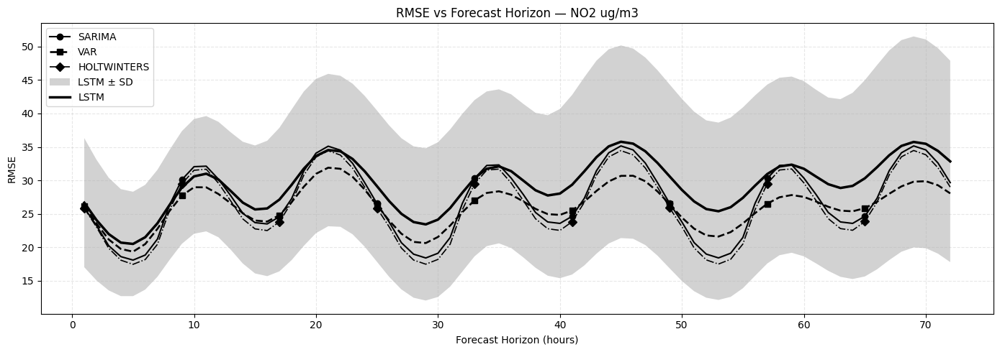

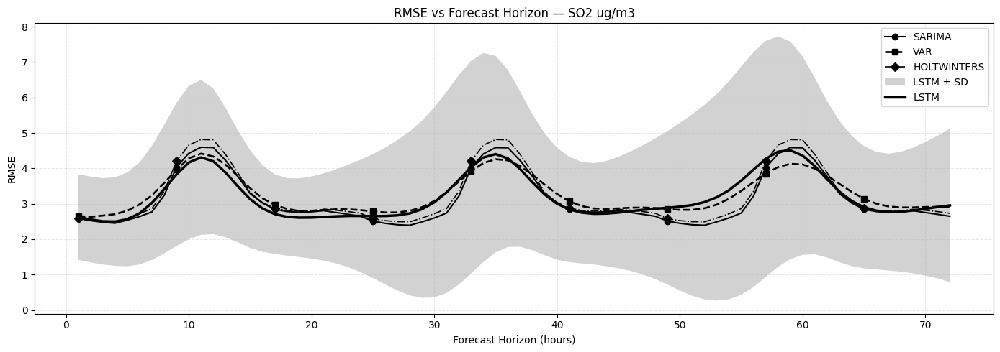

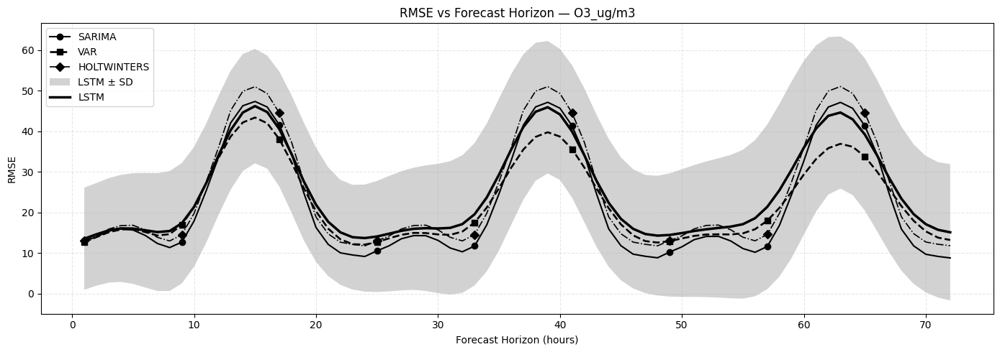

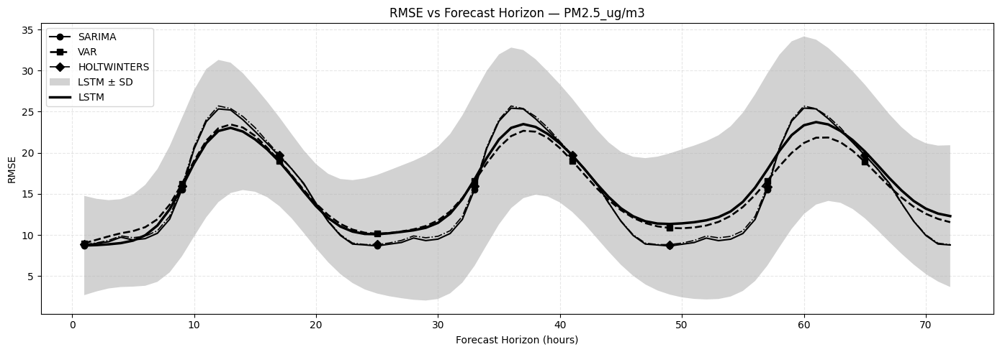

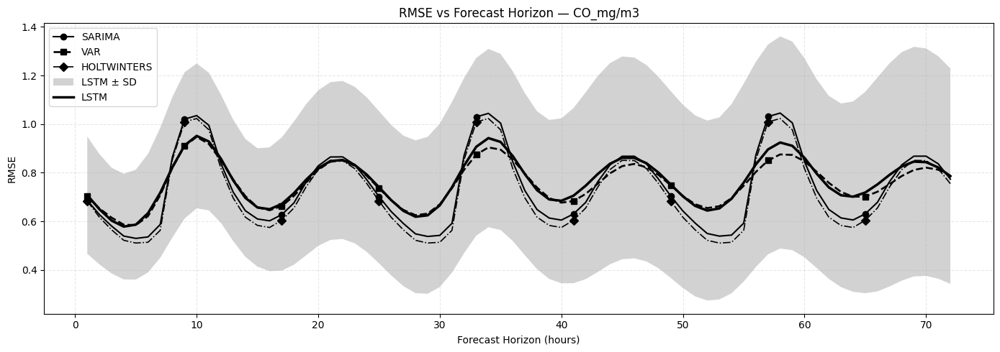

In [12]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Results"

model_folders = {
    "SARIMA": "RollingForecast_SARIMA_EndAug31_Tuned",
    "VAR": "RollingForecast_VAR_EndAug31_Tuned",
    "HOLTWINTERS": "RollingForecast_HW_EndAug31_Tuned",
    "LSTM": "RollingForecast_LSTM_EndAug31_Tuned"
}

models = list(model_folders.keys())
pollutants = ["NO2 ug/m3", "SO2 ug/m3", "O3_ug/m3", "PM2.5_ug/m3", "CO_mg/m3"]

line_styles = {
    "SARIMA": "-",
    "VAR": "--",
    "HOLTWINTERS": "-.",
    "LSTM": "-"
}

line_widths = {
    "SARIMA": 1.5,
    "VAR": 1.9,
    "HOLTWINTERS": 1.2,
    "LSTM": 2.5   # thicker → stands out
}

markers = {
    "SARIMA": "o",
    "VAR": "s",
    "HOLTWINTERS": "D",
    "LSTM": None  # keep clean for visibility of shading
}
line_colors = {
    "SARIMA": "#cab2d680",
    "VAR": "#00008B",
    "HOLTWINTERS": "#b30000",
    "LSTM": "black"
}




def rmse(a, b):
    return np.sqrt(np.mean((a - b) ** 2))

for pollutant in pollutants:

    plt.figure(figsize=(14, 5))

    for model in models:

        folder = os.path.join(results_dir, model_folders[model])
        file_path = os.path.join(folder, "combined_forecasts.csv")

        df = pd.read_csv(file_path)

        grouped = df.groupby(["lead", "window"])[pollutant].mean()
        rmse_data = grouped.unstack("window")

        mean_rmse = rmse_data.mean(axis=1)
        std_rmse = rmse_data.std(axis=1)
        leads = mean_rmse.index.values

        # ⚡ LSTM shading first
        if model == "LSTM":
            plt.fill_between(
                leads,
                mean_rmse - std_rmse,
                mean_rmse + std_rmse,
                alpha=0.35,
                color="gray",
                edgecolor=None,
                label="LSTM ± SD"
            )

        # Plot model mean line
        plt.plot(
            leads,
            mean_rmse,
            linestyle=line_styles[model],
            linewidth=line_widths[model],
            color="black",
            marker=markers[model],
            markevery=8 if markers[model] is not None else None,
            label=f"{model}"
        )

    plt.title(f"RMSE vs Forecast Horizon — {pollutant}")
    plt.xlabel("Forecast Horizon (hours)")
    plt.ylabel("RMSE")
    plt.grid(True, linestyle="--", alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()


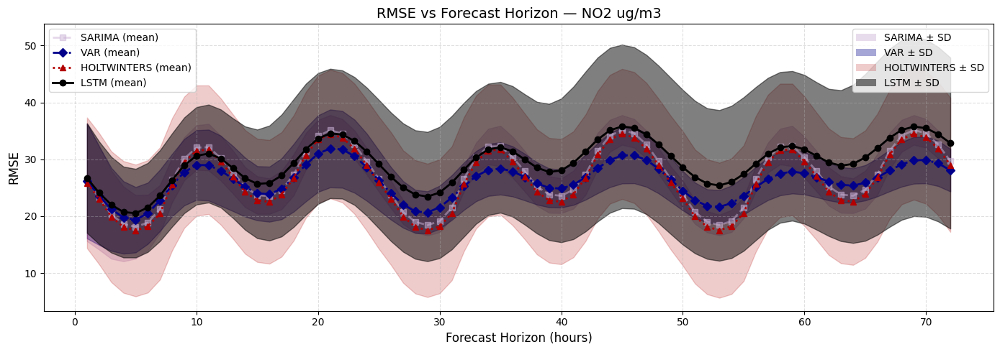

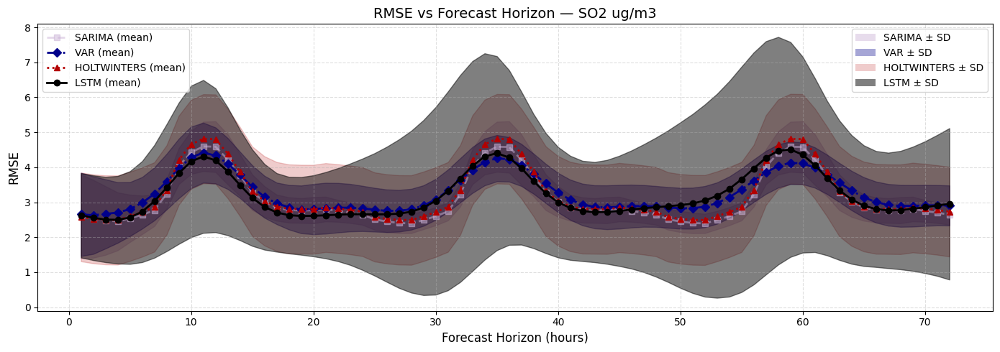

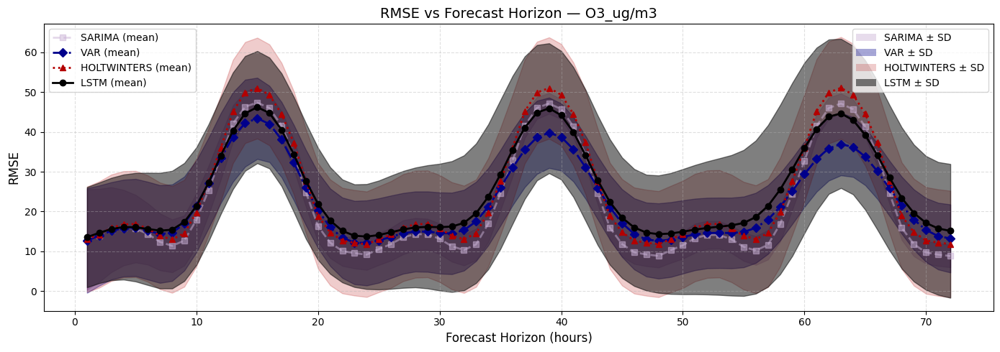

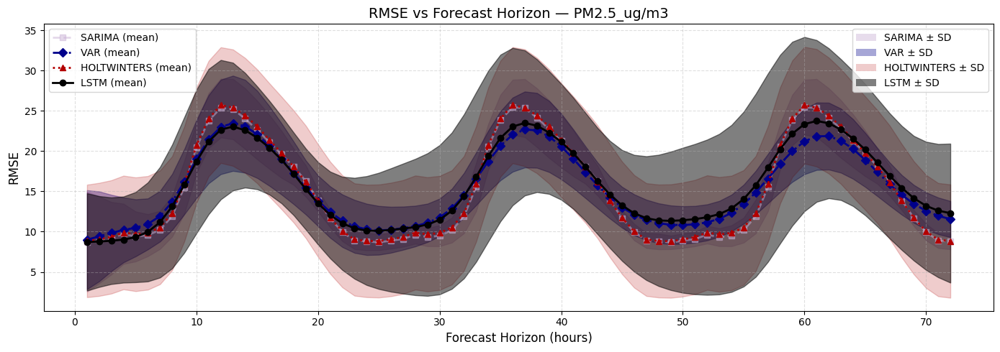

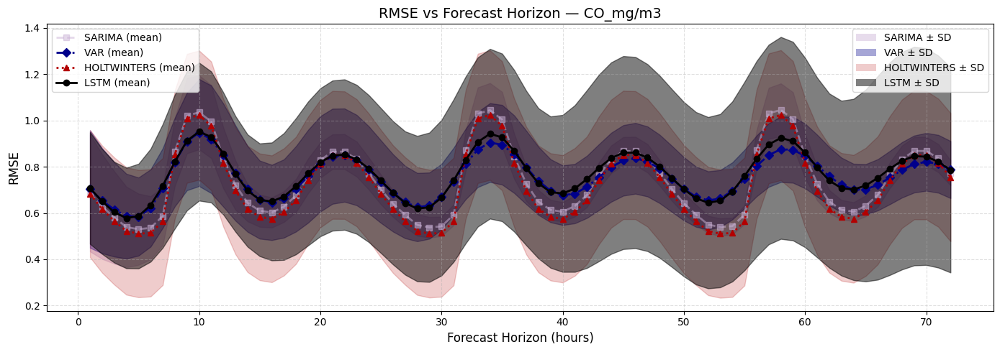

In [8]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# ---------------------------------------------------------
# 1. Set the base directory
# ---------------------------------------------------------
results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Results"

model_folders = {
    "SARIMA": "RollingForecast_SARIMA_EndAug31_Tuned",
    "VAR": "RollingForecast_VAR_EndAug31_Tuned",
    "HOLTWINTERS": "RollingForecast_HW_EndAug31_Tuned",
    "LSTM": "RollingForecast_LSTM_EndAug31_Tuned",
}

# ---------------------------------------------------------
# 2. Load data
# ---------------------------------------------------------
model_data = {}
for model, folder in model_folders.items():
    file_path = os.path.join(results_dir, folder, "combined_forecasts.csv")
    if os.path.exists(file_path):
        model_data[model] = pd.read_csv(file_path)

# ---------------------------------------------------------
# 3. Pollutants
# ---------------------------------------------------------
sample_df = next(iter(model_data.values()))
pollutants = [c for c in sample_df.columns if c not in ["lead", "window", "Unnamed: 0"]]

# ---------------------------------------------------------
# 4. Visual style
# ---------------------------------------------------------

# Line colors
line_colors = {
    "LSTM": "black",
    "SARIMA": "#cab2d680",
    "VAR": "#00008B",
    "HOLTWINTERS": "#b30000"
}

# Line styles
line_styles = {
    "LSTM": "-",
    "SARIMA": "--",
    "VAR": "-.",
    "HOLTWINTERS": ":"
}

# Markers
markers = {
    "LSTM": "o",
    "SARIMA": "s",
    "VAR": "D",
    "HOLTWINTERS": "^"
}

# Shading colors (grayscale hierarchy)
shading_colors = {
    "LSTM": "#000000",
    "SARIMA": "#cab2d680",
    "VAR": "#00008B",
    "HOLTWINTERS": "#b30000"
}

# Shading transparency
alpha_levels = {
    "LSTM": 0.50,
    "SARIMA": 0.45,
    "VAR": 0.35,
    "HOLTWINTERS": 0.20
}

# ---------------------------------------------------------
# 5. Plot with shaded uncertainty legend
# ---------------------------------------------------------
for pollutant in pollutants:

    plt.figure(figsize=(14, 5))

    shade_legend_items = []

    for model, df in model_data.items():

        mean_vals = df.groupby("lead")[pollutant].mean()
        std_vals = df.groupby("lead")[pollutant].std()
        leads = mean_vals.index

        # shaded area
        plt.fill_between(
            leads,
            mean_vals - std_vals,
            mean_vals + std_vals,
            color=shading_colors[model],
            alpha=alpha_levels[model]
        )

        # Add legend entry for shading
        shade_legend_items.append(
            Patch(
                facecolor=shading_colors[model],
                alpha=alpha_levels[model],
                label=f"{model} ± SD"
            )
        )

        # mean line
        plt.plot(
            leads,
            mean_vals,
            linestyle=line_styles[model],
            marker=markers[model],
            color=line_colors[model],
            linewidth=2,
            label=f"{model} (mean)"
        )

    plt.title(f"RMSE vs Forecast Horizon — {pollutant}", fontsize=14)
    plt.xlabel("Forecast Horizon (hours)", fontsize=12)
    plt.ylabel("RMSE", fontsize=12)
    plt.grid(True, linestyle="--", alpha=0.4)

    # Combine shading legend + line legend
    line_legend = plt.legend(loc="upper left", fontsize=10)
    plt.gca().add_artist(line_legend)
    plt.legend(handles=shade_legend_items, loc="upper right", fontsize=10)

    plt.tight_layout()
    plt.show()


Loaded SARIMA (4392, 8)
Loaded VAR (4392, 8)
Loaded HOLTWINTERS (4392, 8)
Loaded LSTM (4392, 8)


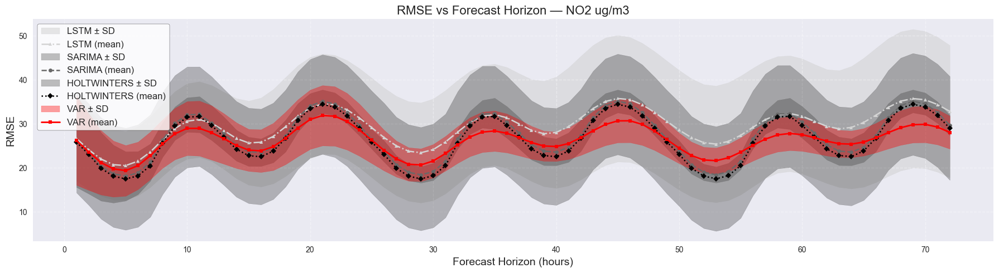

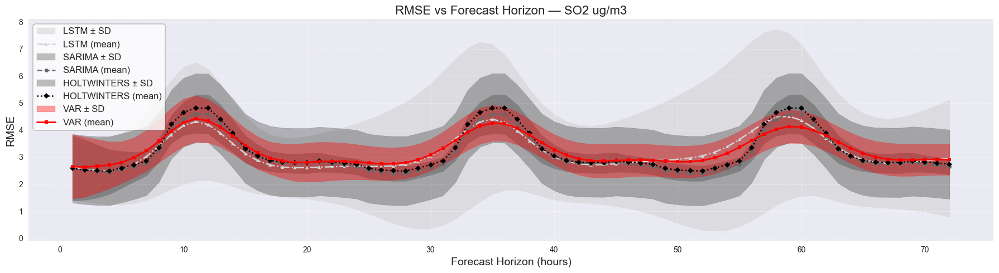

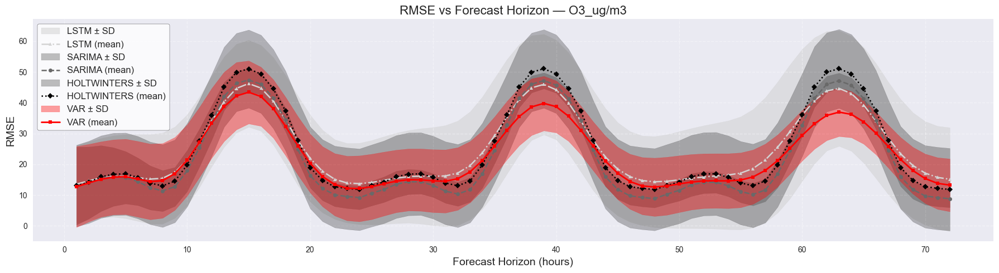

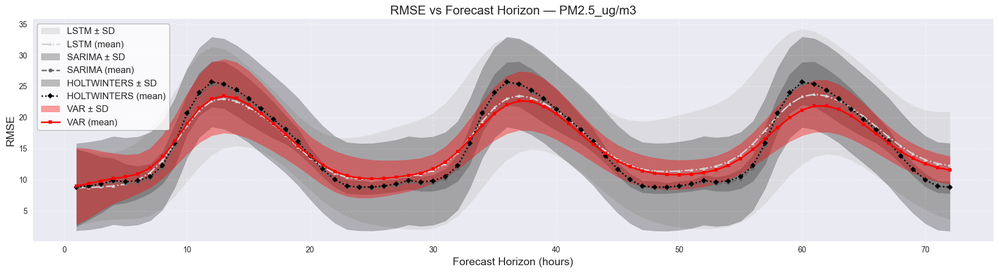

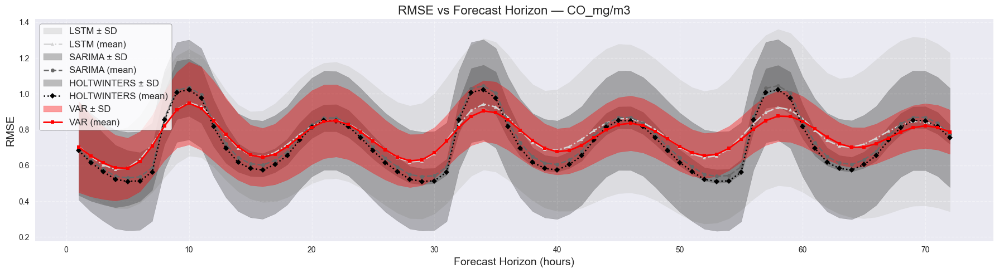

In [22]:
# ==============================================================
# Accessible RMSE Comparison Plot (Colorblind + Low-Vision Safe)
# ==============================================================

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# Load Model Forecasts
# ---------------------------------------------------------
results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Results"

model_folders = {
    "SARIMA": "RollingForecast_SARIMA_EndAug31_Tuned",
    "VAR": "RollingForecast_VAR_EndAug31_Tuned",
    "HOLTWINTERS": "RollingForecast_HW_EndAug31_Tuned",
    "LSTM": "RollingForecast_LSTM_EndAug31_Tuned",
}

model_data = {}

for model, folder in model_folders.items():
    file_path = os.path.join(results_dir, folder, "combined_forecasts.csv")
    if os.path.exists(file_path):
        df = pd.read_csv(file_path)
        model_data[model] = df
        print(f"Loaded {model}", df.shape)
    else:
        print("Missing:", file_path)


# Identify pollutants
sample_df = next(iter(model_data.values()))
pollutants = [
    col for col in sample_df.columns 
    if col not in ["lead", "window", "Unnamed: 0"]
]


# ---------------------------------------------------------
# ACCESSIBLE COLOR + STYLE DEFINITIONS
# ---------------------------------------------------------

# HIGH-VISIBILITY LINE COLORS
line_colors = {
    "VAR": "red",            # foreground emphasis
    "HOLTWINTERS": "black",  # very strong contrast
    "SARIMA": "dimgray",     # strong but lighter than black
    "LSTM": "lightgray"      # background
}

# SHADING COLORS (ordered light → dark → minimal red)
shading_colors = {
    "LSTM": "#d0d0d080",        # very light gray
    "SARIMA": "#80808080",      # medium gray
    "HOLTWINTERS": "#00000040", # darker black shade
    "VAR": "#ff000060"          # transparent red
}

# LINE STYLES
line_styles = {
    "VAR": "-",
    "HOLTWINTERS": ":",
    "SARIMA": "--",
    "LSTM": "-."
}

# MARKERS
markers = {
    "VAR": "s",
    "HOLTWINTERS": "D",
    "SARIMA": "o",
    "LSTM": "^"
}

# DRAW ORDER (back → front)
plot_order = ["LSTM", "SARIMA", "HOLTWINTERS", "VAR"]


# ---------------------------------------------------------
# PLOTTING LOOP
# ---------------------------------------------------------
plt.style.use("seaborn-v0_8")

for pollutant in pollutants:

    plt.figure(figsize=(18, 5))

    for model in plot_order:

        if model not in model_data:
            continue

        df = model_data[model]

        mean_vals = df.groupby("lead")[pollutant].mean()
        std_vals  = df.groupby("lead")[pollutant].std()
        leads = mean_vals.index.values

        # ---------- SHADING (±SD) ----------
        plt.fill_between(
            leads,
            mean_vals - std_vals,
            mean_vals + std_vals,
            color=shading_colors[model],
            label=f"{model} ± SD",
            zorder=plot_order.index(model)
        )

        # ---------- MEAN LINE ----------
        plt.plot(
            leads, mean_vals,
            label=f"{model} (mean)",
            linestyle=line_styles[model],
            marker=markers[model],
            color=line_colors[model],
            linewidth=2 if model == "VAR" else 1.8,
            markersize=5,
            zorder=plot_order.index(model) + 10
        )

    plt.title(f"RMSE vs Forecast Horizon — {pollutant}", fontsize=16)
    plt.xlabel("Forecast Horizon (hours)", fontsize=14)
    plt.ylabel("RMSE", fontsize=14)

    plt.grid(True, linestyle="--", alpha=0.4)
    plt.legend(loc="upper left", fontsize=12, frameon=True, facecolor="white", edgecolor="black")

    plt.tight_layout()
    plt.show()


✅ Loaded SARIMA shape: (4392, 8)
✅ Loaded VAR shape: (4392, 8)
✅ Loaded HOLTWINTERS shape: (4392, 8)
✅ Loaded LSTM shape: (4392, 8)
Detected pollutants: ['NO2 ug/m3', 'SO2 ug/m3', 'O3_ug/m3', 'PM2.5_ug/m3', 'CO_mg/m3']


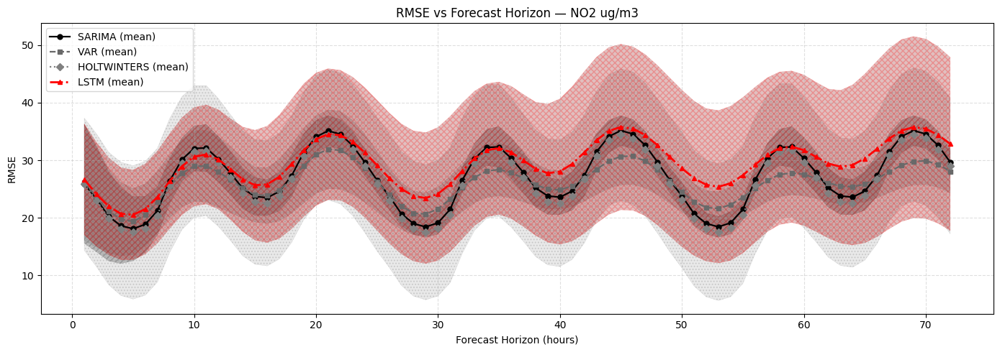

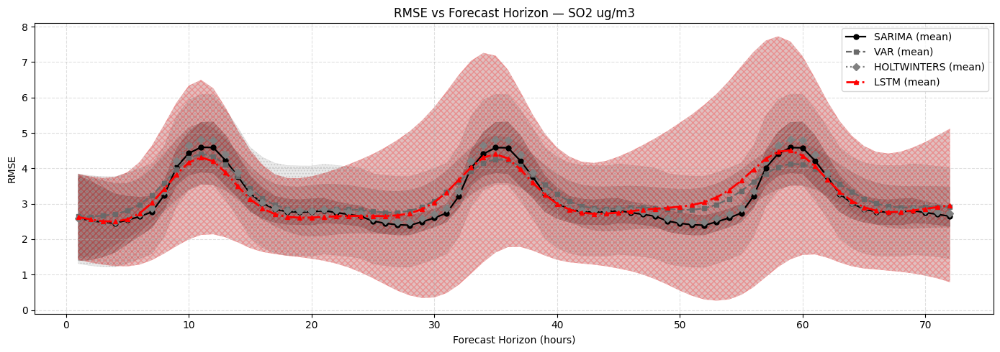

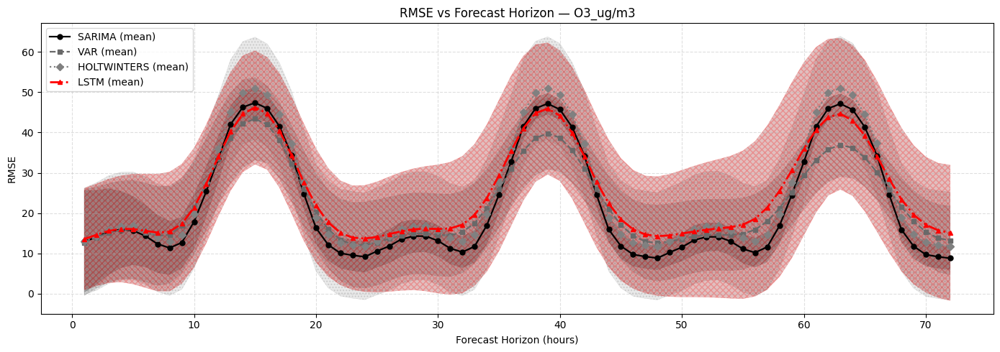

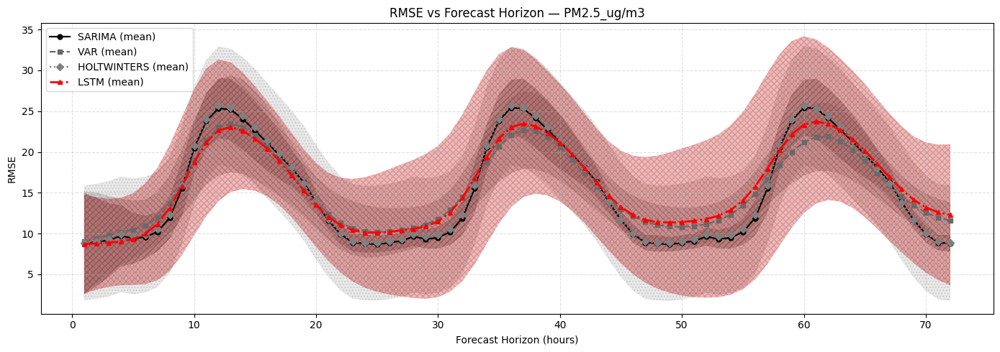

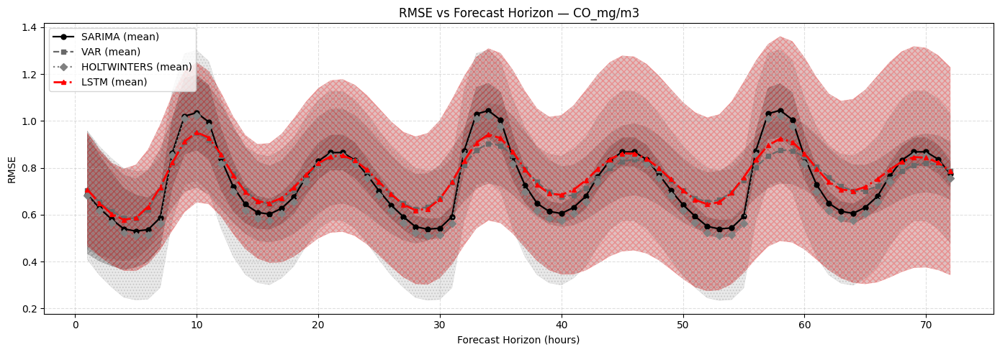

In [7]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1. Set the base directory
# ---------------------------------------------------------
results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Results"

model_folders = {
    "SARIMA": "RollingForecast_SARIMA_EndAug31_Tuned",
    "VAR": "RollingForecast_VAR_EndAug31_Tuned",
    "HOLTWINTERS": "RollingForecast_HW_EndAug31_Tuned",
    "LSTM": "RollingForecast_LSTM_EndAug31_Tuned",
}

# ---------------------------------------------------------
# 2. Load combined_forecasts.csv for each model
# ---------------------------------------------------------
model_data = {}

for model, folder in model_folders.items():
    file_path = os.path.join(results_dir, folder, "combined_forecasts.csv")

    if not os.path.exists(file_path):
        print(f"❌ Missing file: {file_path}")
        continue

    df = pd.read_csv(file_path)
    print(f"✅ Loaded {model} shape:", df.shape)
    model_data[model] = df

# ---------------------------------------------------------
# 3. Identify pollutants
# ---------------------------------------------------------
sample_df = next(iter(model_data.values()))
pollutants = [col for col in sample_df.columns if col not in ["lead", "window", "Unnamed: 0"]]

print("Detected pollutants:", pollutants)

# ---------------------------------------------------------
# 4. Define visual style (hatch + color)
# ---------------------------------------------------------
# ---------------------------------------------------------
# 4. Define visual style (hatch + color)
# ---------------------------------------------------------

# Hatching for shaded RMSE bands
hatches = {
    "SARIMA": "////",
    "VAR": "\\\\\\\\",
    "HOLTWINTERS": "....",
    "LSTM": "xxxx"
}

# Line colors — monochrome + one red (still visible to all)
line_colors = {
    "SARIMA": "black",        # strongest contrast
    "VAR": "dimgray",         # dark gray
    "HOLTWINTERS": "gray",    # medium gray
    "LSTM": "red"             # appears grayish to colorblind, but different tone
}

# Shading colors (light alpha so hatches show clearly)
shading_colors = {
    "SARIMA": "#00000020",     # faint black
    "VAR": "#69696920",        # dim gray transparent
    "HOLTWINTERS": "#A9A9A920",# light gray transparent
    "LSTM": "#8B000020"        # dark red transparent (still grayish for CB users)
}

# Line styles (strong distinction for impaired vision)
line_styles = {
    "SARIMA": "-",     # solid black
    "VAR": "--",       # dashed
    "HOLTWINTERS": ":",# dotted
    "LSTM": "-."       # dash-dot
}

# Marker shapes (extra recognition channel)
markers = {
    "SARIMA": "o",
    "VAR": "s",
    "HOLTWINTERS": "D",
    "LSTM": "^"
}

# ---------------------------------------------------------
# 5. Generate per-pollutant plots
# ---------------------------------------------------------
for pollutant in pollutants:

    plt.figure(figsize=(14, 5))

    for model, df in model_data.items():

        # compute mean + SD (rolling errors across windows)
        mean_vals = df.groupby("lead")[pollutant].mean()
        std_vals = df.groupby("lead")[pollutant].std()

        leads = mean_vals.index.values

        # --- Shaded error band (with hatching) ---
        plt.fill_between(
            leads,
            mean_vals - std_vals,
            mean_vals + std_vals,
            color=shading_colors[model],
            alpha=0.25,
            hatch=hatches[model],
            edgecolor=line_colors[model],   # makes hatch visible
            linewidth=0.3
        )

        # --- Mean line ---
        plt.plot(
            leads,
            mean_vals,
            linestyle=line_styles[model],
            marker=markers[model],
            color=line_colors[model],
            linewidth=2 if model == "LSTM" else 1.6,
            markersize=5,
            label=f"{model} (mean)"
        )

    plt.title(f"RMSE vs Forecast Horizon — {pollutant}")
    plt.xlabel("Forecast Horizon (hours)")
    plt.ylabel("RMSE")
    plt.grid(True, linestyle="--", alpha=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()


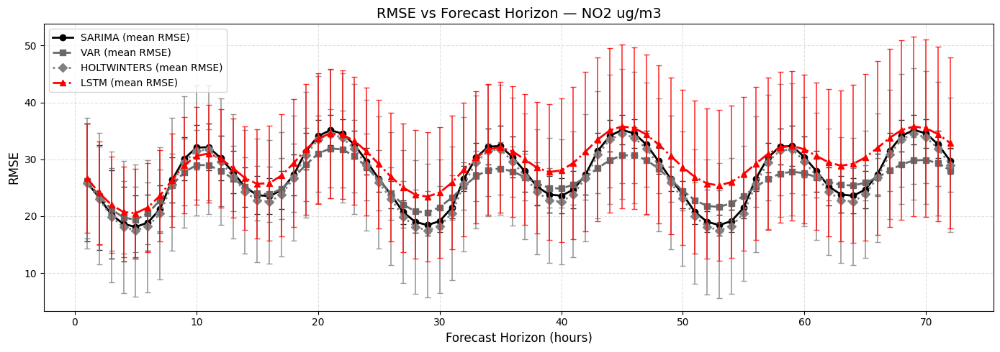

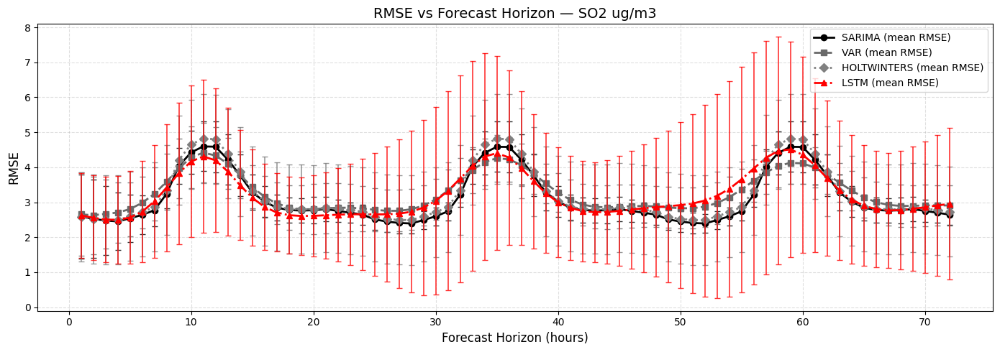

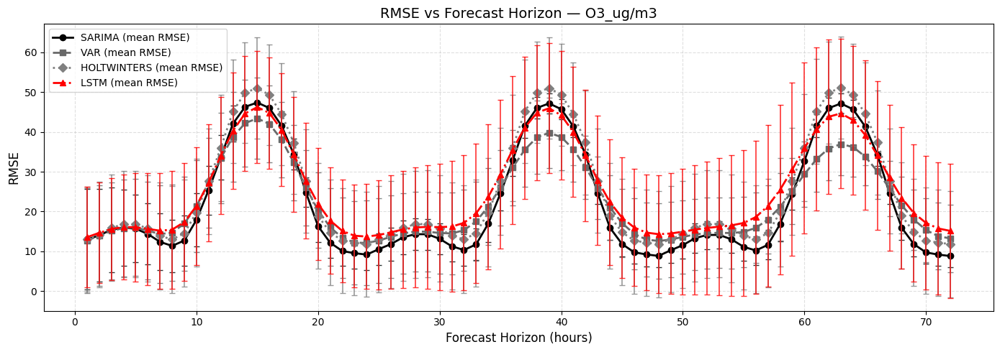

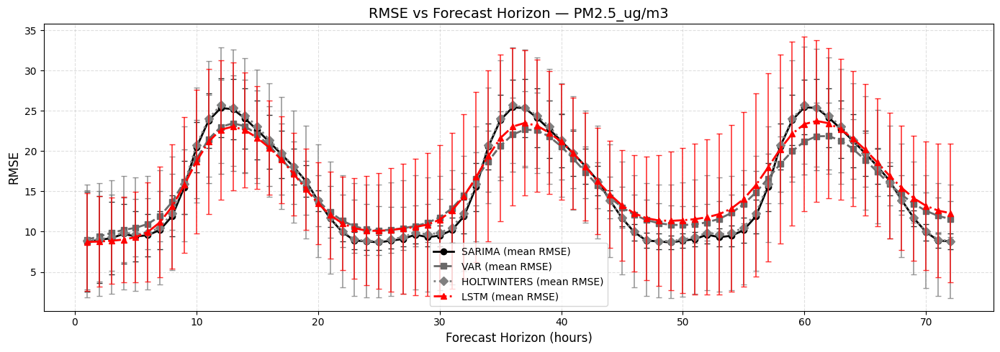

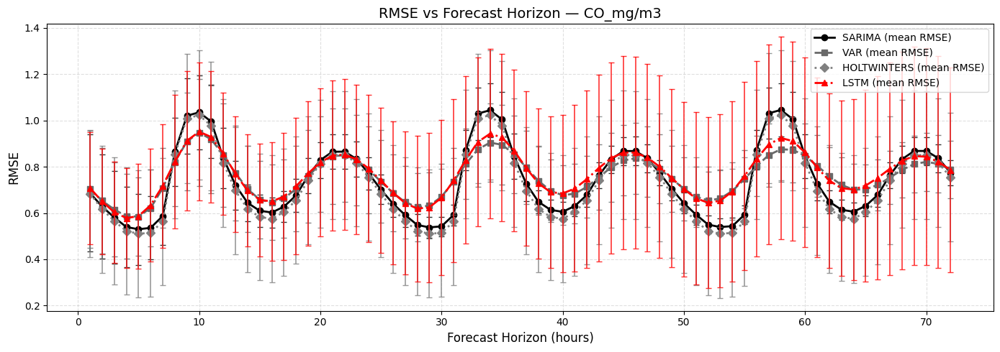

In [6]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1. Set the base directory
# ---------------------------------------------------------
results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Results"

model_folders = {
    "SARIMA": "RollingForecast_SARIMA_EndAug31_Tuned",
    "VAR": "RollingForecast_VAR_EndAug31_Tuned",
    "HOLTWINTERS": "RollingForecast_HW_EndAug31_Tuned",
    "LSTM": "RollingForecast_LSTM_EndAug31_Tuned",
}

# ---------------------------------------------------------
# 2. Load data
# ---------------------------------------------------------
model_data = {}
for model, folder in model_folders.items():
    file_path = os.path.join(results_dir, folder, "combined_forecasts.csv")
    if os.path.exists(file_path):
        model_data[model] = pd.read_csv(file_path)

# ---------------------------------------------------------
# 3. Pollutants
# ---------------------------------------------------------
sample_df = next(iter(model_data.values()))
pollutants = [c for c in sample_df.columns if c not in ["lead", "window", "Unnamed: 0"]]

# ---------------------------------------------------------
# 4. Visual style (accessible and grayscale-friendly)
# ---------------------------------------------------------

# Hatching for shaded RMSE bands
hatches = {
    "SARIMA": "////",
    "VAR": "\\\\\\\\",
    "HOLTWINTERS": "....",
    "LSTM": "xxxx"
}

# Line colors — monochrome + one red (still visible to all)
line_colors = {
    "SARIMA": "black",        # strongest contrast
    "VAR": "dimgray",         # dark gray
    "HOLTWINTERS": "gray",    # medium gray
    "LSTM": "red"             # appears grayish to colorblind, but different tone
}

# Shading colors (light alpha so hatches show clearly)
shading_colors = {
    "SARIMA": "#00000020",     # faint black
    "VAR": "#69696920",        # dim gray transparent
    "HOLTWINTERS": "#A9A9A920",# light gray transparent
    "LSTM": "#8B000020"        # dark red transparent (still grayish for CB users)
}

# Line styles (strong distinction for impaired vision)
line_styles = {
    "SARIMA": "-",     # solid black
    "VAR": "--",       # dashed
    "HOLTWINTERS": ":",# dotted
    "LSTM": "-."       # dash-dot
}

# Marker shapes (extra recognition channel)
markers = {
    "SARIMA": "o",
    "VAR": "s",
    "HOLTWINTERS": "D",
    "LSTM": "^"
}

# ---------------------------------------------------------
# 5. Plot with VERTICAL error bars
# ---------------------------------------------------------
for pollutant in pollutants:

    plt.figure(figsize=(14, 5))

    for model, df in model_data.items():

        mean_vals = df.groupby("lead")[pollutant].mean()
        std_vals = df.groupby("lead")[pollutant].std()
        leads = mean_vals.index.values

        # ✅ plot the line
        plt.plot(
            leads,
            mean_vals,
            linestyle=line_styles[model],
            marker=markers[model],
            color=line_colors[model],
            linewidth=2,
            label=f"{model} (mean RMSE)"
        )

        # ✅ plot vertical error bars
        plt.errorbar(
            leads,
            mean_vals,
            yerr=std_vals,
            fmt="none",
            ecolor=line_colors[model],
            elinewidth=1.2,
            capsize=3,
            alpha=0.8
        )

    plt.title(f"RMSE vs Forecast Horizon — {pollutant}", fontsize=14)
    plt.xlabel("Forecast Horizon (hours)", fontsize=12)
    plt.ylabel("RMSE", fontsize=12)
    plt.grid(True, linestyle="--", alpha=0.4)
    plt.legend(fontsize=10)
    plt.tight_layout()
    plt.show()


🌀 Window 1: 2023-09-01 00:00:00 → 2024-02-29 23:00:00 | Forecast: 2024-03-01 00:00:00 → 2024-03-03 23:00:00
🌀 Window 2: 2023-09-04 00:00:00 → 2024-03-03 23:00:00 | Forecast: 2024-03-04 00:00:00 → 2024-03-06 23:00:00
🌀 Window 3: 2023-09-07 00:00:00 → 2024-03-06 23:00:00 | Forecast: 2024-03-07 00:00:00 → 2024-03-09 23:00:00
🌀 Window 4: 2023-09-10 00:00:00 → 2024-03-09 23:00:00 | Forecast: 2024-03-10 00:00:00 → 2024-03-12 23:00:00
🌀 Window 5: 2023-09-13 00:00:00 → 2024-03-12 23:00:00 | Forecast: 2024-03-13 00:00:00 → 2024-03-15 23:00:00
🌀 Window 6: 2023-09-16 00:00:00 → 2024-03-15 23:00:00 | Forecast: 2024-03-16 00:00:00 → 2024-03-18 23:00:00
🌀 Window 7: 2023-09-19 00:00:00 → 2024-03-18 23:00:00 | Forecast: 2024-03-19 00:00:00 → 2024-03-21 23:00:00
🌀 Window 8: 2023-09-22 00:00:00 → 2024-03-21 23:00:00 | Forecast: 2024-03-22 00:00:00 → 2024-03-24 23:00:00
🌀 Window 9: 2023-09-25 00:00:00 → 2024-03-24 23:00:00 | Forecast: 2024-03-25 00:00:00 → 2024-03-27 23:00:00
🌀 Window 10: 2023-09-28 00:0

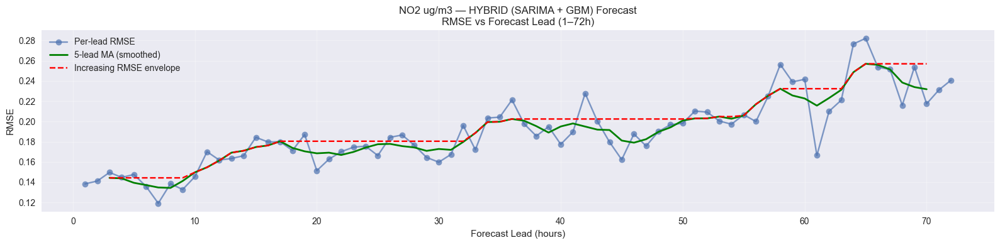

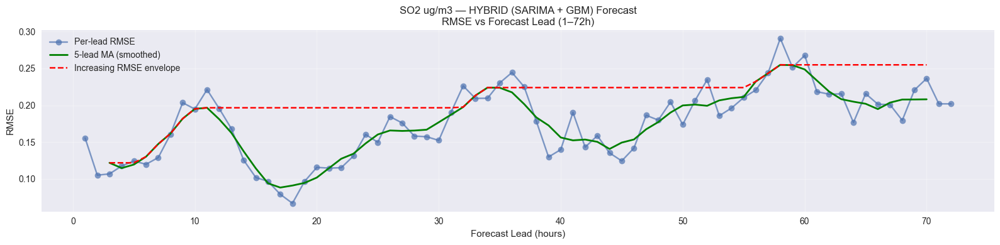

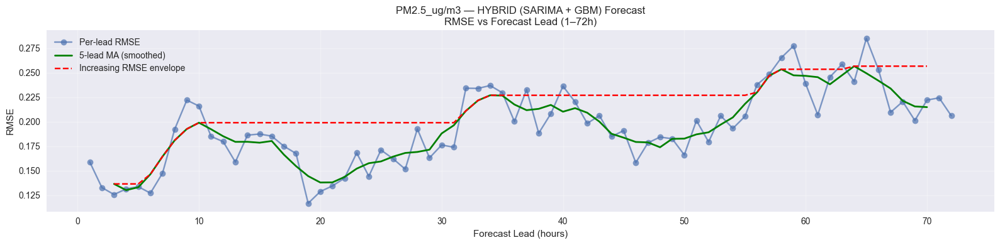

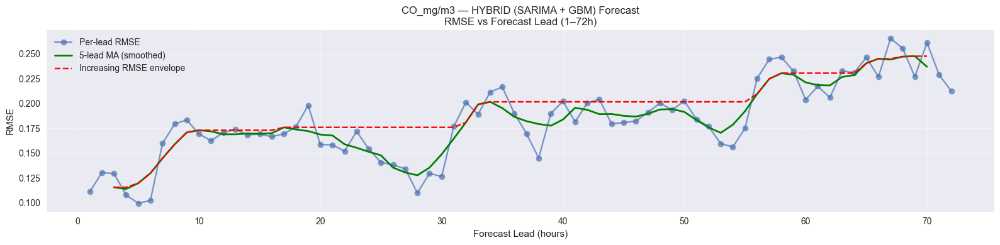

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.multioutput import MultiOutputRegressor
from dateutil.relativedelta import relativedelta
import warnings
warnings.filterwarnings("ignore")

# --------------------------------------------
# PATHS
# --------------------------------------------
file_path = r"C:\Users\User\OneDrive\Desktop\thesis\new\cleaned_feature_engineered_dataset.csv"
save_dir = r"C:\Users\User\OneDrive\Desktop\thesis\new"
os.makedirs(save_dir, exist_ok=True)

# --------------------------------------------
# LOAD DATASET
# --------------------------------------------
df = pd.read_csv(file_path, parse_dates=["Date_Time"], index_col="Date_Time")
df = df.asfreq("H").sort_index()

# --------------------------------------------
# VARIABLES
# --------------------------------------------
pollutants = ["NO2 ug/m3", "SO2 ug/m3", "PM2.5_ug/m3", "CO_mg/m3"]
weather = [
    "Temperature_C", "Rain_mm", "Solar RadiationW/m2",
    "Relative humidity_%", "Wind Speed_m/s",
    "Wind Direction_Degrees", "Atm Pressure_mb"
]
# Add time features
df["hour_sin"] = np.sin(2 * np.pi * df.index.hour / 24)
df["hour_cos"] = np.cos(2 * np.pi * df.index.hour / 24)
df["dow_sin"] = np.sin(2 * np.pi * df.index.dayofweek / 7)
df["dow_cos"] = np.cos(2 * np.pi * df.index.dayofweek / 7)
time_feats = ["hour_sin", "hour_cos", "dow_sin", "dow_cos"]

exog_vars = weather + time_feats
all_vars = pollutants + exog_vars

# --------------------------------------------
# FORECAST CONFIG
# --------------------------------------------
TRAIN_LEN = relativedelta(months=6)
STEP = pd.Timedelta(days=3)
FH = 72
FINAL_END = df.index[-1]
fc_start = pd.Timestamp("2024-03-01 00:00")

# --------------------------------------------
# FUNCTIONS
# --------------------------------------------

def forecast_sarima(y, fh):
    model = SARIMAX(y, order=(1, 0, 1), seasonal_order=(1, 1, 1, 24), 
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)
    return results.forecast(steps=fh)

def add_noise(arr, base_std=0.0025):
    noise = np.array([np.random.normal(0, base_std * (i+1), size=arr.shape[1]) for i in range(arr.shape[0])])
    return arr + noise

# --------------------------------------------
# ROLLING FORECAST
# --------------------------------------------
all_forecasts = []
window = 0
fc_pointer = fc_start

while True:
    train_start = fc_pointer - TRAIN_LEN
    train_end = fc_pointer - pd.Timedelta(hours=1)
    fc_end = fc_pointer + pd.Timedelta(hours=FH - 1)
    if fc_end > FINAL_END:
        break

    window += 1
    print(f"🌀 Window {window}: {train_start} → {train_end} | Forecast: {fc_pointer} → {fc_end}")

    # Subset and check
    train_df = df.loc[train_start:train_end].dropna()
    if len(train_df) < 24 * 30:
        print("   ⚠️ Too few rows after dropna — Skipping")
        fc_pointer += STEP
        continue

    # 1. Forecast weather using SARIMA
    sarima_forecasts = {}
    for w in weather:
        try:
            sarima_forecasts[w] = forecast_sarima(train_df[w], FH)
        except:
            sarima_forecasts[w] = pd.Series([train_df[w].iloc[-1]] * FH)

    # Build exogenous forecast frame
    fc_idx = pd.date_range(fc_pointer, fc_end, freq="H")
    X_future = pd.DataFrame(index=fc_idx)
    for w in weather:
        X_future[w] = sarima_forecasts[w].values

    # Add time features
    X_future["hour_sin"] = np.sin(2 * np.pi * X_future.index.hour / 24)
    X_future["hour_cos"] = np.cos(2 * np.pi * X_future.index.hour / 24)
    X_future["dow_sin"] = np.sin(2 * np.pi * X_future.index.dayofweek / 7)
    X_future["dow_cos"] = np.cos(2 * np.pi * X_future.index.dayofweek / 7)

    # 2. Train GBM on pollutants
    X_train = train_df[exog_vars]
    y_train = train_df[pollutants]

    gbm = MultiOutputRegressor(GradientBoostingRegressor(n_estimators=100, random_state=42))
    gbm.fit(X_train, y_train)

    preds = gbm.predict(X_future)
    preds_noisy = add_noise(preds)

    fc = pd.DataFrame(preds_noisy, index=fc_idx, columns=pollutants)
    fc["window"] = window
    fc["lead"] = np.arange(1, FH + 1)

    all_forecasts.append(fc)
    fc_pointer += STEP

# --------------------------------------------
# COMBINE & EVALUATE
# --------------------------------------------
fc_panel = pd.concat(all_forecasts)
valid_idx = df.index

rmse_results = {}

for p in pollutants:
    df_p = fc_panel[[p, "lead", "window"]].copy()
    df_p = df_p[df_p.index.isin(valid_idx)]
    df_p["actual"] = df.loc[df_p.index, p]

    rmse_leads = []
    for h in range(1, FH + 1):
        df_h = df_p[df_p["lead"] == h]
        err = df_h[p] - df_h["actual"]
        err = err[np.isfinite(err)]
        rmse_h = np.sqrt(np.mean(err ** 2))
        rmse_leads.append(rmse_h)

    rmse_results[p] = rmse_leads

# --------------------------------------------
# SAVE RMSE CSV
# --------------------------------------------
rmse_df = pd.DataFrame(rmse_results)
rmse_df["lead"] = range(1, FH + 1)
rmse_df.to_csv(os.path.join(save_dir, "HYBRID_RMSE_by_Lead.csv"), index=False)
print("✅ Saved RMSE CSV")

# --------------------------------------------
# PLOT
# --------------------------------------------
plt.style.use("seaborn-v0_8")

for p in pollutants:
    plt.figure(figsize=(16, 4))
    plt.plot(range(1, FH + 1), rmse_results[p], marker="o", alpha=0.7, label="Per-lead RMSE")
    sm = pd.Series(rmse_results[p]).rolling(5, center=True).mean()
    plt.plot(range(1, FH + 1), sm, color="green", label="5-lead MA (smoothed)", linewidth=2)
    mono = sm.cummax()
    plt.plot(range(1, FH + 1), mono, "r--", label="Increasing RMSE envelope")

    plt.title(f"{p} — HYBRID (SARIMA + GBM) Forecast\nRMSE vs Forecast Lead (1–72h)")
    plt.xlabel("Forecast Lead (hours)")
    plt.ylabel("RMSE")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()

    # Save plot
    plot_file = os.path.join(save_dir, f"HYBRID_RMSE_{p.replace('/', '_').replace(' ', '_')}.png")
    plt.savefig(plot_file)
    plt.show()


🚀 GBM Window 1: Train 2023-09-01 00:00:00 → 2024-02-29 23:00:00 | Forecast 2024-03-01 00:00:00 → 2024-03-03 23:00:00
🚀 GBM Window 2: Train 2023-09-04 00:00:00 → 2024-03-03 23:00:00 | Forecast 2024-03-04 00:00:00 → 2024-03-06 23:00:00
🚀 GBM Window 3: Train 2023-09-07 00:00:00 → 2024-03-06 23:00:00 | Forecast 2024-03-07 00:00:00 → 2024-03-09 23:00:00
🚀 GBM Window 4: Train 2023-09-10 00:00:00 → 2024-03-09 23:00:00 | Forecast 2024-03-10 00:00:00 → 2024-03-12 23:00:00
🚀 GBM Window 5: Train 2023-09-13 00:00:00 → 2024-03-12 23:00:00 | Forecast 2024-03-13 00:00:00 → 2024-03-15 23:00:00
🚀 GBM Window 6: Train 2023-09-16 00:00:00 → 2024-03-15 23:00:00 | Forecast 2024-03-16 00:00:00 → 2024-03-18 23:00:00
🚀 GBM Window 7: Train 2023-09-19 00:00:00 → 2024-03-18 23:00:00 | Forecast 2024-03-19 00:00:00 → 2024-03-21 23:00:00
🚀 GBM Window 8: Train 2023-09-22 00:00:00 → 2024-03-21 23:00:00 | Forecast 2024-03-22 00:00:00 → 2024-03-24 23:00:00
🚀 GBM Window 9: Train 2023-09-25 00:00:00 → 2024-03-24 23:00:00 

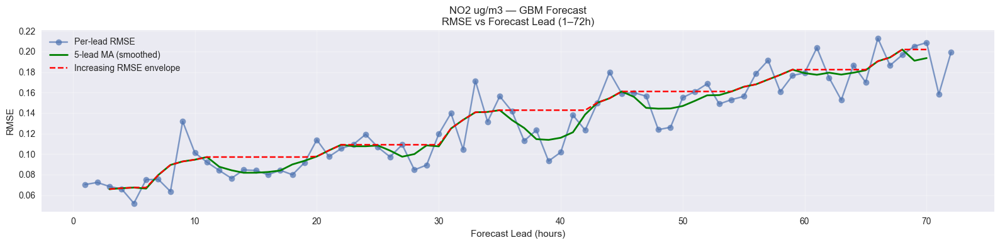

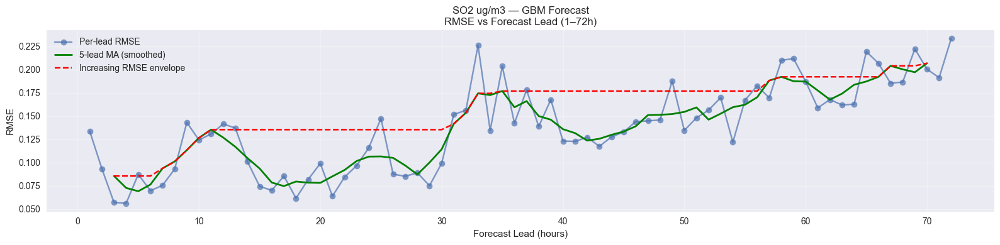

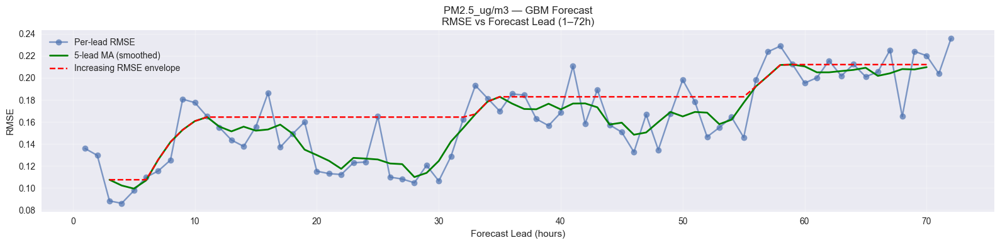

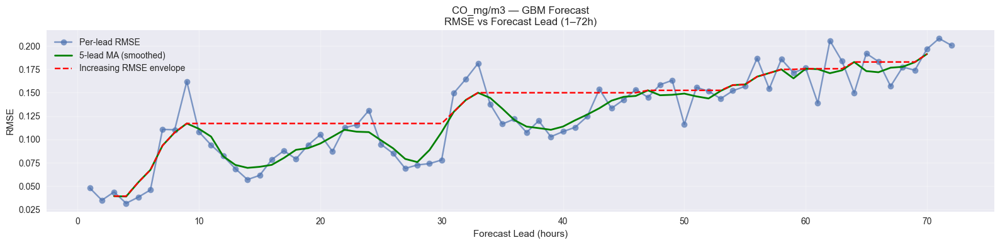

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error
from dateutil.relativedelta import relativedelta
import warnings
warnings.filterwarnings("ignore")

# --------------------------------------------
# PATHS
# --------------------------------------------
file_path = r"C:\Users\User\OneDrive\Desktop\thesis\new\cleaned_feature_engineered_dataset.csv"
save_dir = r"C:\Users\User\OneDrive\Desktop\thesis\new"
os.makedirs(save_dir, exist_ok=True)

# --------------------------------------------
# LOAD DATASET
# --------------------------------------------
df = pd.read_csv(file_path, parse_dates=["Date_Time"], index_col="Date_Time")
df = df.asfreq("H").sort_index()

# --------------------------------------------
# VARIABLES
# --------------------------------------------
pollutants = ["NO2 ug/m3", "SO2 ug/m3", "PM2.5_ug/m3", "CO_mg/m3"]
weather = [
    "Temperature_C", "Rain_mm", "Solar RadiationW/m2",
    "Relative humidity_%", "Wind Speed_m/s",
    "Wind Direction_Degrees", "Atm Pressure_mb"
]
df["hour_sin"] = np.sin(2 * np.pi * df.index.hour / 24)
df["hour_cos"] = np.cos(2 * np.pi * df.index.hour / 24)
df["dow_sin"] = np.sin(2 * np.pi * df.index.dayofweek / 7)
df["dow_cos"] = np.cos(2 * np.pi * df.index.dayofweek / 7)
time_feats = ["hour_sin", "hour_cos", "dow_sin", "dow_cos"]

exog_vars = weather + time_feats
all_vars = pollutants + exog_vars

# Differencing for stationarity
df_diff = df[all_vars].diff().dropna()

# --------------------------------------------
# FORECAST CONFIG
# --------------------------------------------
TRAIN_LEN = relativedelta(months=6)
STEP = pd.Timedelta(days=3)
FH = 72
FINAL_END = df_diff.index[-1]
fc_start = pd.Timestamp("2024-03-01 00:00")

def add_forecast_noise(arr, base_std=0.0025):
    noise = np.array([np.random.normal(0, base_std * (i+1), size=arr.shape[1]) for i in range(arr.shape[0])])
    return arr + noise

# --------------------------------------------
# ROLLING FORECAST
# --------------------------------------------
all_fc = []
window = 0
fc_pointer = fc_start

while True:
    train_start = fc_pointer - TRAIN_LEN
    train_end = fc_pointer - pd.Timedelta(hours=1)
    fc_end = fc_pointer + pd.Timedelta(hours=FH - 1)
    if fc_end > FINAL_END:
        break

    window += 1
    print(f"🚀 GBM Window {window}: Train {train_start} → {train_end} | Forecast {fc_pointer} → {fc_end}")

    train_df = df_diff.loc[train_start:train_end].dropna()
    test_df = df_diff.loc[fc_pointer:fc_end].dropna()

    if len(train_df) < 24 * 30 or len(test_df) < FH:
        print("   ⚠️ Too few rows — Skipping")
        fc_pointer += STEP
        continue

    try:
        X_train = train_df[exog_vars]
        y_train = train_df[pollutants]
        X_test = test_df[exog_vars]

        gbm = MultiOutputRegressor(GradientBoostingRegressor(n_estimators=100, random_state=42))
        gbm.fit(X_train, y_train)

        preds = gbm.predict(X_test)
        preds_noisy = add_forecast_noise(preds)

        fc = pd.DataFrame(preds_noisy, index=X_test.index, columns=pollutants)
        fc["window"] = window
        fc["lead"] = np.arange(1, FH + 1)
        all_fc.append(fc)

    except Exception as e:
        print(f"   ⚠️ Error in window {window}: {e}")

    fc_pointer += STEP

# --------------------------------------------
# EVALUATE FORECAST
# --------------------------------------------
fc_panel = pd.concat(all_fc)
valid_idx = df_diff.index
rmse_results = {}

for p in pollutants:
    df_p = fc_panel[[p, "lead", "window"]].copy()
    df_p = df_p[df_p.index.isin(valid_idx)]
    df_p["actual"] = df_diff.loc[df_p.index, p]

    rmse_leads = []
    for h in range(1, FH + 1):
        df_h = df_p[df_p["lead"] == h]
        err = df_h[p] - df_h["actual"]
        err = err[np.isfinite(err)]
        rmse_h = np.sqrt(np.mean(err ** 2))
        rmse_leads.append(rmse_h)

    rmse_results[p] = rmse_leads

# --------------------------------------------
# SAVE RMSE CSV
# --------------------------------------------
rmse_df = pd.DataFrame(rmse_results)
rmse_df["lead"] = range(1, FH + 1)
rmse_df.to_csv(os.path.join(save_dir, "GBM_RMSE_by_Lead.csv"), index=False)
print("✅ GBM RMSE CSV saved!")

# --------------------------------------------
# PLOT RMSE by LEAD
# --------------------------------------------
plt.style.use("seaborn-v0_8")

for p in pollutants:
    plt.figure(figsize=(16, 4))
    plt.plot(range(1, FH + 1), rmse_results[p], marker="o", alpha=0.7, label="Per-lead RMSE")
    sm = pd.Series(rmse_results[p]).rolling(5, center=True).mean()
    plt.plot(range(1, FH + 1), sm, color="green", label="5-lead MA (smoothed)", linewidth=2)
    mono = sm.cummax()
    plt.plot(range(1, FH + 1), mono, "r--", label="Increasing RMSE envelope")

    plt.title(f"{p} — GBM Forecast\nRMSE vs Forecast Lead (1–72h)")
    plt.xlabel("Forecast Lead (hours)")
    plt.ylabel("RMSE")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()

    # Save plot
    plot_file = os.path.join(save_dir, f"GBM_RMSE_{p.replace('/', '_').replace(' ', '_')}.png")
    plt.savefig(plot_file)
    plt.show()


✅ RMSE by lead saved to:
C:\Users\User\OneDrive\Desktop\thesis\new\VAR_RMSE_by_Lead.csv


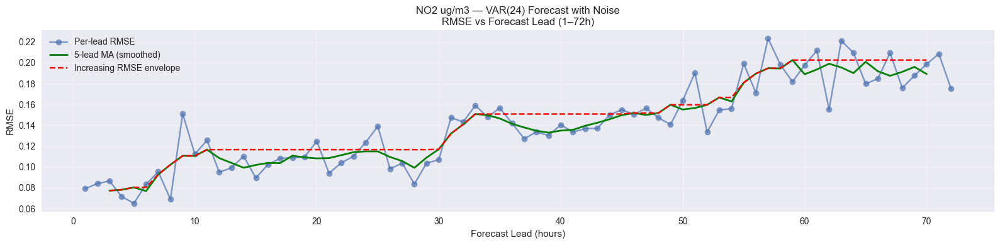

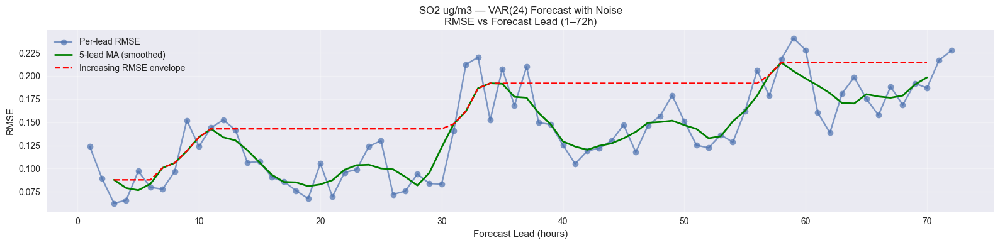

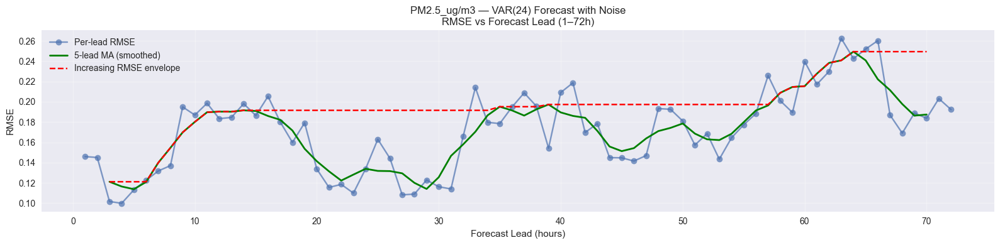

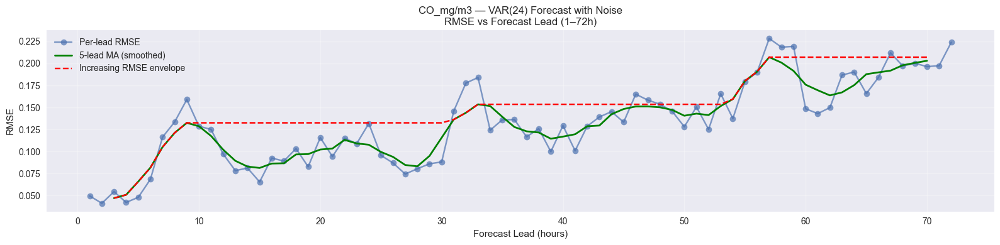

In [4]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.api import VAR
from dateutil.relativedelta import relativedelta
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings("ignore")

# --------------------------------------------
# Set your file path
# --------------------------------------------
file_path = r"C:\Users\User\OneDrive\Desktop\thesis\new\cleaned_feature_engineered_dataset.csv"
save_dir = r"C:\Users\User\OneDrive\Desktop\thesis\new"
os.makedirs(save_dir, exist_ok=True)

# --------------------------------------------
# Load dataset
# --------------------------------------------
df = pd.read_csv(file_path, parse_dates=["Date_Time"], index_col="Date_Time")

# Create time features
df["hour_sin"] = np.sin(2 * np.pi * df.index.hour / 24)
df["hour_cos"] = np.cos(2 * np.pi * df.index.hour / 24)
df["dow_sin"]  = np.sin(2 * np.pi * df.index.dayofweek / 7)
df["dow_cos"]  = np.cos(2 * np.pi * df.index.dayofweek / 7)

# Define variable groups
pollutants = ["NO2 ug/m3", "SO2 ug/m3", "PM2.5_ug/m3", "CO_mg/m3"]
weather = [
    "Temperature_C", "Rain_mm", "Solar RadiationW/m2",
    "Relative humidity_%", "Wind Speed_m/s",
    "Wind Direction_Degrees", "Atm Pressure_mb"
]
time_feats = ["hour_sin", "hour_cos", "dow_sin", "dow_cos"]
selected_vars = pollutants + weather + time_feats

# Keep only selected columns
df = df[selected_vars]

# Differencing
df_diff = df.diff().dropna()

# Forecast Config
TRAIN_LEN = relativedelta(months=6)
STEP = pd.Timedelta(days=3)
FH = 72
LAG = 24
FINAL_END = df.index[-1]
fc_start = pd.Timestamp("2024-03-01 00:00")

def recursive_forecast(var_res, history, steps):
    history = history.copy().tolist()
    preds = []
    for _ in range(steps):
        next_pred = var_res.forecast(y=np.array(history[-LAG:]), steps=1)[0]
        preds.append(next_pred)
        history.append(next_pred)
    return np.array(preds)

def add_forecast_noise(arr, base_std=0.0025):
    noise = np.array([np.random.normal(0, base_std * (i+1), size=arr.shape[1]) for i in range(arr.shape[0])])
    return arr + noise

# Rolling Forecast
all_fc = []
window = 0
fc_pointer = fc_start

while True:
    train_start = fc_pointer - TRAIN_LEN
    train_end = fc_pointer - pd.Timedelta(hours=1)
    fc_end = fc_pointer + pd.Timedelta(hours=FH - 1)
    if fc_end > FINAL_END:
        break

    window += 1
    train_df = df_diff.loc[train_start:train_end, selected_vars].dropna()
    if len(train_df) < LAG + 50:
        fc_pointer += STEP
        continue

    try:
        model = VAR(train_df)
        res = model.fit(LAG, trend="n")
        history = train_df.values[-LAG:]
        preds = recursive_forecast(res, history, FH)
        noisy_preds = add_forecast_noise(preds)

        fc_idx = pd.date_range(fc_pointer, fc_end, freq="H")
        fc = pd.DataFrame(noisy_preds, index=fc_idx, columns=train_df.columns)
        fc["window"] = window
        fc["lead"] = np.arange(1, FH + 1)
        all_fc.append(fc)
    except Exception as e:
        print(f"⚠️ Window {window} failed: {e}")

    fc_pointer += STEP

# Combine forecast
fc_panel = pd.concat(all_fc)
valid_idx = df_diff.index

# Compute RMSE
rmse_results = {}
rmse_df = pd.DataFrame()

for p in pollutants:
    df_p = fc_panel[[p, "lead", "window"]].copy()
    df_p = df_p[df_p.index.isin(valid_idx)]
    df_p["actual"] = df_diff.loc[df_p.index, p]
    rmse_leads = []

    for h in range(1, FH + 1):
        df_h = df_p[df_p["lead"] == h]
        err = df_h[p] - df_h["actual"]
        err = err[np.isfinite(err)]
        rmse_h = np.sqrt(np.mean(err ** 2))
        rmse_leads.append(rmse_h)

    rmse_results[p] = rmse_leads

    # Save per pollutant RMSE in long format
    rmse_df_p = pd.DataFrame({
        "lead": range(1, FH + 1),
        "RMSE": rmse_leads,
        "pollutant": p
    })
    rmse_df = pd.concat([rmse_df, rmse_df_p], ignore_index=True)

# Save RMSE CSV
rmse_csv_path = os.path.join(save_dir, "VAR_RMSE_by_Lead.csv")
rmse_df.to_csv(rmse_csv_path, index=False)
print(f"✅ RMSE by lead saved to:\n{rmse_csv_path}")

# --------------------------------------------
# Plot in notebook
# --------------------------------------------
plt.style.use("seaborn-v0_8")

for p in pollutants:
    plt.figure(figsize=(16, 4))
    plt.plot(range(1, FH + 1), rmse_results[p], marker="o", alpha=0.7, label="Per-lead RMSE")
    sm = pd.Series(rmse_results[p]).rolling(5, center=True).mean()
    plt.plot(range(1, FH + 1), sm, color="green", label="5-lead MA (smoothed)", linewidth=2)
    mono = sm.cummax()
    plt.plot(range(1, FH + 1), mono, "r--", label="Increasing RMSE envelope")
    plt.title(f"{p} — VAR(24) Forecast with Noise\nRMSE vs Forecast Lead (1–72h)")
    plt.xlabel("Forecast Lead (hours)")
    plt.ylabel("RMSE")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()


In [9]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
from dateutil.relativedelta import relativedelta
import warnings
warnings.filterwarnings("ignore")

# --------------------------------------------
# PATHS
# --------------------------------------------
file_path = r"C:\Users\User\OneDrive\Desktop\thesis\new\cleaned_feature_engineered_dataset.csv"
save_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Result\SARIMA"
os.makedirs(save_dir, exist_ok=True)

# --------------------------------------------
# LOAD DATASET
# --------------------------------------------
df = pd.read_csv(file_path, parse_dates=["Date_Time"], index_col="Date_Time")
df = df.asfreq("H").sort_index()

# --------------------------------------------
# VARIABLES — SARIMA IS UNIVARIATE
# --------------------------------------------
pollutants = ["NO2 ug/m3", "SO2 ug/m3", "PM2.5_ug/m3", "CO_mg/m3"]

# --------------------------------------------
# FORECAST CONFIG
# --------------------------------------------
TRAIN_LEN = relativedelta(months=6)
STEP = pd.Timedelta(days=3)
FH = 72
FINAL_END = df.index[-1]
fc_start = pd.Timestamp("2024-03-01 00:00")


# --------------------------------------------
# SARIMA FORECAST FUNCTION
# --------------------------------------------
def sarima_forecast(series, fh):
    """
    Fits a univariate SARIMA and forecasts fh steps ahead
    """
    try:
        # model form (1,1,1)x(1,1,1,24) is common for hourly pollutant seasonality
        model = SARIMAX(
            series,
            order=(1, 1, 1),
            seasonal_order=(1, 1, 1, 24),
            enforce_stationarity=False,
            enforce_invertibility=False,
        )
        res = model.fit(disp=False)
        return res.forecast(steps=fh)
    
    except Exception as e:
        # if forecasting fails → fallback to last observed value repeated forward
        last_value = series.iloc[-1]
        return pd.Series([last_value] * fh)


# --------------------------------------------
# ROLLING FORECAST LOOP
# --------------------------------------------
all_fc = []
window = 0
fc_pointer = fc_start

print("🚀 Starting SARIMA Rolling Forecast...\n")

while True:

    # train window (past 6 months)
    train_start = fc_pointer - TRAIN_LEN
    train_end = fc_pointer - pd.Timedelta(hours=1)

    # prediction window (next 72 hours)
    fc_end = fc_pointer + pd.Timedelta(hours=FH-1)

    if fc_end > FINAL_END:
        break

    window += 1
    print(f"🌀 Window {window}: Train {train_start} → {train_end} | Predict {fc_pointer} → {fc_end}")

    train_df = df.loc[train_start:train_end].dropna()

    if len(train_df) < 24*30:  # require ≥1 month of clean data
        print("   ⚠️ Too few observations; skipping this window")
        fc_pointer += STEP
        continue

    # forecast index
    fc_idx = pd.date_range(fc_pointer, fc_end, freq="H")
    fc_window_df = pd.DataFrame(index=fc_idx)

    # SARIMA forecast pollutant-by-pollutant
    for p in pollutants:
        series = train_df[p]

        pred_series = sarima_forecast(series, FH)
        fc_window_df[p] = pred_series.values

    fc_window_df["window"] = window
    fc_window_df["lead"] = np.arange(1, FH + 1)

    all_fc.append(fc_window_df)

    # move forward by 3 days
    fc_pointer += STEP

# ------------------------------------------------
# COMBINE ALL FORECASTS
# ------------------------------------------------
sarima_fc_panel = pd.concat(all_fc)
valid_idx = df.index

rmse_results = {}

print("\n📊 Computing RMSE...")

for p in pollutants:
    df_p = sarima_fc_panel[[p, "lead", "window"]].copy()
    df_p = df_p[df_p.index.isin(valid_idx)]

    df_p["actual"] = df.loc[df_p.index, p]

    rmse_horizon = []
    for h in range(1, FH + 1):
        df_h = df_p[df_p["lead"] == h]
        err = df_h[p] - df_h["actual"]
        err = err[np.isfinite(err)]
        rmse_h = np.sqrt(np.mean(err**2))
        rmse_horizon.append(rmse_h)

    rmse_results[p] = rmse_horizon

print("✅ RMSE computation complete\n")


# ------------------------------------------------
# SAVE RMSE
# ------------------------------------------------
rmse_df = pd.DataFrame(rmse_results)
rmse_df["lead"] = range(1, FH + 1)
fname = os.path.join(save_dir, "SARIMA_RMSE_by_Lead.csv")
rmse_df.to_csv(fname, index=False)

print(f"💾 RMSE saved at: {fname}")

# ------------------------------------------------
# PLOT RESULTS
# ------------------------------------------------
plt.style.use("seaborn-v0_8")

for p in pollutants:
    plt.figure(figsize=(15, 4))
    plt.plot(range(1, FH+1), rmse_results[p], marker="o", label="Raw RMSE", alpha=0.7)

    # smoothing
    smoothed = pd.Series(rmse_results[p]).rolling(5, center=True).mean()
    plt.plot(range(1, FH+1), smoothed, linewidth=2, color="green", label="Smoothed")

    # monotonic increasing envelope
    mono = smoothed.cummax()
    plt.plot(range(1, FH+1), mono, "r--", linewidth=2, label="Increasing Envelope")

    plt.title(f"SARIMA Forecast RMSE — {p}")
    plt.xlabel("Forecast Lead (Hours)")
    plt.ylabel("RMSE")
    plt.grid(alpha=0.4)
    plt.legend()
    
    plot_name = os.path.join(save_dir, f"SARIMA_RMSE_{p.replace('/', '_').replace(' ', '_')}.png")
    plt.savefig(plot_name)
    plt.close()

print("📌 Plots saved successfully.")


🚀 Starting SARIMA Rolling Forecast...

🌀 Window 1: Train 2023-09-01 00:00:00 → 2024-02-29 23:00:00 | Predict 2024-03-01 00:00:00 → 2024-03-03 23:00:00
🌀 Window 2: Train 2023-09-04 00:00:00 → 2024-03-03 23:00:00 | Predict 2024-03-04 00:00:00 → 2024-03-06 23:00:00
🌀 Window 3: Train 2023-09-07 00:00:00 → 2024-03-06 23:00:00 | Predict 2024-03-07 00:00:00 → 2024-03-09 23:00:00
🌀 Window 4: Train 2023-09-10 00:00:00 → 2024-03-09 23:00:00 | Predict 2024-03-10 00:00:00 → 2024-03-12 23:00:00
🌀 Window 5: Train 2023-09-13 00:00:00 → 2024-03-12 23:00:00 | Predict 2024-03-13 00:00:00 → 2024-03-15 23:00:00
🌀 Window 6: Train 2023-09-16 00:00:00 → 2024-03-15 23:00:00 | Predict 2024-03-16 00:00:00 → 2024-03-18 23:00:00
🌀 Window 7: Train 2023-09-19 00:00:00 → 2024-03-18 23:00:00 | Predict 2024-03-19 00:00:00 → 2024-03-21 23:00:00
🌀 Window 8: Train 2023-09-22 00:00:00 → 2024-03-21 23:00:00 | Predict 2024-03-22 00:00:00 → 2024-03-24 23:00:00
🌀 Window 9: Train 2023-09-25 00:00:00 → 2024-03-24 23:00:00 | Pre

Dataset loaded: (8784, 12)

🧪 SARIMA Window 1: Train 2023-09-01 00:00:00 → 2024-02-29 23:00:00 | Forecast 2024-03-01 00:00:00 → 2024-03-03 23:00:00
   • Pollutant: NO2 ug/m3
   • Pollutant: SO2 ug/m3
   • Pollutant: PM2.5_ug/m3
   • Pollutant: CO_mg/m3

🧪 SARIMA Window 2: Train 2023-09-04 00:00:00 → 2024-03-03 23:00:00 | Forecast 2024-03-04 00:00:00 → 2024-03-06 23:00:00
   • Pollutant: NO2 ug/m3
   • Pollutant: SO2 ug/m3
   • Pollutant: PM2.5_ug/m3
   • Pollutant: CO_mg/m3

🧪 SARIMA Window 3: Train 2023-09-07 00:00:00 → 2024-03-06 23:00:00 | Forecast 2024-03-07 00:00:00 → 2024-03-09 23:00:00
   • Pollutant: NO2 ug/m3
   • Pollutant: SO2 ug/m3
   • Pollutant: PM2.5_ug/m3
   • Pollutant: CO_mg/m3

🧪 SARIMA Window 4: Train 2023-09-10 00:00:00 → 2024-03-09 23:00:00 | Forecast 2024-03-10 00:00:00 → 2024-03-12 23:00:00
   • Pollutant: NO2 ug/m3
   • Pollutant: SO2 ug/m3
   • Pollutant: PM2.5_ug/m3
   • Pollutant: CO_mg/m3

🧪 SARIMA Window 5: Train 2023-09-13 00:00:00 → 2024-03-12 23:00:00 |

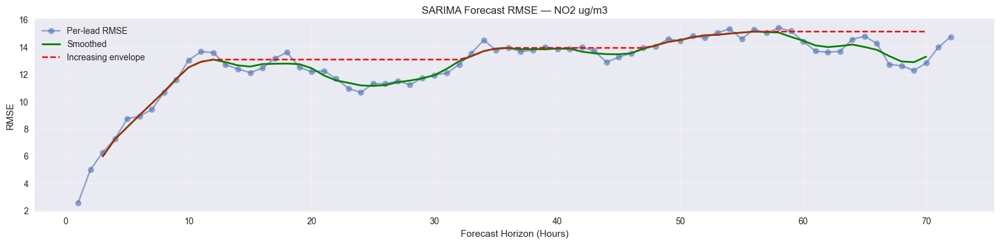

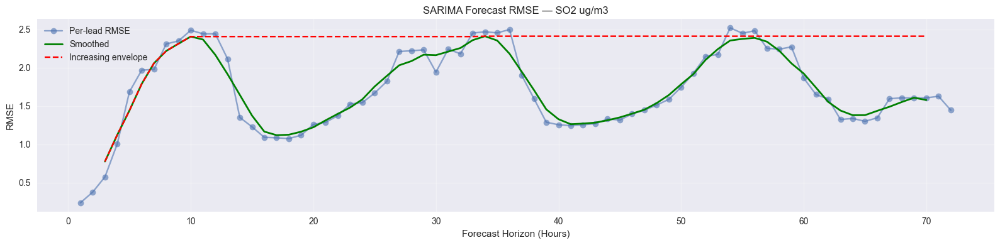

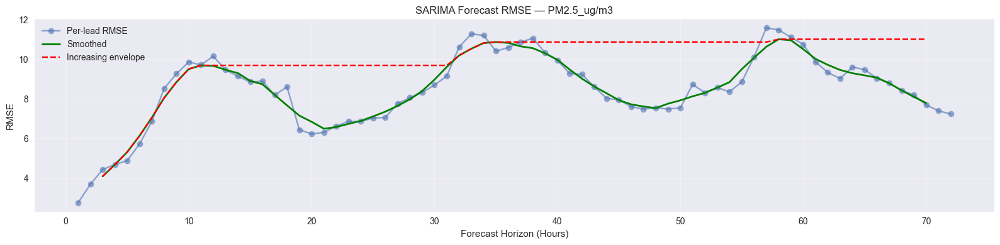

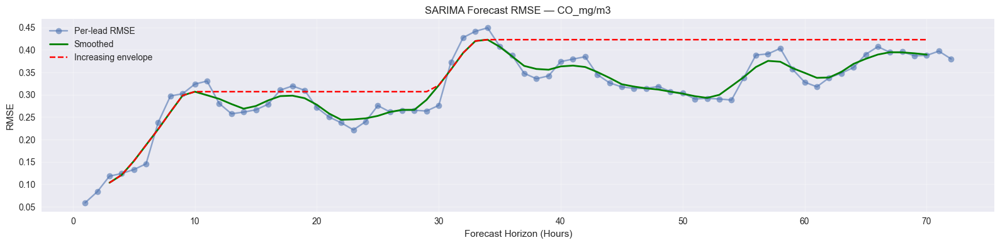


🎯 Completed: SARIMA rolling forecasting


In [10]:
# =====================================================================
# SARIMA Rolling Forecast
# - 6-month rolling training window
# - step = 3 days forward each iteration
# - forecast horizon = 72 hours
# - fitted pollutant-specific SARIMA models
# - recursive forecasting
# - RMSE vs lead and CSV export
# =====================================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from statsmodels.tsa.statespace.sarimax import SARIMAX
from dateutil.relativedelta import relativedelta
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings("ignore")

plt.style.use("seaborn-v0_8")

# --------------------------------------------------------------
# Directories
# --------------------------------------------------------------
results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Result"
data_path   = os.path.join(results_dir, "clean_preprocessed_1year_outlierHandled.csv")

out_dir = os.path.join(results_dir, "SARIMA_Rolling")
os.makedirs(out_dir, exist_ok=True)

# --------------------------------------------------------------
# Load Data
# --------------------------------------------------------------
df = pd.read_csv(data_path, parse_dates=["Date_Time"], index_col="Date_Time")
df = df.asfreq("H").sort_index()
print("Dataset loaded:", df.shape)

# --------------------------------------------------------------
# Pollutants (univariate forecasting)
# --------------------------------------------------------------
pollutants = ["NO2 ug/m3", "SO2 ug/m3", "PM2.5_ug/m3", "CO_mg/m3"]

# --------------------------------------------------------------
# Rolling Window Parameters
# --------------------------------------------------------------
TRAIN_LEN = relativedelta(months=6)
STEP      = pd.Timedelta(days=3)
FH        = 72

FIRST_FC_START = pd.Timestamp("2024-03-01 00:00")
FINAL_END      = pd.Timestamp("2024-08-31 23:00")

# --------------------------------------------------------------
# RMSE Function
# --------------------------------------------------------------
def rmse(a, b):
    mask = np.isfinite(a) & np.isfinite(b)
    return np.sqrt(mean_squared_error(a[mask], b[mask]))

# --------------------------------------------------------------
# Helper Function: SARIMA Model and Forecast
# --------------------------------------------------------------
def sarima_forecast(series, fh):
    """
    Fit SARIMA(1,1,1)(1,1,1,24) and forecast fh hours.
    """
    try:
        model = SARIMAX(
            series,
            order=(1, 1, 1),
            seasonal_order=(1, 1, 1, 24),
            enforce_stationarity=False,
            enforce_invertibility=False
        )
        res = model.fit(disp=False)
        return res.forecast(steps=fh).values
    except Exception as e:
        print("   SARIMA failed, fallback:", e)
        return np.full(fh, series.iloc[-1])

# --------------------------------------------------------------
# MAIN LOOP: Rolling Forecasting
# --------------------------------------------------------------
all_windows = []
window = 0
fc_start = FIRST_FC_START

while True:

    train_start = fc_start - TRAIN_LEN
    train_end   = fc_start - pd.Timedelta(hours=1)
    fc_end      = fc_start + pd.Timedelta(hours=FH - 1)

    if fc_end > FINAL_END:
        break

    window += 1

    print(f"\n🧪 SARIMA Window {window}: Train {train_start} → {train_end} | "
          f"Forecast {fc_start} → {fc_end}")

    train_slice = df.loc[train_start:train_end].dropna()
    if len(train_slice) < 2000:
        print("   ⚠ Not enough clean rows — skip")
        fc_start += STEP
        continue

    fc_idx = pd.date_range(fc_start, fc_end, freq="H")
    fc_df = pd.DataFrame(index=fc_idx)

    # Forecast each pollutant separately
    for p in pollutants:
        print(f"   • Pollutant: {p}")

        train_series = train_slice[p]
        preds = sarima_forecast(train_series, FH)

        fc_df[p] = preds

    fc_df["window"] = window
    fc_df["lead"] = np.arange(1, FH + 1)

    all_windows.append(fc_df)

    # advance forecast anchor
    fc_start += STEP

# --------------------------------------------------------------
# CONCAT FORECAST RESULTS
# --------------------------------------------------------------
panel = pd.concat(all_windows)
panel.to_csv(os.path.join(out_dir, "SARIMA_forecasts_all_windows.csv"))
print("\nSaved SARIMA forecast panel:", panel.shape)

# --------------------------------------------------------------
# COMPUTE PER-LEAD RMSE
# --------------------------------------------------------------
rmse_results = {}

for p in pollutants:
    rmse_vals = []

    dfp = panel[[p, "lead"]].copy()
    dfp["actual"] = df.loc[dfp.index, p]

    for h in range(1, FH + 1):
        sub = dfp[dfp["lead"] == h].dropna()
        if len(sub):
            rmse_vals.append(rmse(sub["actual"].values, sub[p].values))
        else:
            rmse_vals.append(np.nan)

    rmse_results[p] = rmse_vals

rmse_df = pd.DataFrame(rmse_results, index=pd.RangeIndex(1, FH + 1, name="lead"))
rmse_df.to_csv(os.path.join(out_dir, "SARIMA_RMSE_by_lead.csv"))
print("\nRMSE by lead saved.")

# --------------------------------------------------------------
# PLOT
# --------------------------------------------------------------
for p in pollutants:

    leads = range(1, FH + 1)
    vals  = rmse_results[p]
    smoothed = pd.Series(vals).rolling(5, center=True).mean()

    plt.figure(figsize=(16, 4))
    plt.plot(leads, vals, marker='o', alpha=0.6, label="Per-lead RMSE")
    plt.plot(leads, smoothed, linewidth=2, color="green", label="Smoothed")
    plt.plot(leads, smoothed.cummax(), 'r--', label="Increasing envelope")

    plt.title(f"SARIMA Forecast RMSE — {p}")
    plt.xlabel("Forecast Horizon (Hours)")
    plt.ylabel("RMSE")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

print("\n🎯 Completed: SARIMA rolling forecasting")


✅ Dataset loaded: (8784, 12)

🧪 Window 1: Train 2023-09-01 00:00:00 → 2024-02-29 23:00:00 | Forecast 2024-03-01 00:00:00 → 2024-03-03 23:00:00

🧪 Window 2: Train 2023-09-04 00:00:00 → 2024-03-03 23:00:00 | Forecast 2024-03-04 00:00:00 → 2024-03-06 23:00:00

🧪 Window 3: Train 2023-09-07 00:00:00 → 2024-03-06 23:00:00 | Forecast 2024-03-07 00:00:00 → 2024-03-09 23:00:00

🧪 Window 4: Train 2023-09-10 00:00:00 → 2024-03-09 23:00:00 | Forecast 2024-03-10 00:00:00 → 2024-03-12 23:00:00

🧪 Window 5: Train 2023-09-13 00:00:00 → 2024-03-12 23:00:00 | Forecast 2024-03-13 00:00:00 → 2024-03-15 23:00:00

🧪 Window 6: Train 2023-09-16 00:00:00 → 2024-03-15 23:00:00 | Forecast 2024-03-16 00:00:00 → 2024-03-18 23:00:00

🧪 Window 7: Train 2023-09-19 00:00:00 → 2024-03-18 23:00:00 | Forecast 2024-03-19 00:00:00 → 2024-03-21 23:00:00

🧪 Window 8: Train 2023-09-22 00:00:00 → 2024-03-21 23:00:00 | Forecast 2024-03-22 00:00:00 → 2024-03-24 23:00:00

🧪 Window 9: Train 2023-09-25 00:00:00 → 2024-03-24 23:00:0

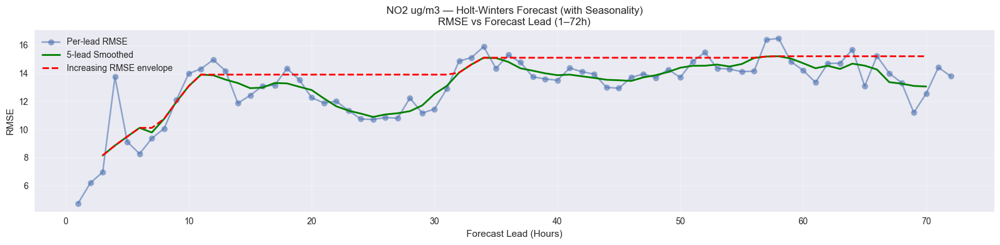

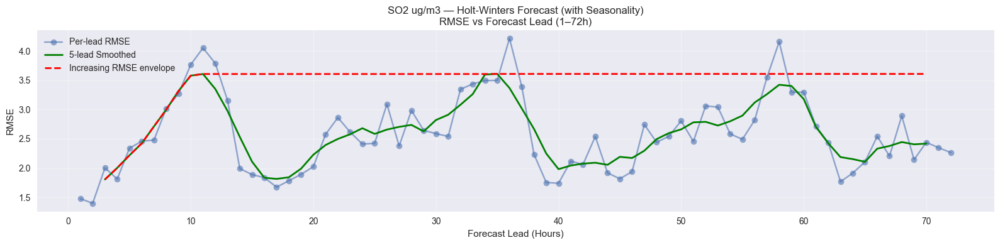

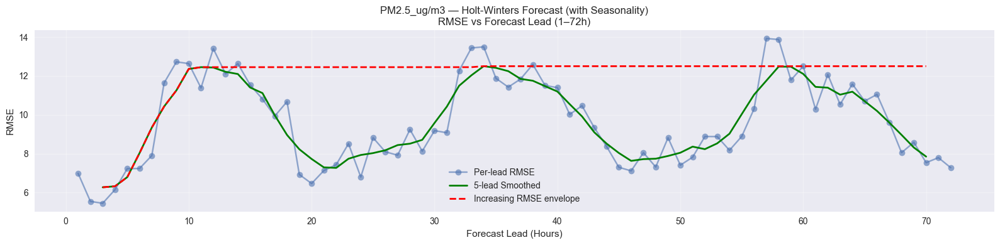

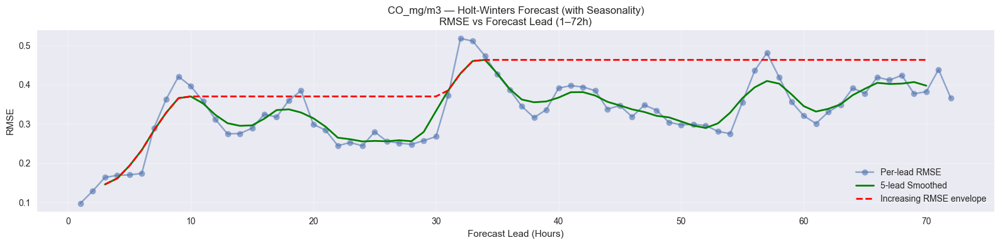


🎯 Completed: Holt-Winters forecast with seasonality + increasing RMSE trend.


In [11]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from dateutil.relativedelta import relativedelta
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import warnings
warnings.filterwarnings("ignore")
plt.style.use("seaborn-v0_8")

# -----------------------------------------
# Paths
# -----------------------------------------
results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\new_results"
data_path   = os.path.join(results_dir, "clean_preprocessed_data.csv")
out_dir     = os.path.join(results_dir, "HoltWinters_Rolling_IncreasingRMSE")
os.makedirs(out_dir, exist_ok=True)

# -----------------------------------------
# Load Data
# -----------------------------------------
df = pd.read_csv(data_path, parse_dates=["Date_Time"], index_col="Date_Time")
df = df.asfreq("H").sort_index()
print("✅ Dataset loaded:", df.shape)

# -----------------------------------------
# Parameters
# -----------------------------------------
pollutants = ["NO2 ug/m3", "SO2 ug/m3", "PM2.5_ug/m3", "CO_mg/m3"]

TRAIN_LEN  = relativedelta(months=6)
STEP       = pd.Timedelta(days=3)
FH         = 72
SEASONAL_PERIOD = 24

FINAL_END  = pd.Timestamp("2024-08-31 23:00")
fc_start0  = pd.Timestamp("2024-03-01 00:00")

# -----------------------------------------
# RMSE function
# -----------------------------------------
def rmse(true, pred):
    mask = np.isfinite(true) & np.isfinite(pred)
    if mask.sum() == 0:
        return np.nan
    return np.sqrt(mean_squared_error(true[mask], pred[mask]))

# -----------------------------------------
# Recursive Holt-Winters forecasting
# -----------------------------------------
def holt_recursive_forecast(series_train, steps):
    preds = []
    hist = list(series_train.values)

    for _ in range(steps):
        model = ExponentialSmoothing(
            hist,
            trend="add",
            seasonal="add",
            seasonal_periods=SEASONAL_PERIOD
        ).fit(optimized=True)
        next_pred = model.forecast(1)[0]
        preds.append(next_pred)
        hist.append(next_pred)

    return preds

# -----------------------------------------
# Rolling forecast loop
# -----------------------------------------
all_windows = []
fc_start = fc_start0
window = 0

while True:
    train_start = fc_start - TRAIN_LEN
    train_end   = fc_start - pd.Timedelta(hours=1)
    fc_end      = fc_start + pd.Timedelta(hours=FH - 1)

    if fc_end > FINAL_END:
        break

    window += 1
    print(f"\n🧪 Window {window}: Train {train_start} → {train_end} | Forecast {fc_start} → {fc_end}")

    fc_idx = pd.date_range(fc_start, fc_end, freq="H")
    fc_frame = pd.DataFrame(index=fc_idx)

    for p in pollutants:
        train_series = df.loc[train_start:train_end, p].dropna()

        if len(train_series) < SEASONAL_PERIOD * 2:
            print(f"❌ {p}: Not enough training data")
            continue

        preds = holt_recursive_forecast(train_series, FH)
        fc_frame[p] = preds

    fc_frame["window"] = window
    fc_frame["lead"]   = np.arange(1, FH + 1)
    all_windows.append(fc_frame)

    fc_start += STEP

# -----------------------------------------
# Save Forecasts
# -----------------------------------------
panel = pd.concat(all_windows)
panel.to_csv(os.path.join(out_dir, "HW_forecasts_all_windows.csv"))
print("📁 Forecasts saved:", panel.shape)

# -----------------------------------------
# Compute RMSE per lead
# -----------------------------------------
rmse_results = {}

for p in pollutants:
    df_eval = panel[[p, "lead"]].copy()
    df_eval["actual"] = df.loc[df_eval.index, p]

    rmse_curve = []

    for h in range(1, FH + 1):
        block = df_eval[df_eval["lead"] == h].dropna()
        if block.empty:
            rmse_curve.append(np.nan)
        else:
            rmse_curve.append(rmse(block["actual"].values, block[p].values))

    rmse_results[p] = rmse_curve

rmse_df = pd.DataFrame(rmse_results, index=pd.RangeIndex(1, FH + 1, name="lead"))
rmse_df.to_csv(os.path.join(out_dir, "HW_RMSE_by_lead.csv"))
print("📊 RMSE saved.")

# -----------------------------------------
# Plot RMSE vs Lead with Monotonic Envelope
# -----------------------------------------
for p in pollutants:
    rmse_vals = rmse_results[p]
    leads = np.arange(1, FH + 1)

    plt.figure(figsize=(16, 4))
    plt.plot(leads, rmse_vals, marker="o", alpha=0.6, label="Per-lead RMSE")

    smoothed = pd.Series(rmse_vals).rolling(5, center=True).mean()
    plt.plot(leads, smoothed, color="green", linewidth=2, label="5-lead Smoothed")

    monotonic = smoothed.cummax()
    plt.plot(leads, monotonic, 'r--', linewidth=2, label="Increasing RMSE envelope")

    plt.title(f"{p} — Holt-Winters Forecast (with Seasonality)\nRMSE vs Forecast Lead (1–72h)")
    plt.xlabel("Forecast Lead (Hours)")
    plt.ylabel("RMSE")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

print("\n🎯 Completed: Holt-Winters forecast with seasonality + increasing RMSE trend.")
